# Explore differential expression analysis results

In [1146]:
# -- 3. Calculate the Silhouette Score with distance to centroid --
# A custom function is required for this specific metric variation.
def silhouette_centroid_score(X, labels):
    """
    Calculates a modified Silhouette Score using distance to cluster centroids.
    
    Args:
        X (np.ndarray): The data matrix (e.g., PCA-reduced data).
        labels (pd.Series): The cluster labels for each data point.
        
    Returns:
        float: The average Silhouette Score.
    """
    # Get unique cluster labels
    unique_labels = np.unique(labels)
    
    # Calculate centroids for each cluster
    centroids = {label: X[labels == label].mean(axis=0) for label in unique_labels}
    
    silhouette_scores = []
    
    for i, point in enumerate(X):
        point_label = labels.iloc[i]

        if np.sum(labels==point_label)>1:
            # Calculate 'a': distance to own cluster's centroid
            a = euclidean_distances([point], [centroids[point_label]])[0][0]
            
            # Calculate 'b': min distance to other clusters' centroids
            min_b = float('inf')
            for other_label in unique_labels:
                if other_label != point_label:
                    distance_to_other_centroid = euclidean_distances([point], [centroids[other_label]])[0][0]
                    if distance_to_other_centroid < min_b:
                        min_b = distance_to_other_centroid
            b = min_b
            
            # Calculate silhouette score for the point
            s = (b - a) / max(a, b)
        else:
            s = 0
        
        silhouette_scores.append(s)

    return silhouette_scores
    #return np.mean(silhouette_scores)

### Note:
fixed non-reproducibility of pymde by
1. add random seed option in preprocess.sample_edges
2. add deterministic v0 = np.arange(L.shape[0], dtype=float) in _spectral() function in quadratic.py

In [1]:
import os,sys
import numpy as np
import anndata as ad
import pandas as pd
import mudata as md
import scanpy as sc
import glob
from tqdm import tqdm
import scipy
import ast

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pymde
import hdbscan
import torch

from sklearn.neighbors import LocalOutlierFactor
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import dendrogram, linkage
import scipy.spatial.distance as dist
from scipy.stats import hypergeom
from sklearn.manifold import SpectralEmbedding
from statsmodels.sandbox.stats.multicomp import multipletests
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

import matplotlib.cm as cm
import matplotlib.colors as mcolors 
import timeit

sys.path.append('../3_DE_analysis/')
from DE_analysis_utils import *

pd.set_option('display.max_rows', 100)

In [163]:
datadir = '/Users/rzhu/Gladstone Dropbox/Ronghui Zhu/GRNPerturbSeq/3_expts/processed_data/CD4i_final'
experiment_name = 'CD4i_final'

## Read best DE results, filter based on number of DE genes and correlations with other perturbations

In [164]:
adata_de = sc.read_h5ad(datadir + f'/DE_results_all_confounders/{experiment_name}.merged_DE_results.h5ad')

In [165]:
adata_de.layers['zscore'] = adata_de.layers['log_fc'] / adata_de.layers['lfcSE']
adata_de.layers['zscore'][np.where(adata_de.layers['zscore'] > 50)] = 50

In [94]:
de_counts = get_de_stats(adata_de, effect_col='zscore', signif_col='adj_p_value', alpha=0.1)

In [166]:
mask = (de_counts.n_total_de_genes>50) & (de_counts.n_cells_target>100)# & (adata_de.obs.culture_condition=='Stim48hr')
#mask = mask & (adata_de.obs.target_contrast_gene_name.str.startswith(('COX', 'DPH', 'SMG', 'TAF', 'MED', 'MRPL', 'MRPS')))
adata_de_filtered = adata_de[mask].copy()
adata_de_filtered.var_names = adata_de_filtered.var.gene_name
adata_de_filtered.X = np.nan_to_num(adata_de_filtered.layers['zscore'], 0)
#adata_de_filtered = adata_de_filtered[:,np.abs(adata_de_filtered.X).sum(0)>1500].copy()
#adata_de_filtered.obs['reverse'] = False
#adata_de_reverse = adata_de_filtered.copy()
#adata_de_reverse.obs_names = adata_de_reverse.obs_names + ['_reverse']
#adata_de_reverse.X = -adata_de_reverse.X
#adata_de_reverse.obs['reverse'] = True
#adata_de_filtered = ad.concat([adata_de_filtered, adata_de_reverse])

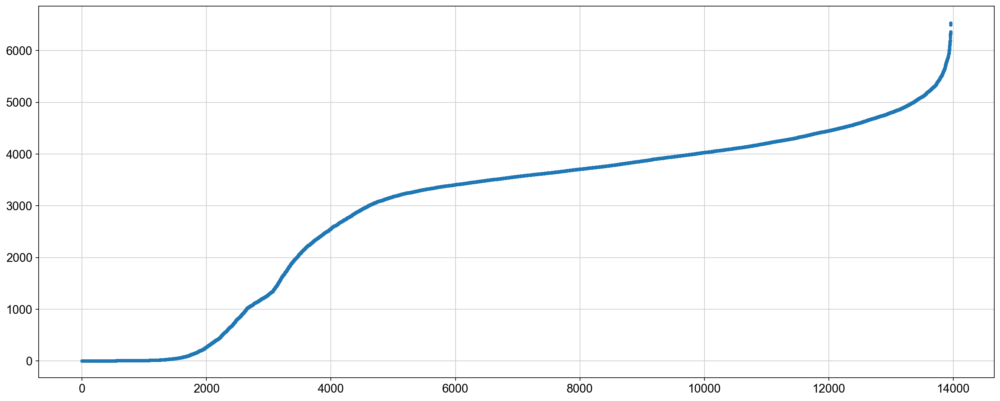

In [167]:
plt.plot(np.sort(np.abs(adata_de_filtered.X).sum(0)), '.')

In [99]:
adata_de_filtered.write_h5ad('../../../RZAnalysisCodes/results/adata_de_de50ntotal100.h5ad')
#adata_de_filtered = sc.read_h5ad('../../../RZAnalysisCodes/results/adata_de_de50ntotal100.h5ad')

In [100]:
adata_de_filtered

AnnData object with n_obs × n_vars = 4675 × 11063
    obs: 'target_contrast_gene_name', 'culture_condition', 'target_contrast', 'chunk', 'n_cells_target'
    var: 'gene_ids', 'gene_name'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'p_value', 'zscore'

### Simple PCA clustering

In [168]:
adata = adata_de_filtered.copy()
sc.pp.scale(adata)

In [169]:
sc.pp.pca(adata, n_comps=150)

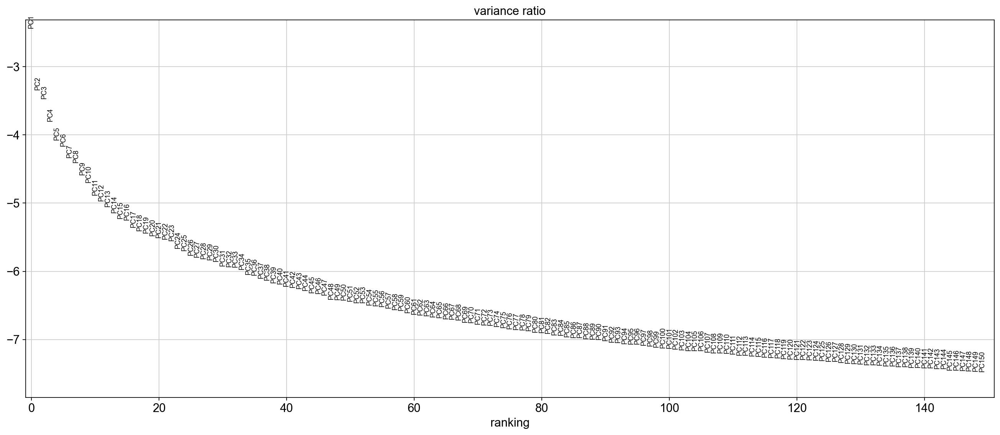

In [170]:
sc.set_figure_params(figsize=(20, 8))
sc.pl.pca_variance_ratio(adata, n_pcs=150, log=True)

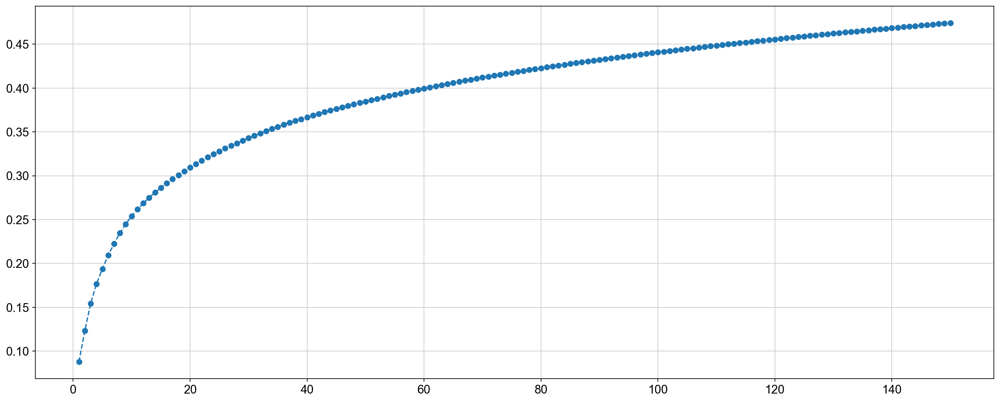

In [171]:
variance_ratio = adata.uns['pca']['variance_ratio']
cumulative_variance_ratio = np.cumsum(variance_ratio)
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o', linestyle='--')

In [172]:
n_comp_all = [20, 60, 100]
n_neighbor_all = [15, 31, 63]
resolution_all = [1, 2, 3]
clustering_all = []
for n_comp in n_comp_all:
    for n_neighbor in n_neighbor_all:
        sc.pp.neighbors(adata, n_pcs=n_comp, n_neighbors=n_neighbor, random_state=42)
        print(f'{n_comp} {n_neighbor}')
        for resolution in resolution_all:
            sc.tl.leiden(adata, resolution=resolution, random_state=42)
            adata.obs['leiden'] = adata.obs['leiden'].astype(int)
            adata.obs['leiden'] = adata.obs['leiden'].astype('category')
            cluster_labels_numerical = adata.obs['leiden'].cat.codes
            sil_score_raw = silhouette_score(adata.X, cluster_labels_numerical)
            sil_score_pca = silhouette_score(adata.obsm['X_pca'][:,:n_comp], cluster_labels_numerical)
            ch_score_raw = calinski_harabasz_score(adata.X, cluster_labels_numerical)
            ch_score_pca = calinski_harabasz_score(adata.obsm['X_pca'][:,:n_comp], cluster_labels_numerical)
            db_score_raw = davies_bouldin_score(adata.X, cluster_labels_numerical)
            db_score_pca = davies_bouldin_score(adata.obsm['X_pca'][:,:n_comp], cluster_labels_numerical)
    
            clustering_all.append({'n_comp':n_comp,
                                   'n_neighbor':n_neighbor,
                                   'resolution':resolution,
                                   'sil_score_raw': sil_score_raw,
                                   'sil_score_pca': sil_score_pca,
                                   'ch_score_raw': ch_score_raw,
                                   'ch_score_pca': ch_score_pca,
                                   'db_score_raw': db_score_raw,
                                   'db_score_pca': db_score_pca,
                                   'leiden_assignment': adata.obs['leiden'].values.tolist()})

clustering_summary = pd.DataFrame(clustering_all)

20 15
20 31
20 63
60 15
60 31
60 63
100 15
100 31
100 63


In [173]:
clustering_summary.to_parquet('../../../RZAnalysisCodes/results/pca_params_screening_de50ntotal100_high_ncomp_low_nneighbor_high_resolution.parquet')

In [157]:
clustering_summary = pd.read_parquet('../../../RZAnalysisCodes/results/pca_params_screening_de30ntotal75.parquet')

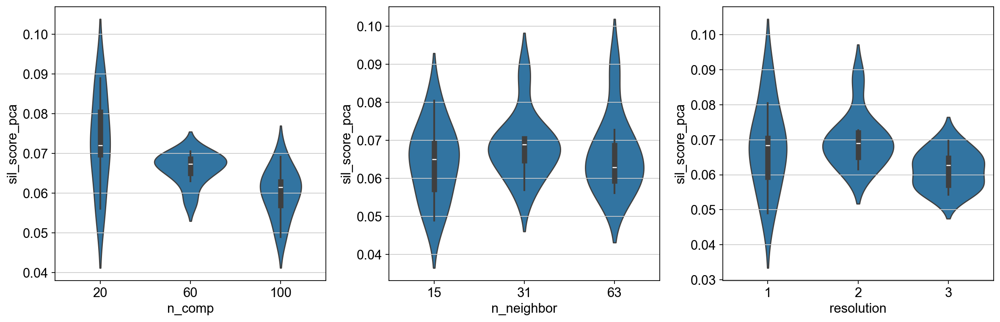

In [174]:
params = ['n_comp', 'n_neighbor', 'resolution']
fig, axes = plt.subplots(1,len(params),figsize=(len(params)*5,5))
ax = axes.flatten()
for i, param in enumerate(params):
    sns.violinplot(clustering_summary, x=param, y='sil_score_pca', ax=ax[i])
plt.tight_layout()

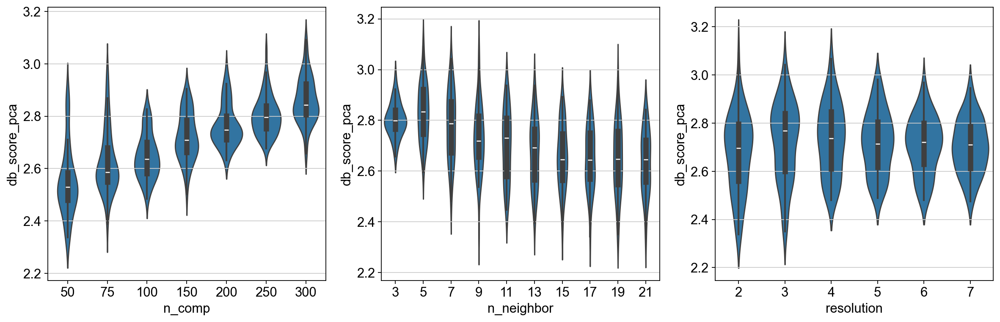

In [155]:
params = ['n_comp', 'n_neighbor', 'resolution']
fig, axes = plt.subplots(1,len(params),figsize=(len(params)*5,5))
ax = axes.flatten()
for i, param in enumerate(params):
    sns.violinplot(clustering_summary, x=param, y='db_score_pca', ax=ax[i])
plt.tight_layout()

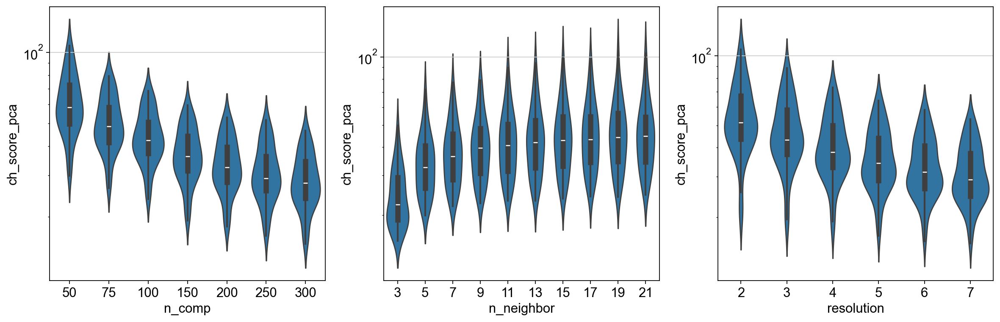

In [156]:
params = ['n_comp', 'n_neighbor', 'resolution']
fig, axes = plt.subplots(1,len(params),figsize=(len(params)*5,5))
ax = axes.flatten()
for i, param in enumerate(params):
    sns.violinplot(clustering_summary, x=param, y='ch_score_pca', ax=ax[i], log_scale=True)
plt.tight_layout()

In [111]:
n_comp_all = [20, 30, 40, 50, 60, 70]
n_neighbor_all = [15, 31, 51, 73, 97, 123, 151, 185, 225]
resolution_all = [1, 1.5, 2, 3, 4]
clustering_all = []
for n_comp in n_comp_all:
    sc.pp.pca(adata, n_comps=n_comp)
    for n_neighbor in n_neighbor_all:
        sc.pp.neighbors(adata, n_neighbors=n_neighbor, random_state=42)
        print(f'{n_comp} {n_neighbor}')
        for resolution in resolution_all:
            sc.tl.leiden(adata, resolution=resolution, random_state=42)
            adata.obs['leiden'] = adata.obs['leiden'].astype(int)
            adata.obs['leiden'] = adata.obs['leiden'].astype('category')
            cluster_labels_numerical = adata.obs['leiden'].cat.codes
            sil_score_raw = silhouette_score(adata.X, cluster_labels_numerical)
            sil_score_pca = silhouette_score(adata.obsm['X_pca'][:,:n_comp], cluster_labels_numerical)
            ch_score_raw = calinski_harabasz_score(adata.X, cluster_labels_numerical)
            ch_score_pca = calinski_harabasz_score(adata.obsm['X_pca'][:,:n_comp], cluster_labels_numerical)
            db_score_raw = davies_bouldin_score(adata.X, cluster_labels_numerical)
            db_score_pca = davies_bouldin_score(adata.obsm['X_pca'][:,:n_comp], cluster_labels_numerical)
    
            clustering_all.append({'n_comp':n_comp,
                                   'n_neighbor':n_neighbor,
                                   'resolution':resolution,
                                   'sil_score_raw': sil_score_raw,
                                   'sil_score_pca': sil_score_pca,
                                   'ch_score_raw': ch_score_raw,
                                   'ch_score_pca': ch_score_pca,
                                   'db_score_raw': db_score_raw,
                                   'db_score_pca': db_score_pca,
                                   'leiden_assignment': adata.obs['leiden'].values.tolist()})

clustering_summary = pd.DataFrame(clustering_all)

20 15
20 31
20 51
20 73
20 97
20 123
20 151
20 185
20 225
30 15
30 31
30 51
30 73
30 97
30 123
30 151
30 185
30 225
40 15
40 31
40 51
40 73
40 97
40 123
40 151
40 185
40 225
50 15
50 31
50 51
50 73
50 97
50 123
50 151
50 185
50 225
60 15
60 31
60 51
60 73
60 97
60 123
60 151
60 185
60 225
70 15
70 31
70 51
70 73
70 97
70 123
70 151
70 185
70 225


In [112]:
clustering_summary.to_parquet('../../../RZAnalysisCodes/results/pca_params_screening_de30ntotal75.parquet')

In [113]:
clustering_summary

,n_comp,n_neighbor,resolution,sil_score_raw,sil_score_pca,ch_score_raw,ch_score_pca,db_score_raw,db_score_pca,leiden_assignment
0,20,15,1.0,0.008639,0.069077,46.045662,226.217812,4.800436,2.109676,"[3, 6, 3, 3, 6, 4, 10, 8, 10, 7, 0, 0, 0, 4, 0..."
1,20,15,1.5,0.007108,0.044815,35.081265,184.624789,4.931555,2.075768,"[6, 1, 6, 8, 1, 5, 12, 5, 12, 7, 14, 14, 14, 9..."
2,20,15,2.0,0.008678,0.061950,29.882704,163.262431,5.220306,2.165156,"[4, 23, 4, 5, 2, 26, 8, 18, 8, 16, 15, 21, 21,..."
3,20,15,3.0,0.004939,0.039566,22.845771,128.940191,5.226345,2.214575,"[5, 29, 5, 20, 8, 23, 3, 14, 3, 11, 10, 31, 15..."
4,20,15,4.0,0.004500,0.037651,18.482908,106.871666,5.205957,2.229298,"[10, 27, 18, 18, 15, 20, 2, 14, 2, 3, 35, 35, ..."
...,...,...,...,...,...,...,...,...,...,...
265,70,225,1.0,0.007758,0.051542,47.512237,141.856836,4.802085,2.589469,"[4, 2, 2, 4, 2, 2, 6, 9, 6, 0, 1, 1, 1, 2, 1, ..."
266,70,225,1.5,0.008706,0.058191,38.744825,121.209065,4.650407,2.482977,"[3, 1, 13, 3, 1, 15, 8, 11, 8, 7, 0, 0, 4, 1, ..."
267,70,225,2.0,0.015091,0.059606,31.371081,102.231164,4.721994,2.486109,"[8, 5, 19, 19, 3, 20, 10, 17, 10, 6, 0, 14, 14..."
268,70,225,3.0,0.008882,0.041097,24.701698,82.242712,4.762295,2.545574,"[6, 3, 18, 18, 4, 24, 11, 15, 11, 9, 8, 8, 8, ..."


In [138]:
adata.obsp['connectivities'].toarray().flatten()

array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)

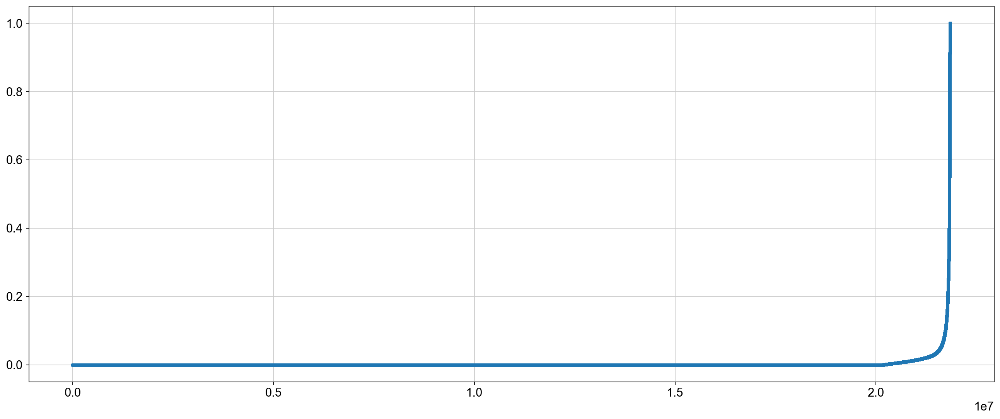

In [139]:
plt.plot(np.sort(adata.obsp['connectivities'].toarray().flatten()), '.')

In [141]:
n_comp, n_neighbor, resolution

(70, 225, 4)

In [ ]:
adata[adata.obs.target_contrast_gene_name.str.startswith(('SMG', 'DPH', 'TSC', 'NPLR'))].obs.sort_values(by='target_contrast_gene_name')

In [ ]:
adata[adata.obs.leiden==24].obs.sort_values(by='target_contrast_gene_name')

In [59]:
clustering_summary = pd.read_parquet('../../../RZAnalysisCodes/results/pca_params_screening_de50ntotal100.parquet')

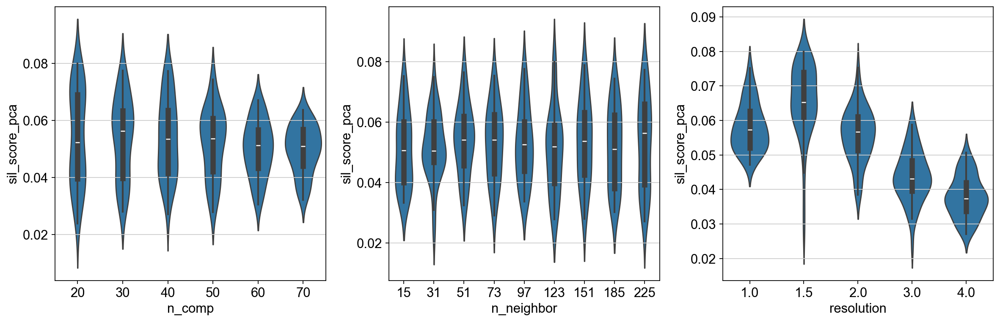

In [114]:
params = ['n_comp', 'n_neighbor', 'resolution']
fig, axes = plt.subplots(1,len(params),figsize=(len(params)*5,5))
ax = axes.flatten()
for i, param in enumerate(params):
    sns.violinplot(clustering_summary, x=param, y='sil_score_pca', ax=ax[i])
plt.tight_layout()

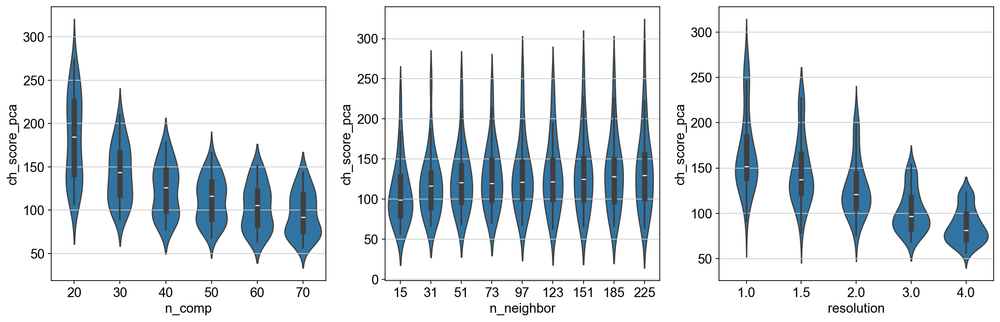

In [116]:
params = ['n_comp', 'n_neighbor', 'resolution']
fig, axes = plt.subplots(1,len(params),figsize=(len(params)*5,5))
ax = axes.flatten()
for i, param in enumerate(params):
    sns.violinplot(clustering_summary, x=param, y='ch_score_pca', ax=ax[i])
plt.tight_layout()

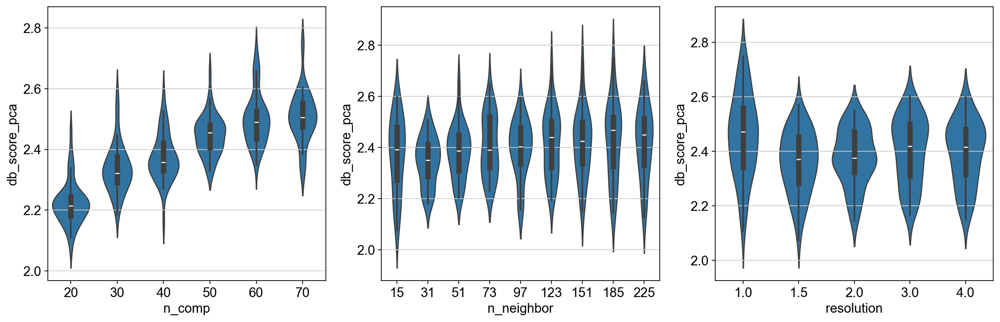

In [144]:
params = ['n_comp', 'n_neighbor', 'resolution']
fig, axes = plt.subplots(1,len(params),figsize=(len(params)*5,5))
ax = axes.flatten()
for i, param in enumerate(params):
    sns.violinplot(clustering_summary, x=param, y='db_score_pca', ax=ax[i])
plt.tight_layout()

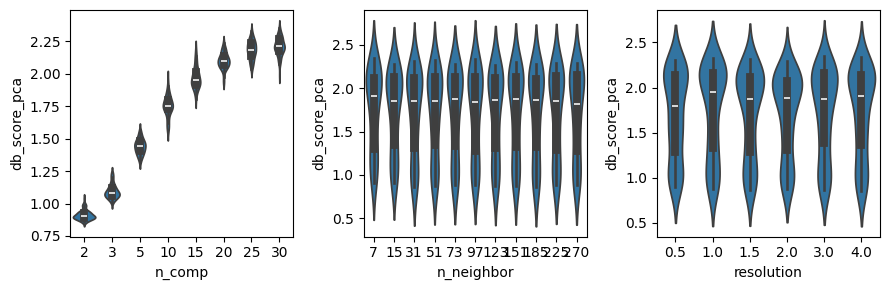

In [53]:
params = ['n_comp', 'n_neighbor', 'resolution']
fig, axes = plt.subplots(1,len(params),figsize=(len(params)*3,3))
ax = axes.flatten()
for i, param in enumerate(params):
    sns.violinplot(clustering_summary, x=param, y='db_score_pca', ax=ax[i])
plt.tight_layout()

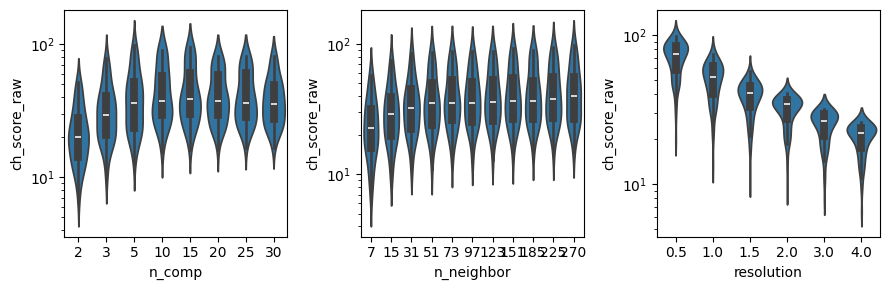

In [54]:
params = ['n_comp', 'n_neighbor', 'resolution']
fig, axes = plt.subplots(1,len(params),figsize=(len(params)*3,3))
ax = axes.flatten()
for i, param in enumerate(params):
    sns.violinplot(clustering_summary, x=param, y='ch_score_raw', ax=ax[i], log_scale=True)
plt.tight_layout()

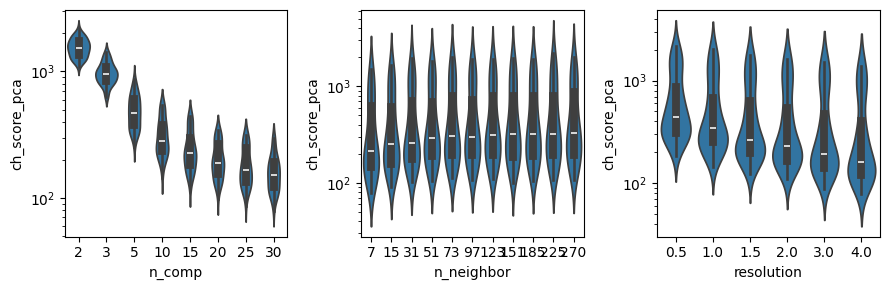

In [55]:
params = ['n_comp', 'n_neighbor', 'resolution']
fig, axes = plt.subplots(1,len(params),figsize=(len(params)*3,3))
ax = axes.flatten()
for i, param in enumerate(params):
    sns.violinplot(clustering_summary, x=param, y='ch_score_pca', ax=ax[i], log_scale=True)
plt.tight_layout()

In [ ]:
embedding = pymde.preserve_neighbors(
    data=adata.X,
    embedding_dim=10,
    n_neighbors=5,
    repulsive_fraction=1,
    random_state=41
).embed(verbose=True)
adata.obsm['X_mde'] = embedding.numpy()

In [48]:
sc.pp.neighbors(adata, n_neighbors=500, use_rep='X_mde', random_state=42)
#sc.pp.neighbors(adata, n_neighbors=40, random_state=42)
sc.tl.leiden(adata, resolution=1, random_state=42)
adata.obs['leiden'] = adata.obs['leiden'].astype(int)
adata.obs['leiden'] = adata.obs['leiden'].astype('category')
cluster_labels_numerical = adata.obs['leiden'].cat.codes

In [118]:
adata[adata.obs.target_contrast_gene_name.str.startswith(('SMG', 'DPH', 'TAF5L', 'MED12'))].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000108963_Stim8hr,DPH1,Stim8hr,ENSG00000108963,550,233.0,5
ENSG00000108963_Rest,DPH1,Rest,ENSG00000108963,480,148.0,48
ENSG00000108963_Stim48hr,DPH1,Stim48hr,ENSG00000108963,457,108.0,48
ENSG00000132768_Rest,DPH2,Rest,ENSG00000132768,653,328.0,48
ENSG00000132768_Stim48hr,DPH2,Stim48hr,ENSG00000132768,220,215.0,48
ENSG00000117543_Rest,DPH5,Rest,ENSG00000117543,6,400.0,48
ENSG00000117543_Stim8hr,DPH5,Stim8hr,ENSG00000117543,636,289.0,5
ENSG00000117543_Stim48hr,DPH5,Stim48hr,ENSG00000117543,606,180.0,48
ENSG00000134146_Rest,DPH6,Rest,ENSG00000134146,127,393.0,12
ENSG00000134146_Stim8hr,DPH6,Stim8hr,ENSG00000134146,130,327.0,5


In [43]:
adata[adata.obs.leiden==14].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000103222_Stim8hr,ABCC1,Stim8hr,ENSG00000103222,202,578.0,14
ENSG00000129968_Stim8hr,ABHD17A,Stim8hr,ENSG00000129968,402,441.0,14
ENSG00000138071_Stim8hr,ACTR2,Stim8hr,ENSG00000138071,88,255.0,14
ENSG00000157999_Stim8hr,ANKRD61,Stim8hr,ENSG00000157999,279,919.0,14
ENSG00000136044_Stim8hr,APPL2,Stim8hr,ENSG00000136044,456,769.0,14
...,...,...,...,...,...,...
ENSG00000015285_Stim8hr,WAS,Stim8hr,ENSG00000015285,164,522.0,14
ENSG00000164091_Stim8hr,WDR82,Stim8hr,ENSG00000164091,130,394.0,14
ENSG00000166435_Stim8hr,XRRA1,Stim8hr,ENSG00000166435,636,466.0,14
ENSG00000197863_Stim8hr,ZNF790,Stim8hr,ENSG00000197863,108,580.0,14


### Perform clustering

In [102]:
adata = adata_de_filtered.copy()
sc.pp.scale(adata)

In [14]:
# Test a number of parameters
n_dim_all = [2, 3, 7, 15, 30, 50]
mde_neighbor_all = [3, 5, 7, 11, 15]
rf_all = [1, 2, 4, 6]
n_neighbor_all = [15, 31, 51, 73, 97, 123, 151, 185, 225, 270]
resolution_all = [0.5, 1, 1.5, 2]
clustering_all = []
for n_dim in n_dim_all:
    for rf in rf_all:
        for mde_neighbor in mde_neighbor_all:
            embedding = pymde.preserve_neighbors(
                data=adata.X,
                embedding_dim=n_dim,
                n_neighbors=mde_neighbor,
                repulsive_fraction=rf,
                random_state=42
            ).embed(verbose=False)
            adata.obsm['X_mde'] = embedding.numpy()
            for n_neighbor in n_neighbor_all:
                print(f'{n_dim} {mde_neighbor} {rf} {n_neighbor}')
                sc.pp.neighbors(adata, n_neighbors=n_neighbor, use_rep='X_mde', random_state=42)
                for resolution in resolution_all:
                    sc.tl.leiden(adata, resolution=resolution, random_state=42)
                    adata.obs['leiden'] = adata.obs['leiden'].astype(int)
                    adata.obs['leiden'] = adata.obs['leiden'].astype('category')
                    cluster_labels_numerical = adata.obs['leiden'].cat.codes
                    #sil_score_raw = silhouette_score(adata.X, cluster_labels_numerical)
                    sil_score_mde = silhouette_score(adata.obsm['X_mde'], cluster_labels_numerical)
                    #ch_score_raw = calinski_harabasz_score(adata.X, cluster_labels_numerical)
                    ch_score_mde = calinski_harabasz_score(adata.obsm['X_mde'], cluster_labels_numerical)
                    #db_score_raw = davies_bouldin_score(adata.X, cluster_labels_numerical)
                    db_score_mde = davies_bouldin_score(adata.obsm['X_mde'], cluster_labels_numerical)
        
                    clustering_all.append({'n_dim':n_dim,
                                           'mde_neighbor':mde_neighbor,
                                           'repulsive_fraction':rf,
                                           'n_neighbor':n_neighbor,
                                           'resolution':resolution,
                                           #'sil_score_raw': sil_score_raw,
                                           'sil_score_mde': sil_score_mde,
                                           #'ch_score_raw': ch_score_raw,
                                           'ch_score_mde': ch_score_mde,
                                           #'db_score_raw': db_score_raw,
                                           'db_score_mde': db_score_mde,
                                           'leiden_assignment': adata.obs['leiden'].values.tolist()})

# Compile key statistics
clustering_summary = pd.DataFrame(clustering_all)

2 3 1 15


/var/folders/qq/j023xkr13nxfrw65dx2bqwd00000gp/T/ipykernel_510/1269704908.py:23: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=resolution, random_state=42)


2 3 1 31
2 3 1 51
2 3 1 73
2 3 1 97
2 3 1 123
2 3 1 151
2 3 1 185
2 3 1 225
2 3 1 270
2 5 1 15
2 5 1 31
2 5 1 51
2 5 1 73
2 5 1 97
2 5 1 123
2 5 1 151
2 5 1 185
2 5 1 225
2 5 1 270
2 7 1 15
2 7 1 31
2 7 1 51
2 7 1 73
2 7 1 97
2 7 1 123
2 7 1 151
2 7 1 185
2 7 1 225
2 7 1 270
2 11 1 15
2 11 1 31
2 11 1 51
2 11 1 73
2 11 1 97
2 11 1 123
2 11 1 151
2 11 1 185
2 11 1 225
2 11 1 270
2 15 1 15
2 15 1 31
2 15 1 51
2 15 1 73
2 15 1 97
2 15 1 123
2 15 1 151
2 15 1 185
2 15 1 225
2 15 1 270
2 3 2 15
2 3 2 31
2 3 2 51
2 3 2 73
2 3 2 97
2 3 2 123
2 3 2 151
2 3 2 185
2 3 2 225
2 3 2 270
2 5 2 15
2 5 2 31
2 5 2 51
2 5 2 73
2 5 2 97
2 5 2 123
2 5 2 151
2 5 2 185
2 5 2 225
2 5 2 270
2 7 2 15
2 7 2 31
2 7 2 51
2 7 2 73
2 7 2 97
2 7 2 123
2 7 2 151
2 7 2 185
2 7 2 225
2 7 2 270
2 11 2 15
2 11 2 31
2 11 2 51
2 11 2 73
2 11 2 97
2 11 2 123
2 11 2 151
2 11 2 185
2 11 2 225
2 11 2 270
2 15 2 15
2 15 2 31
2 15 2 51
2 15 2 73
2 15 2 97
2 15 2 123
2 15 2 151
2 15 2 185
2 15 2 225
2 15 2 270
2 3 4 15
2 3 4 31
2

In [15]:
clustering_summary.to_parquet('../../../RZAnalysisCodes/results/mde_params_screening_de50ntotal100_refined.parquet')
#clustering_summary = pd.read_csv('../../../RZAnalysisCodes/results/mde_params_screening_de30ntotal75.csv', index_col=0)

In [7]:
clustering_summary = pd.read_parquet('../../../RZAnalysisCodes/results/mde_params_screening_de50ntotal100.parquet')

In [16]:
clustering_summary['sil_to_db'] = clustering_summary['sil_score_mde'] / clustering_summary['db_score_mde']

In [17]:
clustering_summary

,n_dim,mde_neighbor,repulsive_fraction,n_neighbor,resolution,sil_score_mde,ch_score_mde,db_score_mde,leiden_assignment,sil_to_db
0,2,3,1,15,0.5,0.405241,7075.092725,0.590270,"[23, 4, 31, 31, 4, 32, 30, 5, 30, 12, 2, 5, 22...",0.686535
1,2,3,1,15,1.0,0.398948,7975.694451,0.680486,"[31, 2, 29, 29, 2, 38, 36, 14, 36, 17, 1, 24, ...",0.586269
2,2,3,1,15,1.5,0.407110,9464.903631,0.698804,"[34, 3, 45, 45, 3, 46, 44, 14, 44, 36, 17, 14,...",0.582581
3,2,3,1,15,2.0,0.402008,9237.834294,0.725870,"[58, 6, 44, 44, 6, 45, 42, 20, 42, 33, 12, 41,...",0.553830
4,2,3,1,31,0.5,0.462862,6676.461548,0.605034,"[12, 7, 23, 23, 7, 22, 11, 10, 11, 8, 2, 10, 6...",0.765019
...,...,...,...,...,...,...,...,...,...,...
4795,50,15,6,225,2.0,0.394597,1776.764858,0.839783,"[25, 3, 26, 26, 2, 27, 5, 15, 5, 6, 4, 7, 4, 3...",0.469879
4796,50,15,6,270,0.5,0.434833,1629.065143,0.767061,"[9, 2, 14, 14, 2, 15, 5, 10, 5, 6, 3, 0, 3, 10...",0.566882
4797,50,15,6,270,1.0,0.426769,1690.739235,0.736467,"[18, 1, 19, 19, 1, 20, 6, 11, 6, 7, 4, 0, 4, 2...",0.579482
4798,50,15,6,270,1.5,0.418941,1798.437679,0.822060,"[22, 8, 23, 23, 1, 24, 6, 5, 6, 7, 4, 9, 4, 28...",0.509624


In [24]:
rg = 500
top_clustering = set(clustering_summary.sort_values(by='sil_score_mde').tail(rg).index)
top_clustering = top_clustering & set(clustering_summary.sort_values(by='db_score_mde').head(rg).index)
clustering_summary.loc[list(top_clustering)].sort_values(by='sil_to_db', ascending=False)

,n_dim,mde_neighbor,repulsive_fraction,n_neighbor,resolution,sil_score_mde,ch_score_mde,db_score_mde,leiden_assignment,sil_to_db
832,3,3,1,225,0.5,0.492142,3658.159863,0.482640,"[9, 5, 15, 15, 3, 17, 6, 0, 6, 8, 5, 5, 2, 0, ...",1.019688
828,3,3,1,185,0.5,0.494184,3704.330620,0.491263,"[9, 1, 16, 16, 1, 18, 5, 0, 5, 8, 1, 11, 4, 0,...",1.005945
872,3,5,1,225,0.5,0.502296,4635.798889,0.509726,"[7, 0, 7, 7, 2, 15, 8, 0, 8, 6, 0, 1, 5, 20, 9...",0.985424
36,2,3,1,270,0.5,0.489790,5345.981170,0.501968,"[11, 2, 15, 15, 2, 16, 9, 1, 9, 7, 6, 14, 8, 7...",0.975739
28,2,3,1,185,0.5,0.509607,5463.466437,0.526894,"[10, 2, 17, 17, 2, 18, 8, 0, 8, 6, 5, 15, 7, 6...",0.967190
...,...,...,...,...,...,...,...,...,...,...
1228,3,3,4,185,0.5,0.466315,2160.652905,0.618793,"[13, 2, 20, 20, 2, 22, 4, 0, 4, 8, 2, 2, 6, 26...",0.753588
3696,30,7,4,97,0.5,0.466464,1824.003195,0.619855,"[10, 1, 17, 17, 1, 18, 8, 15, 8, 5, 3, 0, 3, 1...",0.752537
838,3,3,1,270,1.5,0.463896,3959.796774,0.618959,"[13, 4, 21, 21, 4, 24, 8, 0, 8, 5, 3, 9, 10, 2...",0.749478
499,2,7,4,97,2.0,0.463249,6620.181994,0.619357,"[34, 17, 27, 27, 0, 35, 24, 19, 24, 10, 20, 40...",0.747951


In [29]:
clustering_summary.loc[list(top_clustering)].n_dim.value_counts()

n_dim
2     143
3      46
7      25
30      7
15      7
50      2
Name: count, dtype: int64

In [30]:
adata.obs['leiden'] = clustering_summary.loc[832, 'leiden_assignment']
adata.obs['leiden'] = adata.obs['leiden'].astype('category')

In [31]:
adata[adata.obs.target_contrast_gene_name.str.startswith(('SMG', 'DPH', 'TAF5L', 'MED12'))].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000108963_Stim8hr,DPH1,Stim8hr,ENSG00000108963,550,233.0,0
ENSG00000108963_Rest,DPH1,Rest,ENSG00000108963,480,148.0,0
ENSG00000108963_Stim48hr,DPH1,Stim48hr,ENSG00000108963,457,108.0,0
ENSG00000132768_Rest,DPH2,Rest,ENSG00000132768,653,328.0,0
ENSG00000132768_Stim48hr,DPH2,Stim48hr,ENSG00000132768,220,215.0,0
ENSG00000117543_Rest,DPH5,Rest,ENSG00000117543,6,400.0,0
ENSG00000117543_Stim8hr,DPH5,Stim8hr,ENSG00000117543,636,289.0,0
ENSG00000117543_Stim48hr,DPH5,Stim48hr,ENSG00000117543,606,180.0,0
ENSG00000134146_Stim8hr,DPH6,Stim8hr,ENSG00000134146,130,327.0,0
ENSG00000134146_Stim48hr,DPH6,Stim48hr,ENSG00000134146,282,209.0,0


In [83]:
adata.obs.leiden.unique()

[9, 2, 17, 10, 0, ..., 18, 23, 21, 16, 24]
Length: 28
Categories (28, int64): [0, 1, 2, 3, ..., 24, 25, 26, 27]

In [84]:
adata[adata.obs.leiden==0].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000240303_Stim48hr,ACAD11,Stim48hr,ENSG00000240303,64,366.0,0
ENSG00000240303_Rest,ACAD11,Rest,ENSG00000240303,2,501.0,0
ENSG00000240303_Stim8hr,ACAD11,Stim8hr,ENSG00000240303,130,378.0,0
ENSG00000100412_Stim8hr,ACO2,Stim8hr,ENSG00000100412,658,172.0,0
ENSG00000075624_Stim48hr,ACTB,Stim48hr,ENSG00000075624,610,705.0,0
...,...,...,...,...,...,...
ENSG00000167528_Stim8hr,ZNF641,Stim8hr,ENSG00000167528,37,742.0,0
ENSG00000122482_Stim8hr,ZNF644,Stim8hr,ENSG00000122482,645,636.0,0
ENSG00000185869_Stim8hr,ZNF829,Stim8hr,ENSG00000185869,286,1362.0,0
ENSG00000185869_Stim48hr,ZNF829,Stim48hr,ENSG00000185869,155,1440.0,0


In [206]:
clustering_summary['leiden_assignment'] = clustering_summary['leiden_assignment'].apply(ast.literal_eval)

In [260]:
clustering_summary.loc[[304, 445, 1308, 1453, 2172, 2453, 2462]]

,n_dim,mde_neighbor,repulsive_fraction,n_neighbor,resolution,sil_score_raw,sil_score_mde,ch_score_raw,ch_score_mde,db_score_raw,db_score_mde,leiden_assignment
304,3,3,2.0,40,0.5,-0.000117,0.472387,22.980073,3825.067460,5.324307,0.616486,"[30, 0, 14, 14, 2, 28, 11, 9, 11, 22, 1, 1, 1,..."
445,3,3,4.0,20,1.0,-0.009472,0.475124,14.190105,3399.482138,5.261114,0.604940,"[52, 3, 31, 18, 0, 44, 5, 47, 5, 74, 23, 2, 24..."
1308,5,3,4.0,20,0.5,-0.000792,0.471684,15.641251,1936.041900,4.615320,0.632115,"[38, 1, 25, 28, 2, 34, 16, 35, 16, 67, 7, 22, ..."
1453,5,3,8.0,20,1.0,-0.017223,0.498277,12.134052,1830.273884,4.867041,0.586242,"[61, 1, 24, 6, 0, 46, 3, 51, 3, 98, 29, 15, 15..."
2172,10,3,4.0,20,0.5,-0.000510,0.467899,14.962117,1749.577940,4.442047,0.589867,"[38, 5, 23, 23, 3, 37, 15, 35, 4, 65, 27, 16, ..."
2453,10,3,16.0,5,1.0,-0.014322,0.505192,6.676801,998.250267,3.970396,0.629152,"[70, 4, 27, 27, 0, 103, 20, 82, 150, 192, 100,..."
2462,10,3,16.0,20,2.0,-0.011571,0.513753,9.298057,1053.010725,4.551015,0.620198,"[74, 2, 45, 45, 0, 86, 35, 51, 122, 140, 42, 4..."


In [66]:
rg = 300
set(clustering_summary.sort_values(by='sil_score_mde').tail(rg).index) & set(clustering_summary.sort_values(by='db_score_mde').head(rg).index)# & set(clustering_summary.sort_values(by='ch_score_mde').tail(rg).index)

{186,
 450,
 456,
 504,
 522,
 834,
 840,
 846,
 852,
 853,
 912,
 918,
 1231,
 1237,
 1243,
 1248,
 1249,
 1290,
 2436,
 2478,
 2484,
 2490,
 2496,
 2502,
 2568,
 2833,
 2946,
 2952,
 2958,
 2964,
 3690,
 4008,
 4014,
 4020,
 4062,
 4068,
 4074,
 4080,
 4086,
 4530,
 4548,
 5010,
 5268,
 5274,
 5340,
 5592,
 5640,
 5652,
 5658,
 5664,
 5670,
 5958,
 6054,
 6108,
 6114,
 6120,
 6594,
 7542,
 8166,
 8172,
 8178,
 10080,
 10152,
 10866,
 10872,
 10878,
 10884,
 11340,
 11346}

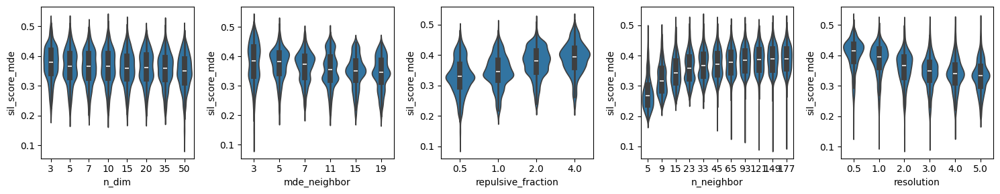

In [68]:
params = ['n_dim', 'mde_neighbor', 'repulsive_fraction', 'n_neighbor', 'resolution']
fig, axes = plt.subplots(1,len(params),figsize=(len(params)*3,3))
ax = axes.flatten()
for i, param in enumerate(params):
    sns.violinplot(clustering_summary, x=param, y='sil_score_mde', ax=ax[i])
plt.tight_layout()

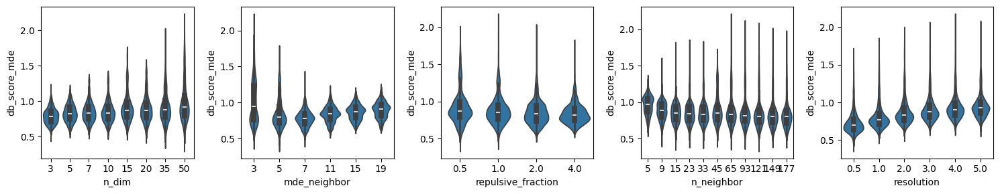

In [69]:
params = ['n_dim', 'mde_neighbor', 'repulsive_fraction', 'n_neighbor', 'resolution']
fig, axes = plt.subplots(1,len(params),figsize=(len(params)*3,3))
ax = axes.flatten()
for i, param in enumerate(params):
    sns.violinplot(clustering_summary, x=param, y='db_score_mde', ax=ax[i])
plt.tight_layout()

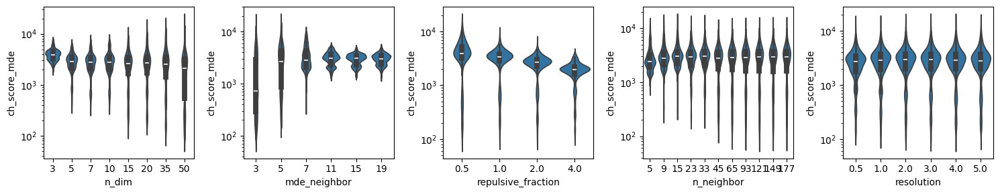

In [70]:
params = ['n_dim', 'mde_neighbor', 'repulsive_fraction', 'n_neighbor', 'resolution']
fig, axes = plt.subplots(1,len(params),figsize=(len(params)*3,3))
ax = axes.flatten()
for i, param in enumerate(params):
    sns.violinplot(clustering_summary, x=param, y='ch_score_mde', ax=ax[i], log_scale=True)
plt.tight_layout()

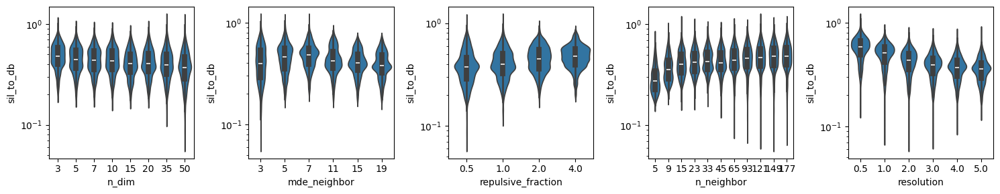

In [73]:
params = ['n_dim', 'mde_neighbor', 'repulsive_fraction', 'n_neighbor', 'resolution']
fig, axes = plt.subplots(1,len(params),figsize=(len(params)*3,3))
ax = axes.flatten()
for i, param in enumerate(params):
    sns.violinplot(clustering_summary, x=param, y='sil_to_db', ax=ax[i], log_scale=True)
plt.tight_layout()

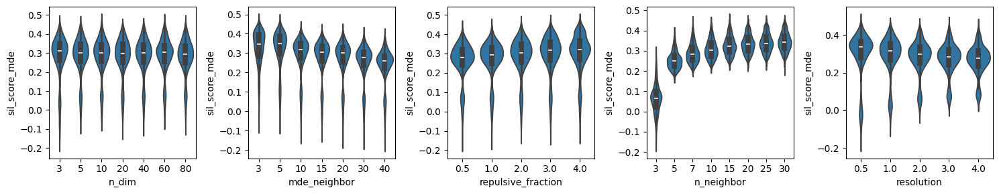

In [102]:
params = ['n_dim', 'mde_neighbor', 'repulsive_fraction', 'n_neighbor', 'resolution']
fig, axes = plt.subplots(1,len(params),figsize=(len(params)*3,3))
ax = axes.flatten()
for i, param in enumerate(params):
    sns.violinplot(clustering_summary, x=param, y='sil_score_mde', ax=ax[i])
plt.tight_layout()

In [198]:
adata

AnnData object with n_obs × n_vars = 4675 × 13959
    obs: 'target_contrast_gene_name', 'culture_condition', 'target_contrast', 'chunk', 'n_cells_target', 'reverse', 'leiden'
    var: 'gene_ids', 'gene_name', 'mean', 'std'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'p_value', 'zscore'

In [223]:
adata.obs['leiden'] = clustering_summary.loc[3323, 'leiden_assignment']
adata.obs['leiden'] = adata.obs['leiden'].astype('category')

In [224]:
adata.obs.leiden

ENSG00000104368_Stim8hr     95
ENSG00000109971_Stim8hr     75
ENSG00000128607_Stim8hr     96
ENSG00000163600_Stim8hr    121
ENSG00000168876_Stim8hr      0
                          ... 
ENSG00000137265_Rest         2
ENSG00000144580_Rest       113
ENSG00000157426_Rest       115
ENSG00000162377_Rest        19
ENSG00000162604_Rest       153
Name: leiden, Length: 4675, dtype: category
Categories (221, int64): [0, 1, 2, 3, ..., 217, 218, 219, 220]

In [228]:
adata[adata.obs.target_contrast_gene_name.str.startswith('DPH')].obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,reverse,leiden
ENSG00000117543_Rest,DPH5,Rest,ENSG00000117543,6,400.0,False,123
ENSG00000134146_Rest,DPH6,Rest,ENSG00000134146,127,393.0,False,184
ENSG00000134146_Stim8hr,DPH6,Stim8hr,ENSG00000134146,130,327.0,False,184
ENSG00000132768_Stim48hr,DPH2,Stim48hr,ENSG00000132768,220,215.0,False,123
ENSG00000134146_Stim48hr,DPH6,Stim48hr,ENSG00000134146,282,209.0,False,123
ENSG00000148399_Stim8hr,DPH7,Stim8hr,ENSG00000148399,383,626.0,False,59
ENSG00000108963_Stim48hr,DPH1,Stim48hr,ENSG00000108963,457,108.0,False,123
ENSG00000108963_Rest,DPH1,Rest,ENSG00000108963,480,148.0,False,123
ENSG00000108963_Stim8hr,DPH1,Stim8hr,ENSG00000108963,550,233.0,False,184
ENSG00000117543_Stim48hr,DPH5,Stim48hr,ENSG00000117543,606,180.0,False,123


In [230]:
adata[adata.obs.leiden==184].obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,reverse,leiden
ENSG00000134146_Rest,DPH6,Rest,ENSG00000134146,127,393.0,False,184
ENSG00000134146_Stim8hr,DPH6,Stim8hr,ENSG00000134146,130,327.0,False,184
ENSG00000170946_Stim8hr,DNAJC24,Stim8hr,ENSG00000170946,263,429.0,False,184
ENSG00000133112_Stim8hr,TPT1,Stim8hr,ENSG00000133112,286,191.0,False,184
ENSG00000243725_Stim8hr,TTC4,Stim8hr,ENSG00000243725,331,102.0,False,184
ENSG00000108963_Stim8hr,DPH1,Stim8hr,ENSG00000108963,550,233.0,False,184
ENSG00000117543_Stim8hr,DPH5,Stim8hr,ENSG00000117543,636,289.0,False,184


In [176]:
adata[adata.obs.leiden==105].obs.target_contrast_gene_name.unique()

['DPH5', 'TTC4', 'DPH6', 'DPH2', 'DNAJC24', 'TPT1', 'DPH1', 'HDAC1', 'CAND1']
Categories (9, object): ['CAND1', 'DNAJC24', 'DPH1', 'DPH2', ..., 'DPH6', 'HDAC1', 'TPT1', 'TTC4']

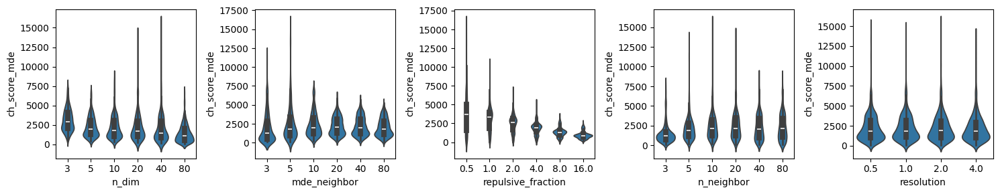

In [1508]:
params = ['n_dim', 'mde_neighbor', 'repulsive_fraction', 'n_neighbor', 'resolution']
fig, axes = plt.subplots(1,len(params),figsize=(len(params)*3,3))
ax = axes.flatten()
for i, param in enumerate(params):
    sns.violinplot(clustering_summary, x=param, y='ch_score_mde', ax=ax[i])
plt.tight_layout()

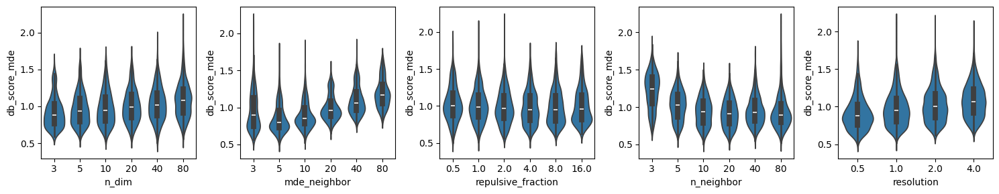

In [1509]:
params = ['n_dim', 'mde_neighbor', 'repulsive_fraction', 'n_neighbor', 'resolution']
fig, axes = plt.subplots(1,len(params),figsize=(len(params)*3,3))
ax = axes.flatten()
for i, param in enumerate(params):
    sns.violinplot(clustering_summary, x=param, y='db_score_mde', ax=ax[i])
plt.tight_layout()

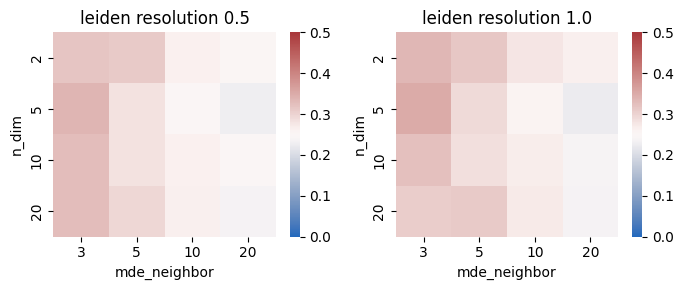

In [1391]:
resolution_all = clustering_summary.resolution.unique()
fig, axes = plt.subplots(1, 2, figsize=(7,3))
ax = axes.flatten()
for i, resolution in enumerate(resolution_all):
    heatmap_data = clustering_summary[clustering_summary.resolution==resolution].pivot_table(index="n_dim", columns="mde_neighbor", values="sil_score_mde")
    sns.heatmap(heatmap_data, ax=ax[i], vmin=0, vmax=0.5, cmap='vlag')
    ax[i].set_title('leiden resolution '+str(resolution))

plt.tight_layout()

In [ ]:
embedding = pymde.preserve_neighbors(
    data=adata.X,
    embedding_dim=20,
    n_neighbors=5,
    repulsive_fraction=1,
).embed(verbose=False)
adata.obsm['X_mde'] = embedding.numpy()
sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_mde')
sc.tl.leiden(adata, resolution=1, random_state=13)
adata.obs['leiden'] = adata.obs['leiden'].astype(int)
adata.obs['leiden'] = adata.obs['leiden'].astype('category')
cluster_labels_numerical = adata.obs['leiden'].cat.codes

In [ ]:
fig, ax = plt.subplots()
cluster_label = 'leiden'
i = 0
data = adata[adata.obs[cluster_label]==0].X.toarray()
list1 = adata[adata.obs[cluster_label]==0].obs.target_contrast_gene_name.values.tolist()
list2 = adata[adata.obs[cluster_label]==0].obs.culture_condition.values.tolist()
list3 = adata[adata.obs[cluster_label]==0].obs.reverse.values.tolist()
ind = [f"{item1}_{item2}_{item3}" for item1, item2, item3 in zip(list1, list2, list3)]
for i in range(np.max(adata.obs.leiden.astype(int).unique())):
    data = np.concatenate([data, adata[adata.obs[cluster_label]==i+1].X.toarray()])
    list1 = adata[adata.obs[cluster_label]==i+1].obs.target_contrast_gene_name.values.tolist()
    list2 = adata[adata.obs[cluster_label]==i+1].obs.culture_condition.values.tolist()
    list3 = adata[adata.obs[cluster_label]==i+1].obs.reverse.values.tolist()
    ind = ind +[f"{item1}_{item2}_{item3}" for item1, item2, item3 in zip(list1, list2, list3)]
    
test = pd.DataFrame(data=data,
                    index=ind,
                    columns=adata.var_names)
test2 = test.T.corr()
np.fill_diagonal(test2.values, 0)
sns.heatmap(test2, vmin=-0.5, vmax=0.5, cmap='vlag', ax=ax)
plt.tight_layout()

In [1069]:
# 1. Get the gene loadings from the top PCs
n_comp = 100
sc.pp.pca(adata, n_comps=n_comp)
pc_loadings = adata.varm['PCs'][:, :n_comp]
# 2. Find the top N genes with the highest absolute loadings for each PC
n_genes_per_pc = 10
relevant_genes = set()
for i in range(n_comp):
    pc_i_loadings = np.abs(pc_loadings[:, i])
    top_gene_indices = np.argsort(pc_i_loadings)[::-1][:n_genes_per_pc]
    relevant_genes.update(adata.var_names[top_gene_indices])

# 3. Create a boolean mask to filter your AnnData object
genes_to_keep = list(relevant_genes)
#adata = adata[:, genes_to_keep].copy()

In [1372]:
n_comp = 500
sc.pp.pca(adata, n_comps=n_comp)

In [1455]:
embedding = pymde.preserve_neighbors(
    data=adata.X,
    embedding_dim=20,
    n_neighbors=3,
    repulsive_fraction=10,
).embed(verbose=False)
adata.obsm['X_mde'] = embedding.numpy()

In [1456]:
#sc.pp.neighbors(adata, n_neighbors=20, n_pcs=n_comp)
#sc.pp.neighbors(adata, n_neighbors=10, use_rep='X')
sc.pp.neighbors(adata, n_neighbors=21, use_rep='X_mde')#, metric='cosine')
sc.tl.leiden(adata, resolution=1, random_state=13)
adata.obs['leiden'] = adata.obs['leiden'].astype(int)
adata.obs['leiden'] = adata.obs['leiden'].astype('category')
cluster_labels_numerical = adata.obs['leiden'].cat.codes

In [1457]:
sil_score_raw = silhouette_score(adata.X, cluster_labels_numerical)
sil_score_xde = silhouette_score(adata.obsm['X_mde'], cluster_labels_numerical)
ch_score_raw = calinski_harabasz_score(adata.X, cluster_labels_numerical)
ch_score_xde = calinski_harabasz_score(adata.obsm['X_mde'], cluster_labels_numerical)
db_score_raw = davies_bouldin_score(adata.X, cluster_labels_numerical)
db_score_xde = davies_bouldin_score(adata.obsm['X_mde'], cluster_labels_numerical)

In [1458]:
sil_score_raw, ch_score_raw, db_score_raw, sil_score_xde, ch_score_xde, db_score_xde

(-0.00533755616784669,
 7.439288333833836,
 4.597558744512241,
 0.5184356570243835,
 599.4064886485476,
 0.6269686556490828)

In [1375]:
sil_score_raw = silhouette_score(adata.X, cluster_labels_numerical)
sil_score_allpcs = silhouette_score(adata.obsm['X_pca'], cluster_labels_numerical)
sil_score_pcs = silhouette_score(adata.obsm['X_pca'][:,:n_comp], cluster_labels_numerical)
sil_score_xde = silhouette_score(adata.obsm['X_mde'], cluster_labels_numerical)
ch_score_raw = calinski_harabasz_score(adata.X, cluster_labels_numerical)
ch_score_allpcs = calinski_harabasz_score(adata.obsm['X_pca'], cluster_labels_numerical)
ch_score_pcs = calinski_harabasz_score(adata.obsm['X_pca'][:,:n_comp], cluster_labels_numerical)
ch_score_xde = calinski_harabasz_score(adata.obsm['X_mde'], cluster_labels_numerical)
db_score_raw = davies_bouldin_score(adata.X, cluster_labels_numerical)
db_score_allpcs = davies_bouldin_score(adata.obsm['X_pca'], cluster_labels_numerical)
db_score_pcs = davies_bouldin_score(adata.obsm['X_pca'][:,:n_comp], cluster_labels_numerical)
db_score_xde = davies_bouldin_score(adata.obsm['X_mde'], cluster_labels_numerical)

In [1376]:
sil_score_raw, ch_score_raw, db_score_raw, sil_score_xde, ch_score_xde, db_score_xde

(-0.002175214553196032,
 9.515702002200706,
 4.866340548768652,
 0.36925777792930603,
 793.9768394856917,
 0.7993582118453442)

In [1368]:
sil_score_raw, ch_score_raw, db_score_raw, sil_score_xde, ch_score_xde, db_score_xde

(0.007459416919545428,
 10.218371412843217,
 4.500383067823686,
 0.33830174803733826,
 602.82644488805,
 0.861332912825988)

In [1335]:
sil_score_raw, ch_score_raw, db_score_raw, sil_score_xde, ch_score_xde, db_score_xde

(0.008433861680799924,
 24.128996335121798,
 5.24229105831779,
 0.29169708490371704,
 900.7075103613528,
 1.0869489749102905)

In [1459]:
np.max(adata.obs.leiden.astype(int).unique())

43

In [1466]:
adata[adata.obs.leiden==43].obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000132768_Stim48hr,DPH2,Stim48hr,ENSG00000132768,220,215.0,43
ENSG00000170946_Stim48hr,DNAJC24,Stim48hr,ENSG00000170946,220,284.0,43
ENSG00000134146_Stim48hr,DPH6,Stim48hr,ENSG00000134146,282,209.0,43
ENSG00000108963_Stim48hr,DPH1,Stim48hr,ENSG00000108963,457,108.0,43
ENSG00000117543_Stim48hr,DPH5,Stim48hr,ENSG00000117543,606,180.0,43
ENSG00000133112_Stim48hr,TPT1,Stim48hr,ENSG00000133112,661,158.0,43


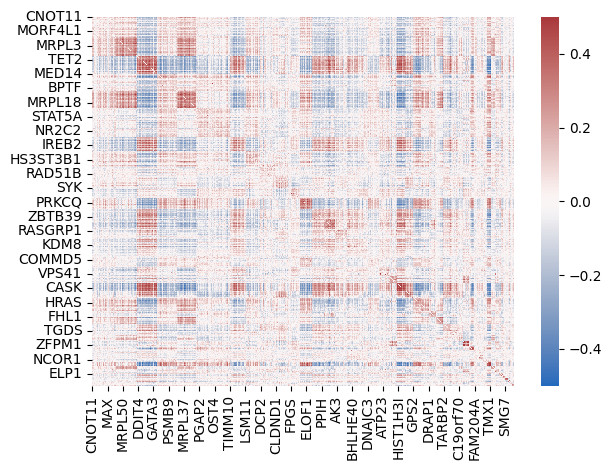

In [1467]:
fig, ax = plt.subplots()
cluster_label = 'leiden'
i = 0
data = adata[adata.obs[cluster_label]==0].X.toarray()
ind = adata[adata.obs[cluster_label]==0].obs.target_contrast_gene_name.values.tolist()
for i in range(np.max(adata.obs.leiden.astype(int).unique())):
    data = np.concatenate([data, adata[adata.obs[cluster_label]==i+1].X.toarray()])
    ind = ind + adata[adata.obs[cluster_label]==i+1].obs.target_contrast_gene_name.values.tolist()
    
test = pd.DataFrame(data=data,
                    index=ind,
                    columns=adata.var.gene_name)
test2 = test.T.corr()
np.fill_diagonal(test2.values, 0)
sns.heatmap(test2, vmin=-0.5, vmax=0.5, cmap='vlag', ax=ax)
plt.tight_layout()

In [1465]:
adata[adata.obs.target_contrast_gene_name.str.startswith('DPH')].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000108963_Stim48hr,DPH1,Stim48hr,ENSG00000108963,457,108.0,43
ENSG00000132768_Stim48hr,DPH2,Stim48hr,ENSG00000132768,220,215.0,43
ENSG00000117543_Stim48hr,DPH5,Stim48hr,ENSG00000117543,606,180.0,43
ENSG00000134146_Stim48hr,DPH6,Stim48hr,ENSG00000134146,282,209.0,43


In [1279]:
n_comp = 500
sc.pp.pca(adata, n_comps=n_comp)

In [1280]:
# Test a number of parameters
n_comp_all = [3, 5, 10, 30, 50, 75, 100]
n_comp_all = [5, 10, 30, 50, 75, 100, 200, 400]
n_neighbor_all = [3, 5, 10, 20, 50]
n_neighbor_all = [5, 10, 30, 50, 100, 200, 400]
resolution_all = [0.5, 1, 2, 3]#, 7, 10]
resolution_all = [1,]
clustering_all = []
for n_comp in n_comp_all:
    for n_neighbor in n_neighbor_all:
        print(f'{n_comp} {n_neighbor}')
        for resolution in resolution_all:
            sc.pp.neighbors(adata, n_neighbors=n_neighbor, n_pcs=n_comp)
            sc.tl.leiden(adata, resolution=resolution, random_state=13)
            adata.obs['leiden'] = adata.obs['leiden'].astype(int)
            adata.obs['leiden'] = adata.obs['leiden'].astype('category')
            cluster_labels_numerical = adata.obs['leiden'].cat.codes
            #silhouette_avg = silhouette_score(adata.obsm['X_pca'][:,:n_comp], cluster_labels_numerical)
            #silhouette_avg_custom = silhouette_centroid_score(adata.obsm['X_pca'][:,:n_comp], cluster_labels_numerical)
            sil_score_raw = silhouette_score(adata.X, cluster_labels_numerical)
            sil_score_allpcs = silhouette_score(adata.obsm['X_pca'], cluster_labels_numerical)
            sil_score_pcs = silhouette_score(adata.obsm['X_pca'][:,:n_comp], cluster_labels_numerical)
            ch_score_raw = calinski_harabasz_score(adata.X, cluster_labels_numerical)
            ch_score_allpcs = calinski_harabasz_score(adata.obsm['X_pca'], cluster_labels_numerical)
            ch_score_pcs = calinski_harabasz_score(adata.obsm['X_pca'][:,:n_comp], cluster_labels_numerical)
            db_score_raw = davies_bouldin_score(adata.X, cluster_labels_numerical)
            db_score_allpcs = davies_bouldin_score(adata.obsm['X_pca'], cluster_labels_numerical)
            db_score_pcs = davies_bouldin_score(adata.obsm['X_pca'][:,:n_comp], cluster_labels_numerical)

            clustering_all.append({'n_comp':n_comp,
                                   'n_neighbor':n_neighbor,
                                   'resolution':resolution,
                                   'sil_score_raw': sil_score_raw,
                                   'sil_score_pca': sil_score_allpcs,
                                   'sil_score_selected_pcs': sil_score_pcs,
                                   'ch_score_raw': ch_score_raw,
                                   'ch_score_pca': ch_score_allpcs,
                                   'ch_score_selected_pcs': ch_score_pcs,
                                   'db_score_raw': db_score_raw,
                                   'db_score_pca': db_score_allpcs,
                                   'db_score_selected_pcs': db_score_pcs,
                                   'leiden_assignment': adata.obs['leiden'].values.tolist()})

# Compile key statistics
clustering_summary = pd.DataFrame(clustering_all)

5 5
5 10
5 30
5 50
5 100
5 200
5 400
10 5
10 10
10 30
10 50
10 100
10 200
10 400
30 5
30 10
30 30
30 50
30 100
30 200
30 400
50 5
50 10
50 30
50 50
50 100
50 200
50 400
75 5
75 10
75 30
75 50
75 100
75 200
75 400
100 5
100 10
100 30
100 50
100 100
100 200
100 400
200 5
200 10
200 30
200 50
200 100
200 200
200 400
400 5
400 10
400 30
400 50
400 100
400 200
400 400


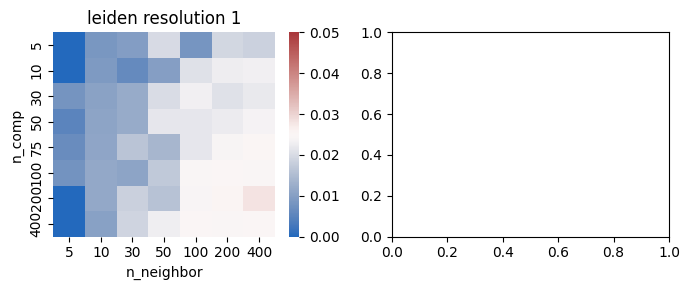

In [1285]:
resolution_all = clustering_summary.resolution.unique()
fig, axes = plt.subplots(1, 2, figsize=(7,3))
ax = axes.flatten()
for i, resolution in enumerate(resolution_all):
    heatmap_data = clustering_summary[clustering_summary.resolution==resolution].pivot_table(index="n_comp", columns="n_neighbor", values="sil_score_raw")
    sns.heatmap(heatmap_data, ax=ax[i], vmin=0, vmax=0.05, cmap='vlag')
    ax[i].set_title('leiden resolution '+str(resolution))

plt.tight_layout()

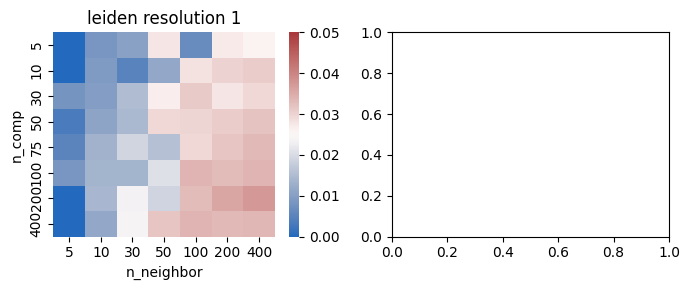

In [1287]:
resolution_all = clustering_summary.resolution.unique()
fig, axes = plt.subplots(1, 2, figsize=(7,3))
ax = axes.flatten()
for i, resolution in enumerate(resolution_all):
    heatmap_data = clustering_summary[clustering_summary.resolution==resolution].pivot_table(index="n_comp", columns="n_neighbor", values="sil_score_pca")
    sns.heatmap(heatmap_data, ax=ax[i], vmin=0, vmax=0.05, cmap='vlag')
    ax[i].set_title('leiden resolution '+str(resolution))

plt.tight_layout()

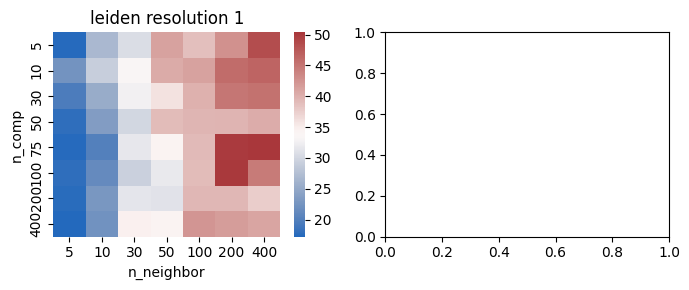

In [1296]:
resolution_all = clustering_summary.resolution.unique()
fig, axes = plt.subplots(1, 2, figsize=(7,3))
ax = axes.flatten()
for i, resolution in enumerate(resolution_all):
    heatmap_data = clustering_summary[clustering_summary.resolution==resolution].pivot_table(index="n_comp", columns="n_neighbor", values="ch_score_pca")
    sns.heatmap(heatmap_data, ax=ax[i], cmap='vlag')
    ax[i].set_title('leiden resolution '+str(resolution))

plt.tight_layout()

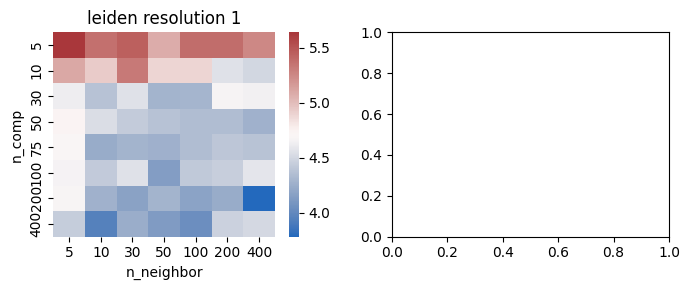

In [1298]:
resolution_all = clustering_summary.resolution.unique()
fig, axes = plt.subplots(1, 2, figsize=(7,3))
ax = axes.flatten()
for i, resolution in enumerate(resolution_all):
    heatmap_data = clustering_summary[clustering_summary.resolution==resolution].pivot_table(index="n_comp", columns="n_neighbor", values="db_score_raw")
    sns.heatmap(heatmap_data, ax=ax[i], cmap='vlag')
    ax[i].set_title('leiden resolution '+str(resolution))

plt.tight_layout()

In [284]:
embedding = pymde.preserve_neighbors(
    data=adata.X,
    embedding_dim=3,
    n_neighbors=30,
    repulsive_fraction=3,
).embed(verbose=False)
adata.obsm['X_mde'] = embedding.numpy()
sc.pp.neighbors(adata, n_neighbors=30, use_rep='X_mde')#, metric='cosine')
sc.tl.leiden(adata, resolution=1.5, random_state=13)
adata.obs['leiden'] = adata.obs['leiden'].astype(int)
adata.obs['leiden'] = adata.obs['leiden'].astype('category')
cluster_labels_numerical = adata.obs['leiden'].cat.codes
silhouette_avg = silhouette_score(adata.obsm['X_pca'], cluster_labels_numerical)

In [304]:
silhouette_avg, silhouette_avg_custom

(0.05234210193157196, 0.14738137)

In [307]:
clustering_summary

,n_comp,n_neighbor,resolution,silhouette_score,silhouette_score_custom,leiden_assignment
0,5,3,0.5,-0.002620,0.115787,"[7, 4, 1, 1, 0, 0, 3, 3, 4, 11, 3, 3, 3, 10, 5..."
1,5,3,1.0,-0.012733,0.125233,"[4, 10, 11, 11, 2, 2, 7, 7, 10, 14, 7, 7, 17, ..."
2,5,3,2.5,-0.017242,0.143755,"[13, 5, 6, 6, 0, 10, 22, 3, 5, 12, 22, 3, 21, ..."
3,5,3,5.0,-0.017977,0.176474,"[2, 0, 6, 6, 8, 1, 29, 14, 0, 4, 29, 28, 26, 2..."
4,5,3,7.0,-0.015367,0.187947,"[2, 30, 4, 4, 6, 25, 31, 11, 13, 3, 31, 27, 22..."
...,...,...,...,...,...,...
331,100,70,1.0,0.058625,0.127756,"[0, 3, 3, 3, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 3, ..."
332,100,70,2.5,0.013878,0.140406,"[9, 8, 5, 5, 15, 6, 0, 1, 6, 11, 0, 1, 0, 12, ..."
333,100,70,5.0,-0.003842,0.230042,"[11, 3, 7, 2, 37, 15, 14, 6, 19, 17, 13, 18, 1..."
334,100,70,7.0,-0.008703,0.316153,"[10, 6, 4, 28, 38, 59, 37, 20, 34, 8, 21, 12, ..."


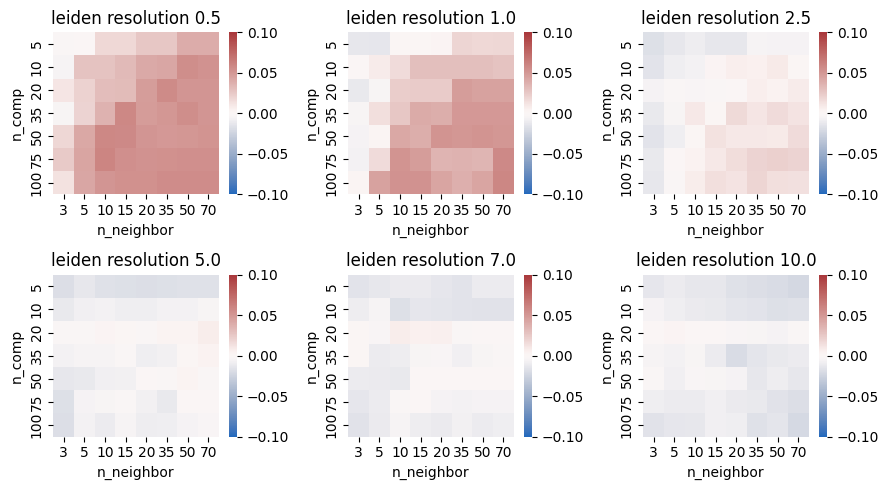

In [310]:
resolution_all = clustering_summary.resolution.unique()
fig, axes = plt.subplots(2, 3, figsize=(9,5))
ax = axes.flatten()
for i, resolution in enumerate(resolution_all):
    heatmap_data = clustering_summary[clustering_summary.resolution==resolution].pivot_table(index="n_comp", columns="n_neighbor", values="silhouette_score")
    sns.heatmap(heatmap_data, ax=ax[i], vmin=-0.1, vmax=0.1, cmap='vlag')
    ax[i].set_title('leiden resolution '+str(resolution))

plt.tight_layout()

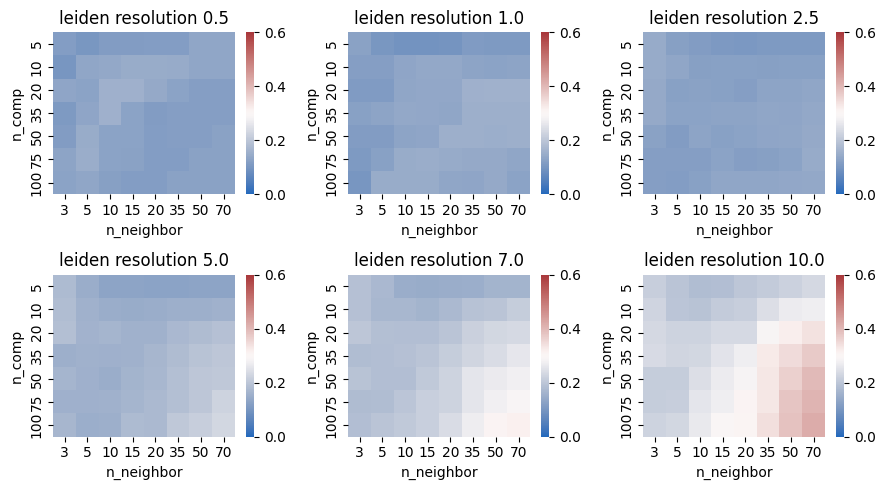

In [315]:
resolution_all = clustering_summary.resolution.unique()
fig, axes = plt.subplots(2, 3, figsize=(9,5))
ax = axes.flatten()
for i, resolution in enumerate(resolution_all):
    heatmap_data = clustering_summary[clustering_summary.resolution==resolution].pivot_table(index="n_comp", columns="n_neighbor", values="silhouette_score_custom")
    sns.heatmap(heatmap_data, ax=ax[i], vmin=0, vmax=0.6, cmap='vlag')
    ax[i].set_title('leiden resolution '+str(resolution))

plt.tight_layout()

In [11]:
# Test a number of parameters
n_comp_all = [5, 10, 20, 35, 50, 75, 100, 150, 200]
n_neighbor_all = [3, 5, 7, 9, 12, 15, 20, 25, 35, 50]
resolution_all = [0.5, 1, 2.5, 5, 7, 10, 15, 20, 30]
clustering_all = []
for n_comp in n_comp_all:
    for n_neighbor in n_neighbor_all:
        print(f'{n_comp} {n_neighbor}')
        for resolution in resolution_all:
            sc.pp.neighbors(adata, n_neighbors=n_neighbor, n_pcs=n_comp)
            sc.tl.leiden(adata, resolution=resolution, random_state=13)
            adata.obs['leiden'] = adata.obs['leiden'].astype(int)
            adata.obs['leiden'] = adata.obs['leiden'].astype('category')
            num_of_leiden = len(adata.obs['leiden'].unique())
            corr = np.zeros(num_of_leiden)
            for i in range(len(corr)):
                list1 = adata[adata.obs['leiden']==i].obs.target_contrast_gene_name.values.tolist()
                list2 = adata[adata.obs['leiden']==i].obs.culture_condition.values.tolist()
                test = pd.DataFrame(data=adata[adata.obs['leiden']==i].X.toarray(),
                                    index=[f"{item1}_{item2}" for item1, item2 in zip(list1, list2)],
                                    columns=adata.var.gene_name)
                test2 = test.T.corr()
                np.fill_diagonal(test2.values, 0)
                corr[i] = np.mean(test2)

            clustering_all.append({'n_comp':n_comp,
                                   'n_neighbor':n_neighbor,
                                   'resolution':resolution,
                                   'corr': corr,
                                   'leiden_assignment': adata.obs['leiden'].values.tolist()})

# Compile key statistics
clustering_summary = pd.DataFrame(clustering_all)

50 3


/var/folders/qq/j023xkr13nxfrw65dx2bqwd00000gp/T/ipykernel_87745/3161963721.py:11: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=resolution, random_state=13)


50 5
50 7
50 9
50 12
50 15
50 20
50 25
100 3
100 5
100 7
100 9
100 12
100 15
100 20
100 25
150 3
150 5
150 7
150 9
150 12
150 15
150 20
150 25
250 3
250 5
250 7
250 9
250 12
250 15
250 20
250 25
350 3
350 5
350 7
350 9
350 12
350 15
350 20
350 25
500 3
500 5
500 7
500 9
500 12
500 15
500 20
500 25
750 3
750 5
750 7
750 9
750 12
750 15
750 20
750 25
1000 3
1000 5
1000 7
1000 9
1000 12
1000 15
1000 20
1000 25
3000 3
3000 5
3000 7
3000 9
3000 12
3000 15
3000 20
3000 25
4500 3
4500 5
4500 7
4500 9
4500 12
4500 15
4500 20
4500 25


In [12]:
clustering_summary.to_csv('../../../RZAnalysisCodes/results/pcs_neighbors_resolution_clustering_screening_de30ntotal75.csv')

### Access the leiden clustering by STRINGDB and CORUM dataset

In [13]:
corum_df = pd.read_csv('../../../RZAnalysisCodes/results/CORUM/corum_humanComplexes.txt', delimiter='\t', index_col='complex_id')
stringdb = pd.read_csv('../../../RZAnalysisCodes/results/STRINGDB/9606.clusters.proteins.v12.0.txt.gz', delimiter='\t', compression='gzip')
protein_info = pd.read_csv('../../../RZAnalysisCodes/results/STRINGDB/9606.protein.info.v12.0.txt.gz', delimiter='\t', compression='gzip')
cluster_info = pd.read_csv('../../../RZAnalysisCodes/results/STRINGDB/9606.clusters.info.v12.0.txt.gz', delimiter='\t', compression='gzip')
stringdb_df = pd.merge(stringdb, protein_info, left_on='protein_id', right_on='#string_protein_id')
stringdb_df = pd.merge(stringdb_df, cluster_info, left_on='cluster_id', right_on='cluster_id')
stringdb_df = stringdb_df[stringdb_df.cluster_size<1000].copy()

corum_complexes = {}
summary = []
corum_summary = pd.DataFrame(columns=['complex_name', 'cluster_size'])
for _, row in corum_df.iterrows():
    complex_name = row['complex_name']
    subunits = set(row['subunits_gene_name'].split(';'))
    corum_complexes[complex_name] = subunits
    summary.append({'complex_name': complex_name,
                    'cluster_size': len(subunits)})

corum_summary = pd.DataFrame(summary)

stringdb_complexes = {}
for i, cluster_id in enumerate(stringdb_df.cluster_id.unique()):
    stringdb_complexes[cluster_id] = set(stringdb_df[stringdb_df.cluster_id==cluster_id].preferred_name)

In [14]:
def access_complex_enrichment(adata, complexes):
    """
    Access STRINGDB and CORUM enrichment
    """
    de_genes_per_cluster = {}
    leiden_clusters = adata.obs['leiden'].unique()
    for cluster in leiden_clusters:
        cluster_genes = adata[adata.obs['leiden'] == cluster].obs.target_contrast_gene_name
        de_genes_per_cluster[cluster] = set(cluster_genes)
    
    N = len(adata)
    
    results = []
    for cluster, de_genes in de_genes_per_cluster.items():
        n = len(de_genes)
        for complex_name, subunits in complexes.items():
            K = len(subunits)
            # Find the overlap between DE genes and complex subunits
            overlap = de_genes.intersection(subunits)
            k = len(overlap)
            
            # Calculate the p-value
            if n > 0 and K > 0: # Avoid division by zero or trivial cases
                pval = hypergeom.sf(k - 1, N, K, n) # sf is survival function
                
                # Adjust for multiple testing (e.g., using Benjamini-Hochberg)
                # This is a crucial step to avoid false positives
                # Store raw p-values and correct later
                results.append({
                    'cluster': cluster,
                    'complex': complex_name,
                    'cluster_size': n,
                    'overlap_genes': list(overlap),
                    'overlap_fraction': len(overlap)/n,
                    'raw_p_value': pval,
                    'complex_size': K
                })
    
    # Convert results to a DataFrame for easy viewing
    results_df = pd.DataFrame(results)

    return results_df

In [15]:
def clustering_quality(row, enrichment, raw_p_value_thres, overlap_fraction_thres, cluster_size_thres, corr_thres):
    """Calculate clustering quality based on enrichment analysis and intracluster correlation"""
    mask = (enrichment.raw_p_value<raw_p_value_thres) & (enrichment.overlap_fraction>overlap_fraction_thres) & (enrichment.cluster_size>cluster_size_thres)
    # Clusters that pass the enrichment filtering, union with clusters that pass the intracluster correlation filtering
    cluster_pass_filter1 = set(enrichment[mask].cluster.unique()) & set(np.where(row['corr']>corr_thres)[0])
    
    # Second invariant mask
    mask2 = (enrichment.raw_p_value<1e-3) & (enrichment.overlap_fraction>0.5) & (enrichment.cluster_size>3)
    # Clusters that pass the enrichment filtering, union with clusters that pass the intracluster correlation filtering
    cluster_pass_filter2 = set(enrichment[mask2].cluster.unique()) & set(np.where(row['corr']>0.2)[0])

    cluster_pass_filter = list(cluster_pass_filter1|cluster_pass_filter2)
    
    # Return fractions of total perturbations that are in passed clusters, and fractions of passed clusters
    return len(adata[adata.obs.leiden.isin(cluster_pass_filter)])/len(adata), len(cluster_pass_filter)/len(row['corr'])

In [154]:
enrich_stat = []
for i, row in clustering_summary.iterrows():
    if i > 213:
        adata.obs['leiden'] = row.leiden_assignment
        adata.obs['leiden'] = adata.obs['leiden'].astype('category')
        stringdb_enrichment = access_complex_enrichment(adata, stringdb_complexes)
        corum_enrichment = access_complex_enrichment(adata, corum_complexes)
        stringdb_metric1 = clustering_quality(row, stringdb_enrichment, 1e-5, 0.1, 6, 0.1)
        stringdb_metric2 = clustering_quality(row, stringdb_enrichment, 1e-6, 0.2, 8, 0.2)
        corum_metric1 = clustering_quality(row, corum_enrichment, 1e-5, 0.1, 6, 0.1)
        corum_metric2 = clustering_quality(row, corum_enrichment, 1e-6, 0.2, 8, 0.2)
        enrich_stat.append({
            'n_comp':row['n_comp'],
            'n_neighbor':row['n_neighbor'],
            'resolution':row['resolution'],
            'num_of_clusters':len(row['corr']),
            'stringdb_metric1_gene_fraction':stringdb_metric1[0],
            'stringdb_metric1_cluster_fraction':stringdb_metric1[1],
            'stringdb_metric2_gene_fraction':stringdb_metric2[0],
            'stringdb_metric2_cluster_fraction':stringdb_metric2[1],
            'corum_metric1_gene_fraction':corum_metric1[0],
            'corum_metric1_cluster_fraction':corum_metric1[1],
            'corum_metric2_gene_fraction':corum_metric2[0],
            'corum_metric2_cluster_fraction':corum_metric2[1],
                })
    if i % 20 == 0:
        print(i)

enrich_stat_df2 = pd.DataFrame(enrich_stat)

0
20
40
60
80
100
120
140
160
180
200
220
240
260
280
300
320
340
360
380
400
420


KeyboardInterrupt: 

In [155]:
enrich_stat_df2 = pd.DataFrame(enrich_stat)
enrich_stat_df = pd.concat([enrich_stat_df, enrich_stat_df2])

In [156]:
enrich_stat_df = enrich_stat_df.reset_index(drop=True)

In [157]:
enrich_stat_df

,n_comp,n_neighbor,resolution,num_of_clusters,stringdb_metric1_gene_fraction,stringdb_metric1_cluster_fraction,stringdb_metric2_gene_fraction,stringdb_metric2_cluster_fraction,corum_metric1_gene_fraction,corum_metric1_cluster_fraction,corum_metric2_gene_fraction,corum_metric2_cluster_fraction
0,50,3,1.0,50,0.152727,0.280000,0.085348,0.220000,0.146310,0.240000,0.063957,0.120000
1,50,3,2.5,88,0.123209,0.181818,0.090481,0.147727,0.114439,0.147727,0.064813,0.090909
2,50,3,5.0,138,0.193797,0.231884,0.089840,0.130435,0.162781,0.181159,0.061604,0.072464
3,50,3,7.0,166,0.188449,0.216867,0.087059,0.114458,0.161283,0.168675,0.066738,0.072289
4,50,3,10.0,207,0.205561,0.231884,0.095187,0.120773,0.150588,0.164251,0.060321,0.072464
...,...,...,...,...,...,...,...,...,...,...,...,...
417,750,12,2.5,51,0.160856,0.274510,0.072941,0.117647,0.140963,0.176471,0.069091,0.078431
418,750,12,5.0,89,0.255187,0.258427,0.087059,0.089888,0.172620,0.179775,0.060107,0.056180
419,750,12,7.0,117,0.256043,0.247863,0.107166,0.119658,0.188235,0.179487,0.077219,0.076923
420,750,12,10.0,159,0.262674,0.232704,0.106096,0.088050,0.219465,0.188679,0.072086,0.056604


In [136]:
enrich_stat_df2 = pd.DataFrame(enrich_stat)

In [19]:
enrich_stat_df = pd.DataFrame(enrich_stat)

In [158]:
enrich_stat_df.to_csv('../../../RZAnalysisCodes/results/pcs_neighbors_resolution_clustering_screening_de30ntotal75_enrichment_partial.csv')

In [147]:
enrich_stat_df = pd.read_csv('../../../RZAnalysisCodes/results/pcs_neighbors_resolution_clustering_screening_de30ntotal75_enrichment_partial.csv', index_col=0)

In [132]:
enrich_stat_df

,n_comp,n_neighbor,resolution,num_of_clusters,stringdb_metric1_gene_fraction,stringdb_metric1_cluster_fraction,stringdb_metric2_gene_fraction,stringdb_metric2_cluster_fraction,corum_metric1_gene_fraction,corum_metric1_cluster_fraction,corum_metric2_gene_fraction,corum_metric2_cluster_fraction
0,50,3,1.0,50,0.152727,0.280000,0.085348,0.220000,0.146310,0.240000,0.063957,0.120000
1,50,3,2.5,88,0.123209,0.181818,0.090481,0.147727,0.114439,0.147727,0.064813,0.090909
2,50,3,5.0,138,0.193797,0.231884,0.089840,0.130435,0.162781,0.181159,0.061604,0.072464
3,50,3,7.0,166,0.188449,0.216867,0.087059,0.114458,0.161283,0.168675,0.066738,0.072289
4,50,3,10.0,207,0.205561,0.231884,0.095187,0.120773,0.150588,0.164251,0.060321,0.072464
...,...,...,...,...,...,...,...,...,...,...,...,...
196,250,3,10.0,225,0.213904,0.213333,0.110160,0.120000,0.191658,0.177778,0.059251,0.066667
197,250,3,15.0,283,0.214118,0.201413,0.120428,0.120141,0.185882,0.159011,0.074011,0.070671
198,250,3,20.0,327,0.191872,0.180428,0.111658,0.119266,0.158717,0.137615,0.068663,0.070336
199,250,3,30.0,404,0.176043,0.160891,0.116150,0.111386,0.143102,0.128713,0.079358,0.074257


In [20]:
enrich_stat_df.sort_values(by='stringdb_metric2_gene_fraction')

,n_comp,n_neighbor,resolution,num_of_clusters,stringdb_metric1_gene_fraction,stringdb_metric1_cluster_fraction,stringdb_metric2_gene_fraction,stringdb_metric2_cluster_fraction,corum_metric1_gene_fraction,corum_metric1_cluster_fraction,corum_metric2_gene_fraction,corum_metric2_cluster_fraction
42,50,15,5.0,72,0.271016,0.277778,0.064171,0.069444,0.167701,0.180556,0.037861,0.041667
17,50,7,2.5,51,0.189305,0.333333,0.064813,0.176471,0.135187,0.235294,0.058824,0.137255
50,50,20,5.0,67,0.214118,0.253731,0.070160,0.074627,0.151444,0.194030,0.046203,0.074627
56,50,25,1.0,16,0.116578,0.437500,0.071016,0.250000,0.112299,0.375000,0.071016,0.250000
58,50,25,5.0,65,0.176257,0.215385,0.074225,0.076923,0.143743,0.184615,0.050053,0.076923
...,...,...,...,...,...,...,...,...,...,...,...,...
189,150,25,15.0,195,0.263743,0.215385,0.134759,0.097436,0.201711,0.158974,0.088556,0.066667
183,150,20,30.0,345,0.226952,0.156522,0.136257,0.092754,0.170695,0.118841,0.088556,0.060870
93,100,9,15.0,196,0.257326,0.244898,0.136257,0.132653,0.211765,0.188776,0.073369,0.066327
173,150,15,15.0,194,0.262246,0.237113,0.138396,0.123711,0.192941,0.170103,0.090053,0.082474


In [24]:
enrich_stat_df = pd.read_csv('../../../RZAnalysisCodes/results/pcs_neighbors_resolution_clustering_screening_de50ntotal100_enrichment.csv', index_col=0)

In [45]:
enrich_stat_df.stringdb_metric2_cluster_fraction.min()

0.0827586206896551

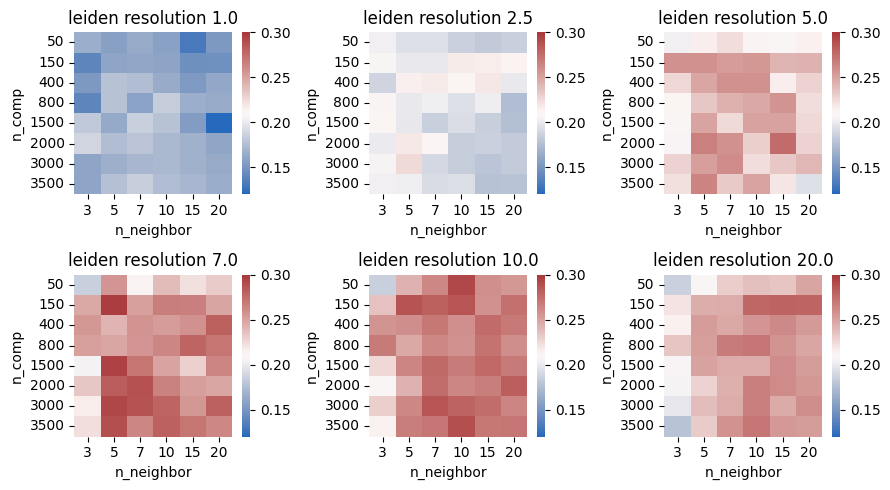

In [50]:
resolution_all = enrich_stat_df.resolution.unique()
fig, axes = plt.subplots(2, 3, figsize=(9,5))
ax = axes.flatten()
for i, resolution in enumerate(resolution_all):
    heatmap_data = enrich_stat_df[enrich_stat_df.resolution==resolution].pivot_table(index="n_comp", columns="n_neighbor", values="stringdb_metric1_gene_fraction")
    sns.heatmap(heatmap_data, ax=ax[i], vmin=0.12, vmax=0.3, cmap='vlag')
    ax[i].set_title('leiden resolution '+str(resolution))

plt.tight_layout()

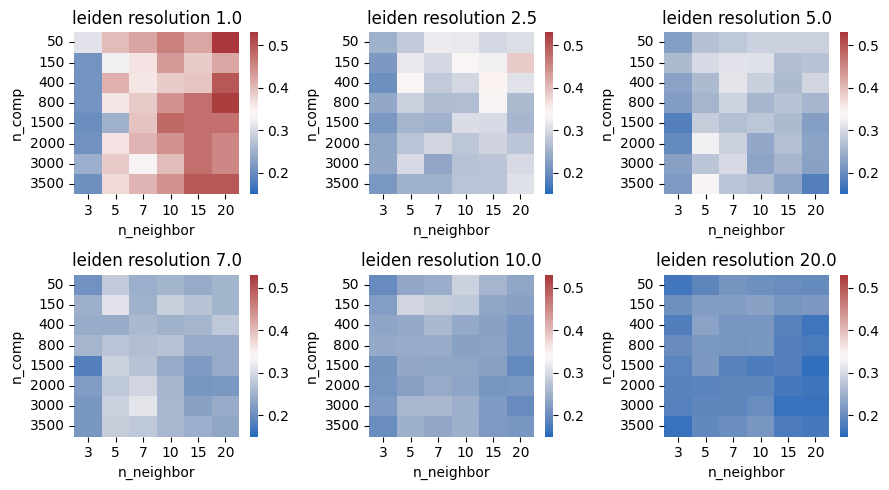

In [51]:
resolution_all = enrich_stat_df.resolution.unique()
fig, axes = plt.subplots(2, 3, figsize=(9,5))
ax = axes.flatten()
for i, resolution in enumerate(resolution_all):
    heatmap_data = enrich_stat_df[enrich_stat_df.resolution==resolution].pivot_table(index="n_comp", columns="n_neighbor", values="stringdb_metric1_cluster_fraction")
    sns.heatmap(heatmap_data, ax=ax[i], vmin=0.15, vmax=0.53, cmap='vlag')
    ax[i].set_title('leiden resolution '+str(resolution))

plt.tight_layout()

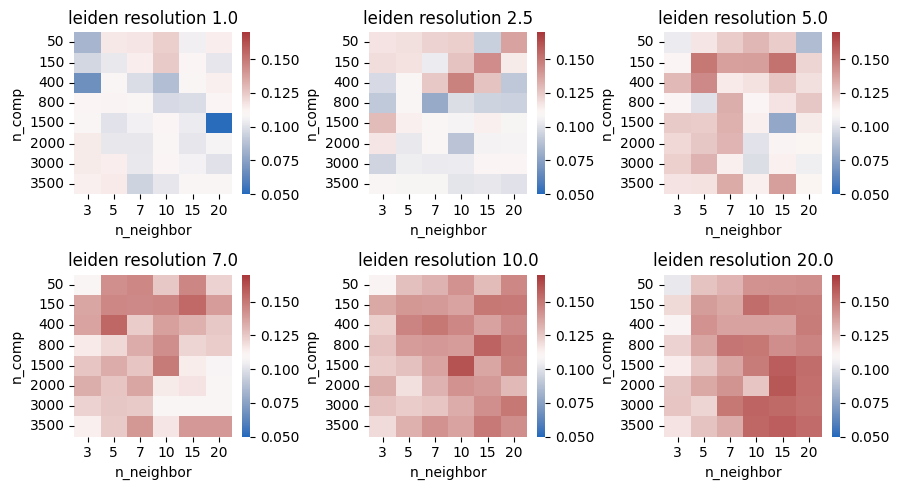

In [52]:
resolution_all = enrich_stat_df.resolution.unique()
fig, axes = plt.subplots(2, 3, figsize=(9,5))
ax = axes.flatten()
for i, resolution in enumerate(resolution_all):
    heatmap_data = enrich_stat_df[enrich_stat_df.resolution==resolution].pivot_table(index="n_comp", columns="n_neighbor", values="stringdb_metric2_gene_fraction")
    sns.heatmap(heatmap_data, ax=ax[i], vmin=0.05, vmax=0.17, cmap='vlag')
    ax[i].set_title('leiden resolution '+str(resolution))

plt.tight_layout()

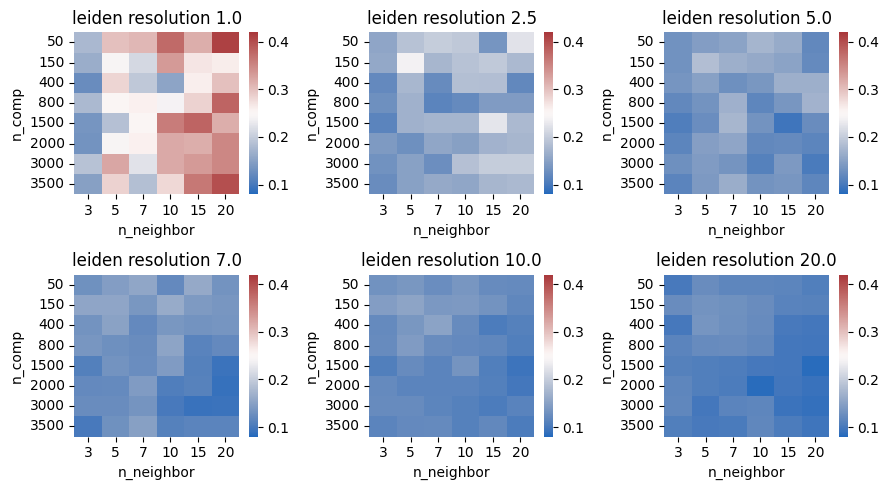

In [53]:
resolution_all = enrich_stat_df.resolution.unique()
fig, axes = plt.subplots(2, 3, figsize=(9,5))
ax = axes.flatten()
for i, resolution in enumerate(resolution_all):
    heatmap_data = enrich_stat_df[enrich_stat_df.resolution==resolution].pivot_table(index="n_comp", columns="n_neighbor", values="stringdb_metric2_cluster_fraction")
    sns.heatmap(heatmap_data, ax=ax[i], vmin=0.08, vmax=0.42, cmap='vlag')
    ax[i].set_title('leiden resolution '+str(resolution))

plt.tight_layout()

### Try annotate n_cells >= 100, n_de >= 50, n_comp=150, n_neighbors=5, resolution=7

In [80]:
mask = (de_counts.n_total_de_genes>50) & (de_counts.n_cells_target>100)
adata_de_filtered = adata_de[mask].copy()
adata_de_filtered.X = np.nan_to_num(adata_de_filtered.layers['zscore'], 0)
adata_test = adata_de_filtered.copy()
sc.pp.scale(adata_test)
sc.pp.pca(adata_test, n_comps=150)
sc.pp.neighbors(adata_test, n_neighbors=5, n_pcs=150)
sc.tl.leiden(adata_test, resolution=10, random_state=13)
adata_test.obs['leiden'] = adata_test.obs['leiden'].astype(int)
adata_test.obs['leiden'] = adata_test.obs['leiden'].astype('category')

In [81]:
num_of_leiden = len(adata_test.obs['leiden'].unique())
corr = np.zeros(num_of_leiden)
for i in range(len(corr)):
    list1 = adata_test[adata_test.obs['leiden']==i].obs.target_contrast_gene_name.values.tolist()
    list2 = adata_test[adata_test.obs['leiden']==i].obs.culture_condition.values.tolist()
    test = pd.DataFrame(data=adata_test[adata_test.obs['leiden']==i].X.toarray(),
                        index=[f"{item1}_{item2}" for item1, item2 in zip(list1, list2)],
                        columns=adata_test.var.gene_name)
    test2 = test.T.corr()
    np.fill_diagonal(test2.values, 0)
    corr[i] = np.mean(test2)

In [167]:
adata_test.obs.to_csv('../../../RZAnalysisCodes/results/de50ntotal150_comp150neighbor5resolution10.csv')

In [165]:
adata_test.obs.leiden.unique()

[92, 56, 44, 37, 126, ..., 120, 136, 145, 149, 143]
Length: 156
Categories (156, int64): [0, 1, 2, 3, ..., 152, 153, 154, 155]

In [105]:
corr[38]

0.09190241488278306

In [98]:
np.where(corr<0.099)[0]

array([ 17,  33,  37,  38,  41,  42,  56,  65,  68,  74,  77,  79,  81,
        82,  83,  86,  93,  94,  97,  99, 100, 105, 106, 109, 111, 112,
       113, 114, 116, 131, 139])

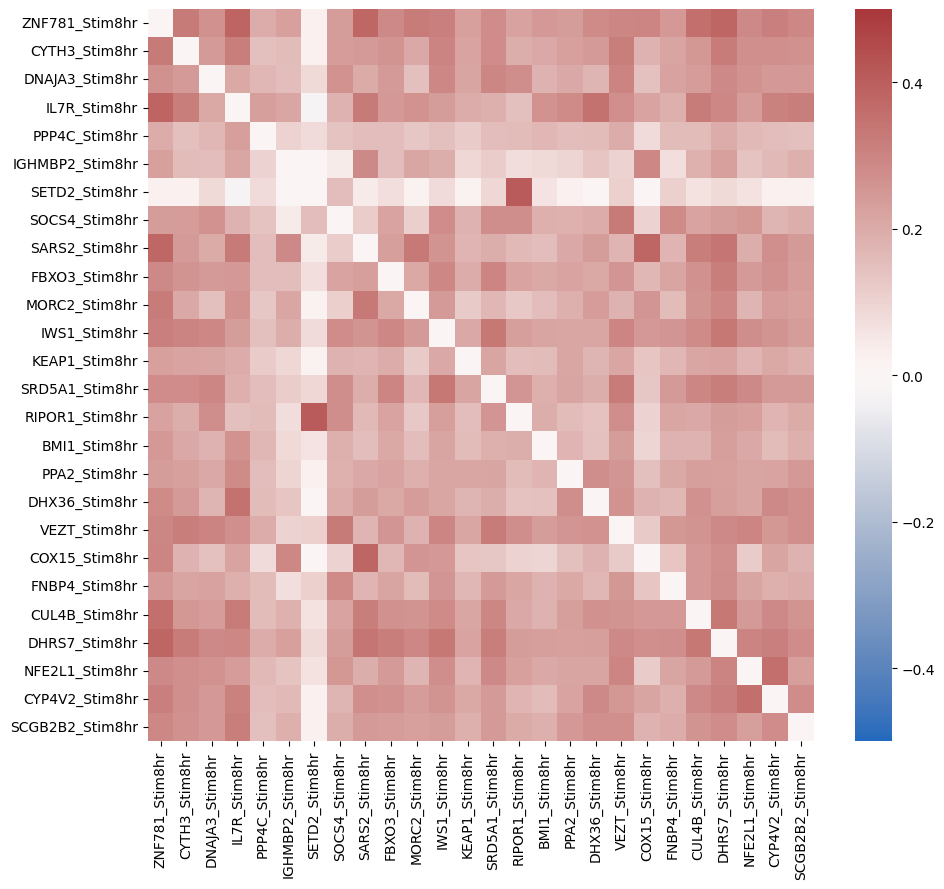

In [128]:
fig, ax = plt.subplots(figsize=(10,9))
cluster_label = 'leiden'
i = 58
list1 = adata_test[adata_test.obs['leiden']==i].obs.target_contrast_gene_name.values.tolist()
list2 = adata_test[adata_test.obs['leiden']==i].obs.culture_condition.values.tolist()
test = pd.DataFrame(data=adata_test[adata_test.obs['leiden']==i].X.toarray(),
                    index=[f"{item1}_{item2}" for item1, item2 in zip(list1, list2)],
                    columns=adata_test.var.gene_name)
test2 = test.T.corr()
np.fill_diagonal(test2.values, 0)
sns.heatmap(test2, vmin=-0.5, vmax=0.5, cmap='vlag', ax=ax)
plt.tight_layout()

In [83]:
len(corr[corr>0.1])

123

In [93]:
adata_test.obs.leiden.unique({'leiden':)

[92, 56, 44, 37, 126, ..., 120, 136, 145, 149, 143]
Length: 156
Categories (156, int64): [0, 1, 2, 3, ..., 152, 153, 154, 155]

In [ ]:
leiden_corr_df = pd.DataFrame(

In [91]:
stringdb_enrichment = access_complex_enrichment(adata_test, stringdb_complexes)
corum_enrichment = access_complex_enrichment(adata_test, corum_complexes)

In [ ]:
results_df = pd.merge(results_df, cluster_info, left_on='complex', right_on='cluster_id')

In [ ]:
stringdb_enrichment

In [92]:
stringdb_enrichment[stringdb_enrichment.raw_p_value<1e-3].to_csv('../../../RZAnalysisCodes/results/pcs_neighbors_resolution_clustering_screening_de50ntotal100_testannotation.csv')

,cluster,complex,cluster_size,overlap_genes,overlap_fraction,raw_p_value,complex_size
0,92,CL:39184,20,[],0.0,1.0,7
1,92,CL:39182,20,[],0.0,1.0,13
2,92,CL:39156,20,[],0.0,1.0,26
3,92,CL:39173,20,[],0.0,1.0,5
4,92,CL:39157,20,[],0.0,1.0,13
...,...,...,...,...,...,...,...
742087,143,CL:232,3,[],0.0,1.0,8
742088,143,CL:168,3,[],0.0,1.0,40
742089,143,CL:217,3,[],0.0,1.0,8
742090,143,CL:169,3,[],0.0,1.0,32


In [127]:
adata_test[adata_test.obs.target_contrast_gene_name.str.startswith('SOCS')].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000184557_Rest,SOCS3,Rest,ENSG00000184557,15,113.0,27
ENSG00000180008_Rest,SOCS4,Rest,ENSG00000180008,113,215.0,62
ENSG00000180008_Stim8hr,SOCS4,Stim8hr,ENSG00000180008,204,269.0,58
ENSG00000180008_Stim48hr,SOCS4,Stim48hr,ENSG00000180008,476,166.0,8


In [88]:
adata_test[adata_test.obs.target_contrast_gene_name.str.startswith('MED12')].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000184634_Rest,MED12,Rest,ENSG00000184634,116,229.0,46
ENSG00000184634_Stim8hr,MED12,Stim8hr,ENSG00000184634,523,219.0,25
ENSG00000184634_Stim48hr,MED12,Stim48hr,ENSG00000184634,552,191.0,117


In [90]:
adata_test[adata_test.obs.leiden==25].obs.sort_values(by='culture_condition')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000178202_Rest,KDELC2,Rest,ENSG00000178202,14,316.0,25
ENSG00000180182_Rest,MED14,Rest,ENSG00000180182,652,237.0,25
ENSG00000125686_Rest,MED1,Rest,ENSG00000125686,74,186.0,25
ENSG00000008838_Rest,MED24,Rest,ENSG00000008838,116,755.0,25
ENSG00000108510_Stim8hr,MED13,Stim8hr,ENSG00000108510,10,1232.0,25
ENSG00000106484_Stim8hr,MEST,Stim8hr,ENSG00000106484,396,1799.0,25
ENSG00000185651_Stim8hr,UBE2L3,Stim8hr,ENSG00000185651,442,1930.0,25
ENSG00000178202_Stim8hr,KDELC2,Stim8hr,ENSG00000178202,516,238.0,25
ENSG00000184634_Stim8hr,MED12,Stim8hr,ENSG00000184634,523,219.0,25
ENSG00000124222_Stim8hr,STX16,Stim8hr,ENSG00000124222,579,805.0,25


In [38]:
adata.obs['leiden'] = row.leiden_assignment
adata.obs['leiden'] = adata.obs['leiden'].astype('category')
stringdb_enrichment = access_complex_enrichment(adata, stringdb_complexes)
corum_enrichment = access_complex_enrichment(adata, corum_complexes)
# stringdb_enrichment = pd.merge(stringdb_enrichment, cluster_info, left_on='complex', right_on='cluster_id')

### Metric 1: p<1e-5, overlap_fraction>0.1, leiden_size>6, internal correlation>0.1 or p<1e-3, overlap_fraction>0.5, leiden_size>6, internal correlation>0.2 
### Metric 2: p<1e-6, overlap_fraction>0.2, leiden_size>8, internal correlation>0.2 or p<1e-3, overlap_fraction>0.5, leiden_size>6, internal correlation>0.2 

In [40]:
cluster_pass_filter

[33, 66, 3, 35, 5, 36, 67, 68, 73, 42, 46, 17, 53, 22, 59, 60, 62, 63]

In [41]:
stringdb_enrichment[mask]

,cluster,complex,leiden_size,overlap_genes,overlap_fraction,raw_p_value,cluster_size
27646,46,CL:7611,24,"[URM1, ELP1, MOCS3, CTU2, CTU1, IMMP1L, ELP4, ...",0.458333,2.667707e-15,51
27651,46,CL:7612,24,"[URM1, ELP1, MOCS3, CTU2, CTU1, IMMP1L, ELP4, ...",0.458333,2.463511e-17,35
27654,46,CL:7613,24,"[URM1, ELP1, MOCS3, CTU2, CTU1, ELP4, ELP3, KT...",0.416667,1.491249e-18,19
27655,46,CL:7628,24,"[URM1, MOCS3, CTU2, CTU1]",0.166667,7.078803e-09,5
27656,46,CL:7614,24,"[URM1, ELP1, MOCS3, CTU2, KTI12, ELP4, ELP3, C...",0.416667,1.091826e-21,12
...,...,...,...,...,...,...,...
359696,73,CL:15542,11,"[CD3E, CD3D, CD3G, CD247]",0.363636,2.087710e-07,20
359698,73,CL:15543,11,"[CD3E, CD3D, CD3G, CD247]",0.363636,2.159315e-08,12
359699,73,CL:15545,11,"[CD3E, CD3D, CD3G, CD247]",0.363636,6.603867e-10,6
364162,70,CL:17858,15,"[ARPC3, ACTR2, ARPC2]",0.200000,1.105452e-06,6


### Choose n_comp=50, resolution 7, n_neighbors 7

In [365]:
adata = adata_de_filtered.copy()
sc.pp.scale(adata)

In [486]:
sc.pp.pca(adata, n_comps=3661)

In [370]:
sc.pp.pca(adata, n_comps=1000)
sc.pp.neighbors(adata, n_neighbors=7, n_pcs=1000)
sc.tl.leiden(adata, resolution=7, random_state=13)
adata.obs['leiden'] = adata.obs['leiden'].astype(int)
adata.obs['leiden'] = adata.obs['leiden'].astype('category')

In [520]:
sc.pp.neighbors(adata, n_neighbors=7, n_pcs=2000)
sc.tl.leiden(adata, resolution=7, random_state=13)
adata.obs['leiden'] = adata.obs['leiden'].astype(int)
adata.obs['leiden'] = adata.obs['leiden'].astype('category')

In [563]:
adata[adata.obs.target_contrast_gene_name.str.startswith('TAF')].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000135801_Stim8hr,TAF5L,Stim8hr,ENSG00000135801,112,174.0,36
ENSG00000135801_Rest,TAF5L,Rest,ENSG00000135801,365,148.0,36
ENSG00000135801_Stim48hr,TAF5L,Stim48hr,ENSG00000135801,454,161.0,83
ENSG00000162227_Rest,TAF6L,Rest,ENSG00000162227,53,871.0,36
ENSG00000162227_Stim48hr,TAF6L,Stim48hr,ENSG00000162227,268,672.0,83
ENSG00000162227_Stim8hr,TAF6L,Stim8hr,ENSG00000162227,381,806.0,36
ENSG00000064995_Rest,TAF11,Rest,ENSG00000064995,264,1388.0,89
ENSG00000064995_Stim8hr,TAF11,Stim8hr,ENSG00000064995,479,1067.0,89
ENSG00000064995_Stim48hr,TAF11,Stim48hr,ENSG00000064995,491,863.0,33
ENSG00000197780_Rest,TAF13,Rest,ENSG00000197780,417,671.0,89


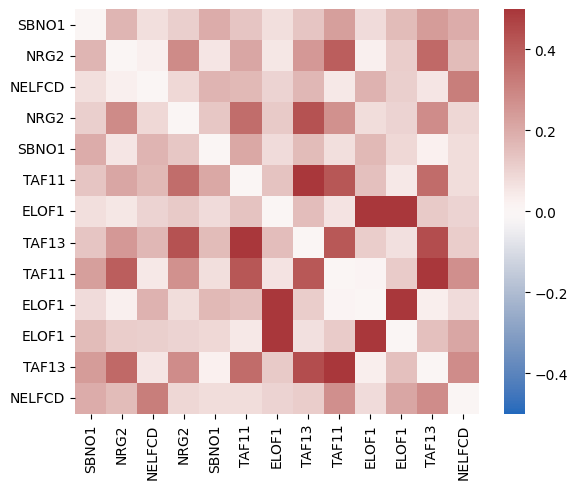

In [566]:
fig, ax = plt.subplots(figsize=(6,5))
cluster_label = 'leiden'
i = 89
test = pd.DataFrame(data=adata[adata.obs[cluster_label]==i].X.toarray(),
                    index=adata[adata.obs[cluster_label]==i].obs.target_contrast_gene_name.values.tolist(),
                    columns=adata.var.gene_name)
test2 = test.T.corr()
np.fill_diagonal(test2.values, 0)
sns.heatmap(test2, vmin=-0.5, vmax=0.5, cmap='vlag', ax=ax)
plt.tight_layout()

In [508]:
adata[adata.obs.leiden==59].obs.target_contrast_gene_name.unique()

['CASC3', 'SMG7', 'SMG9', 'SRR', 'XRN1', 'UPF2', 'SMG1', 'SMG8', 'TMEM79']
Categories (9, object): ['CASC3', 'SMG1', 'SMG7', 'SMG8', ..., 'SRR', 'TMEM79', 'UPF2', 'XRN1']

In [514]:
np.median(test2)

0.15685297467575932

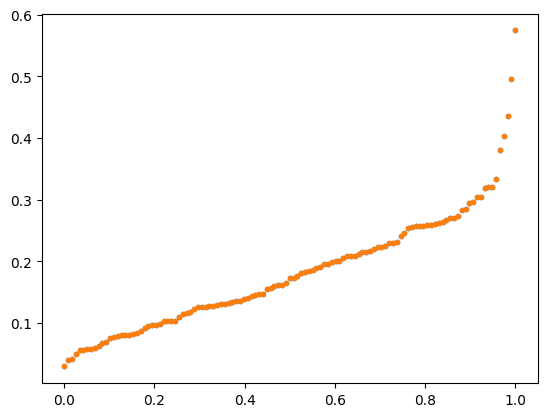

In [420]:
plt.plot(np.linspace(0,1,len(corr)), np.sort(corr), '.')
plt.plot(np.linspace(0,1,len(corr_copy)), np.sort(corr_copy), '.')

In [419]:
num_of_leiden = len(adata.obs['leiden'].unique())
corr = np.zeros(num_of_leiden)
for i in range(len(corr)):
    test = pd.DataFrame(data=adata[adata.obs['leiden']==i].X.toarray(),
                        index=adata[adata.obs['leiden']==i].obs.target_contrast_gene_name.values.tolist(),
                        columns=adata.var.gene_name)
    test2 = test.T.corr()
    np.fill_diagonal(test2.values, 0)
    corr[i] = np.mean(test2)

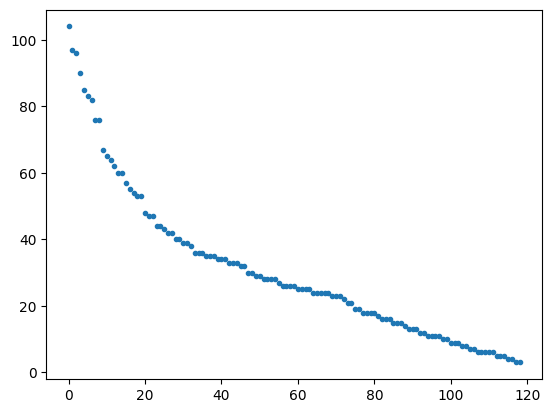

In [525]:
plt.plot(adata.obs.leiden.value_counts(), '.')

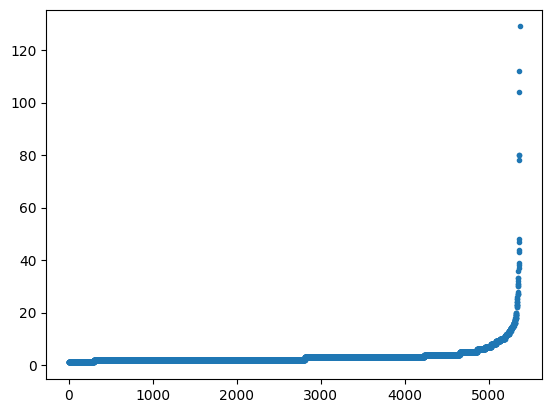

In [593]:
plt.plot(np.sort(corum_summary['cluster_size']), '.')

In [582]:
# --- Step 2: Perform Enrichment Analysis ---
results = []
for cluster, de_genes in de_genes_per_cluster.items():
    n = len(de_genes)
    for complex_name, subunits in corum_complexes.items():
        K = len(subunits)
        # Find the overlap between DE genes and complex subunits
        overlap = de_genes.intersection(subunits)
        k = len(overlap)
        
        # Calculate the p-value
        if n > 0 and K > 0: # Avoid division by zero or trivial cases
            pval = hypergeom.sf(k - 1, N, K, n) # sf is survival function
            
            # Adjust for multiple testing (e.g., using Benjamini-Hochberg)
            # This is a crucial step to avoid false positives
            # Store raw p-values and correct later
            results.append({
                'cluster': cluster,
                'complex': complex_name,
                'leiden_size': n,
                'overlap_genes': list(overlap),
                'overlap_fraction': len(overlap)/n,
                'raw_p_value': pval,
                'cluster_size': K
            })

# Convert results to a DataFrame for easy viewing
results_df = pd.DataFrame(results)

In [581]:
# --- Step 2: Perform Enrichment Analysis ---
results = []
for cluster, de_genes in de_genes_per_cluster.items():
    n = len(de_genes)
    for complex_name, subunits in stringdb_complexes.items():
        K = len(subunits)
        # Find the overlap between DE genes and complex subunits
        overlap = de_genes.intersection(subunits)
        k = len(overlap)
        
        # Calculate the p-value
        if n > 0 and K > 0: # Avoid division by zero or trivial cases
            pval = hypergeom.sf(k - 1, N, K, n) # sf is survival function
            
            # Adjust for multiple testing (e.g., using Benjamini-Hochberg)
            # This is a crucial step to avoid false positives
            # Store raw p-values and correct later
            results.append({
                'cluster': cluster,
                'complex': complex_name,
                'leiden_size': n,
                'overlap_genes': list(overlap),
                'overlap_fraction': len(overlap)/n,
                'raw_p_value': pval,
            })

# Convert results to a DataFrame for easy viewing
results_df = pd.DataFrame(results)

# --- Step 3: Correct for Multiple Testing ---
# Extract the raw p-values from the DataFrame
raw_p_values = results_df['raw_p_value'].to_numpy()

# Apply the Benjamini-Hochberg procedure to get adjusted p-values (q-values)
reject_bh, bh_pvals, _, _ = multipletests(raw_p_values, method='fdr_bh')

# Add the new adjusted p-values as a column to the DataFrame
results_df['adjusted_p_value'] = bh_pvals

results_df = pd.merge(results_df, cluster_info, left_on='complex', right_on='cluster_id')

In [583]:
results_df

,cluster,complex,leiden_size,overlap_genes,overlap_fraction,raw_p_value,cluster_size
0,56,BCL6-HDAC4 complex,26,[],0.0,1.0,2
1,56,BCL6-HDAC5 complex,26,[],0.0,1.0,2
2,56,BCL6-HDAC7 complex,26,[],0.0,1.0,2
3,56,Multisubunit ACTR coactivator complex,26,[],0.0,1.0,4
4,56,Condensin I complex,26,[],0.0,1.0,5
...,...,...,...,...,...,...,...
631766,115,DRD5-NPFFR1 complex,2,[],0.0,1.0,2
631767,115,DRD1-NPFFR2 complex,2,[],0.0,1.0,2
631768,115,HCRTR1-QRFPR complex,2,[],0.0,1.0,2
631769,115,LRP4-SOST complex,2,[],0.0,1.0,2


In [547]:
len(results_df[results_df.adjusted_p_value<0.05].cluster.unique())/max(results_df.cluster)

0.3050847457627119

88

In [567]:
len(results_df[(results_df.overlap_fraction>0.2)&(results_df.leiden_size>8)].cluster.unique())/len(results_df[results_df.leiden_size>8].cluster.unique())

0.5

In [ ]:
results_df[(results_df.overlap_fraction>0.2)&(results_df.leiden_size>8)].sort_values(by='leiden_size').head(50)

In [ ]:
results_df[results_df.adjusted_p_value<1e-3]

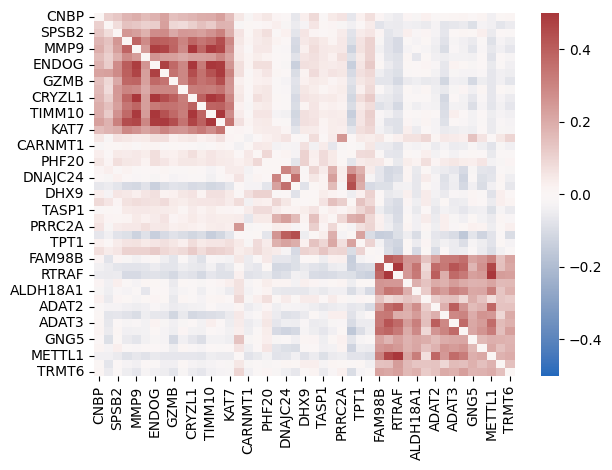

In [313]:
fig, ax = plt.subplots()
cluster_label = 'leiden'
i = 122
test = pd.DataFrame(data=np.concatenate([adata[adata.obs[cluster_label]==i].X.toarray(),
                                         adata[adata.obs[cluster_label]==i+1].X.toarray(),
                                         adata[adata.obs[cluster_label]==i+2].X.toarray()]),
                    index=adata[adata.obs[cluster_label]==i].obs.target_contrast_gene_name.values.tolist()+\
                    adata[adata.obs[cluster_label]==i+1].obs.target_contrast_gene_name.values.tolist()+\
                    adata[adata.obs[cluster_label]==i+2].obs.target_contrast_gene_name.values.tolist(),
                    columns=adata.var.gene_name)
test2 = test.T.corr()
np.fill_diagonal(test2.values, 0)
sns.heatmap(test2, vmin=-0.5, vmax=0.5, cmap='vlag', ax=ax)
plt.tight_layout()

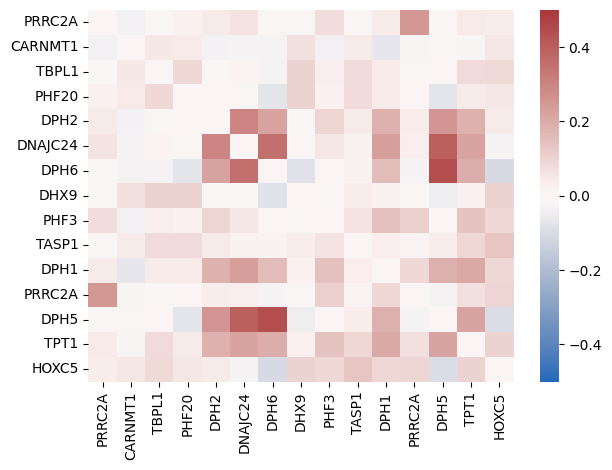

In [314]:
fig, ax = plt.subplots()
cluster_label = 'leiden'
i = 123
test = pd.DataFrame(data=adata[adata.obs[cluster_label]==i].X.toarray(),
                    index=adata[adata.obs[cluster_label]==i].obs.target_contrast_gene_name.values.tolist(),
                    columns=adata.var.gene_name)
test2 = test.T.corr()
np.fill_diagonal(test2.values, 0)
sns.heatmap(test2, vmin=-0.5, vmax=0.5, cmap='vlag', ax=ax)
plt.tight_layout()

In [309]:
test.index.tolist()

['DPH5',
 'TTC4',
 'TTC37',
 'ARSK',
 'DIS3L',
 'DPH2',
 'DNAJC24',
 'TPT1',
 'DPH6',
 'TPT1',
 'TTC4',
 'PHF3',
 'HEXIM1',
 'DPH1',
 'DPH1',
 'AVEN',
 'HEXIM1',
 'DPH5',
 'DNAJC24',
 'DPH2',
 'TPT1']

In [307]:
np.mean(test2)

0.09065444167418633

In [ ]:
plt.plot(adata_de_filtered.obs.leiden.value_counts(), '.')

In [266]:
adata = adata_de_filtered.copy()
sc.pp.scale(adata)
sc.pp.pca(adata, n_comps=100)
embedding = pymde.preserve_neighbors(
    #data=adata.X,
    data=adata.obsm['X_pca'],
    embedding_dim=2,
    n_neighbors=10,
    repulsive_fraction=10,
).embed(verbose=True)

Aug 17 07:07:19 AM: Fitting a centered embedding into R^2, for a graph with 3661 items and 329018 edges.
Aug 17 07:07:19 AM: `embed` method parameters: eps=1.0e-05, max_iter=300, memory_size=10
Aug 17 07:07:19 AM: iteration 000 | distortion 0.684400 | residual norm 0.0353157 | step length 0.478411 | percent change 0.0197448
Aug 17 07:07:19 AM: iteration 030 | distortion 0.103818 | residual norm 0.000366117 | step length 1 | percent change 1.96436
Aug 17 07:07:19 AM: iteration 060 | distortion 0.098581 | residual norm 0.000141404 | step length 1 | percent change 0.420253
Aug 17 07:07:20 AM: iteration 090 | distortion 0.097128 | residual norm 6.70662e-05 | step length 1 | percent change 0.399833
Aug 17 07:07:20 AM: iteration 120 | distortion 0.096462 | residual norm 6.90117e-05 | step length 1 | percent change 0.325912
Aug 17 07:07:20 AM: iteration 150 | distortion 0.096202 | residual norm 5.3244e-05 | step length 1 | percent change 0.102736
Aug 17 07:07:21 AM: iteration 180 | distortion

In [288]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=10, min_samples=10, cluster_selection_method='eom')
cluster_labels = clusterer.fit_predict(embedding)
adata.obs['hdbscan'] = cluster_labels
adata.obs['hdbscan'] = adata.obs['hdbscan'].astype('category')

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [289]:
cluster_labels

array([31, 53, 54, ..., 21, 21, 16])

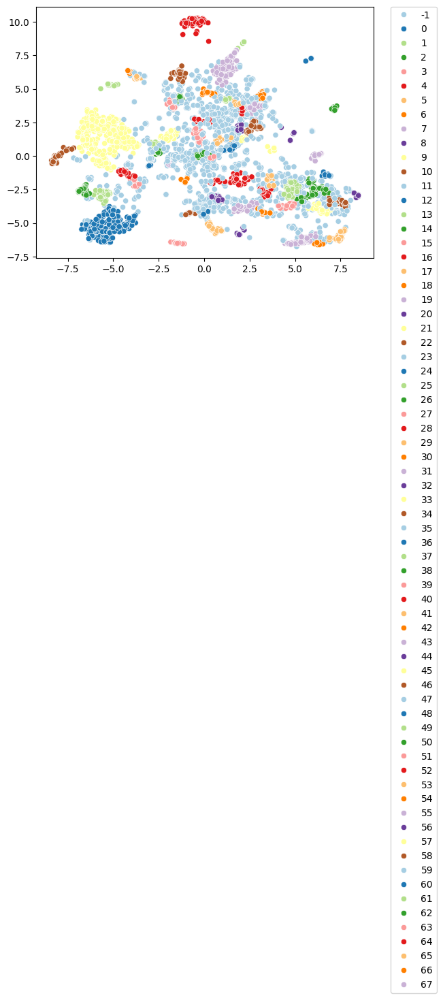

In [290]:
sns.scatterplot(x=embedding.numpy()[:,0], y=embedding.numpy()[:,1], hue=cluster_labels, palette='Paired')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

array([ 9, 19,  4, ..., -1, 35, 18])

In [715]:
X_genes = pd.DataFrame(adata_de_filtered.X.T, index=adata_de_filtered.var_names, columns=adata_de_filtered.obs.target_contrast_gene_name)
start_time = timeit.default_timer()
correlation_matrix = X_genes.corr()
end_time = timeit.default_timer()
print(end_time-start_time)

175.7477843752131


/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


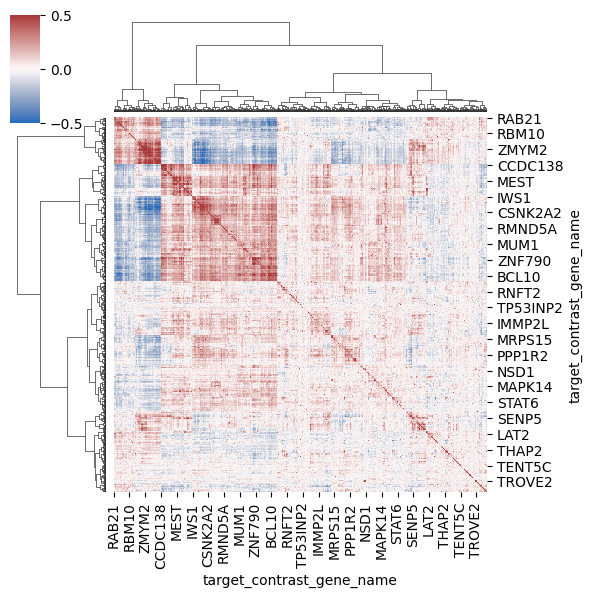

In [345]:
X_genes = pd.DataFrame(adata_de_filtered.X.T, index=adata_de_filtered.var_names, columns=adata_de_filtered.obs.target_contrast_gene_name)
correlation_matrix = X_genes.corr()
clustermap = sns.clustermap(
    correlation_matrix,
    method='ward', metric='euclidean',
    figsize=(6,6), 
    cmap='vlag',
    vmax=0.5,
    vmin=-0.5,
)

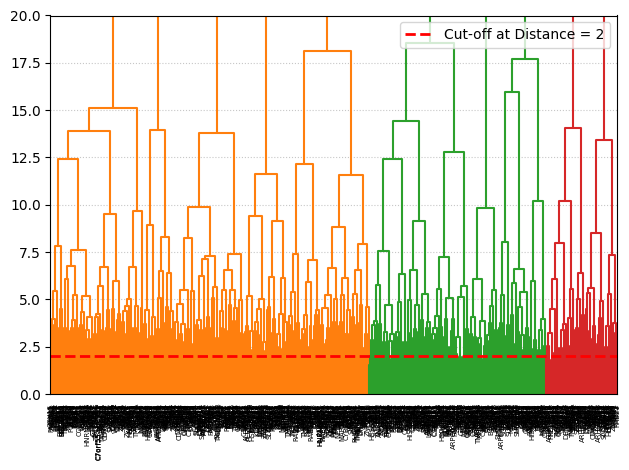

In [346]:
linked = clustermap.dendrogram_row.linkage
dendrogram(
    linked,
    orientation='top',
    labels=correlation_matrix.index.tolist(), # Use perturbation names as labels
    distance_sort='descending',
    show_leaf_counts=True,
)
cut_off_distance = 2 # Example: Adjust this value after viewing the dendrogram
plt.ylim([0,20])
plt.axhline(y=cut_off_distance, color='r', linestyle='--', linewidth=2, label=f'Cut-off at Distance = {cut_off_distance}')
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()
cutoff = 6
cluster_labels = fcluster(linked, cutoff, criterion='distance')
adata_de_filtered.obs['hierarchical_clusters'] = pd.Categorical(cluster_labels)

In [810]:
list1 = adata_de_filtered.obs.target_contrast_gene_name.values.tolist()
list2 = adata_de_filtered.obs.culture_condition.values.tolist()
square_dist_matrix = dist.squareform(dist.pdist(correlation_matrix, metric='euclidean'))
adata = ad.AnnData(
    X=square_dist_matrix,
    #X=correlation_matrix.values,
    obs=pd.DataFrame(index=[f"{item1}_{item2}" for item1, item2 in zip(list1, list2)]),
    var=pd.DataFrame(index=[f"{item1}_{item2}" for item1, item2 in zip(list1, list2)])
)
#sc.pp.scale(adata)
#sc.pp.pca(adata, n_comps=30)
#sc.pp.neighbors(adata, n_neighbors=5, use_rep='X_pca')
sc.pp.neighbors(adata, n_neighbors=30, use_rep='X', metric='precomputed')
sc.tl.leiden(adata, resolution=100.0, random_state=13)
adata_de_filtered.obs['leiden'] = adata.obs['leiden'].values.astype(int)
adata_de_filtered.obs['leiden'] = adata_de_filtered.obs['leiden'].astype('category')

In [539]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=10, min_samples=10, cluster_selection_method='leaf')
#cluster_labels = clusterer.fit_predict(adata.obsm['X_pca'])
cluster_labels = clusterer.fit_predict(adata.X)
adata.obs['hdbscan'] = cluster_labels

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [811]:
adata.obs.leiden.unique()

['44', '583', '356', '39', '198', ..., '744', '761', '749', '770', '645']
Length: 771
Categories (771, object): ['0', '1', '2', '3', ..., '767', '768', '769', '770']

In [777]:
corr_all_copy = corr_all.copy()

In [ ]:
adata[adata.obs.index.str.startswith(('MED', 'TAF', 'SMG', 'DPH'))].obs.sort_index()

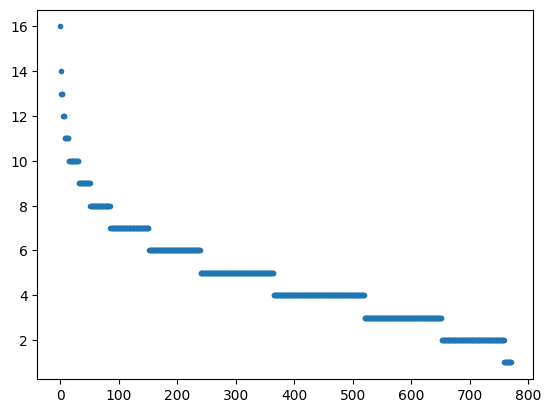

In [812]:
plt.plot(adata_de_filtered.obs.leiden.value_counts(), '.')

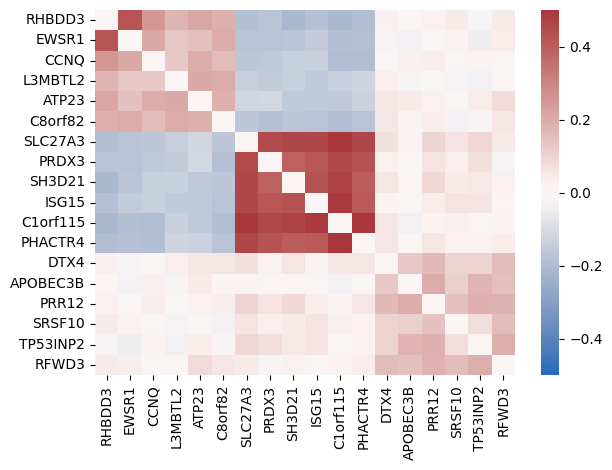

In [813]:
fig, ax = plt.subplots()
cluster_label = 'leiden'
i = 210
test = pd.DataFrame(data=np.concatenate([adata_de_filtered[adata_de_filtered.obs[cluster_label]==i].X.toarray(),
                                         adata_de_filtered[adata_de_filtered.obs[cluster_label]==i+1].X.toarray(),
                                         adata_de_filtered[adata_de_filtered.obs[cluster_label]==i+2].X.toarray()]),
                    index=adata_de_filtered[adata_de_filtered.obs[cluster_label]==i].obs.target_contrast_gene_name.values.tolist()+\
                    adata_de_filtered[adata_de_filtered.obs[cluster_label]==i+1].obs.target_contrast_gene_name.values.tolist()+\
                    adata_de_filtered[adata_de_filtered.obs[cluster_label]==i+2].obs.target_contrast_gene_name.values.tolist(),
                    columns=adata_de_filtered.var.gene_name)
test2 = test.T.corr()
np.fill_diagonal(test2.values, 0)
sns.heatmap(test2, vmin=-0.5, vmax=0.5, cmap='vlag', ax=ax)
plt.tight_layout()

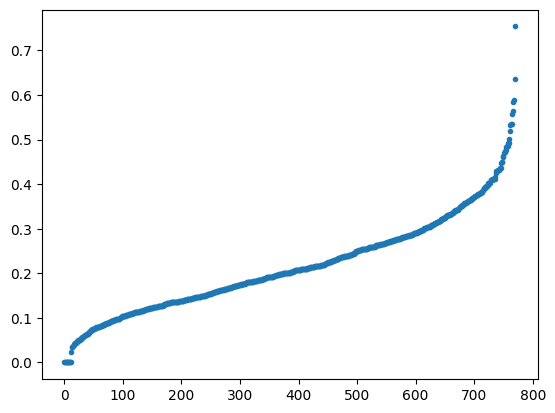

In [814]:
num_of_leiden = len(adata_de_filtered.obs['leiden'].unique())
corr_all = np.zeros(num_of_leiden)
for i in range(len(corr_all)):
    test = pd.DataFrame(data=adata_de_filtered[adata_de_filtered.obs['leiden']==i].X.toarray(),
                        index=adata_de_filtered[adata_de_filtered.obs['leiden']==i].obs.target_contrast_gene_name.values.tolist(),
                        columns=adata_de_filtered.var.gene_name)
    test2 = test.T.corr()
    np.fill_diagonal(test2.values, 0)
    corr_all[i] = np.mean(test2)

plt.plot(np.sort(corr_all), '.')

In [721]:
adata_de_filtered_copy = adata_de_filtered.copy()

In [750]:
sc.pp.scale(adata_de_filtered_copy)
sc.pp.pca(adata_de_filtered_copy, n_comps=30)
sc.pp.neighbors(adata_de_filtered_copy, n_neighbors=10, n_pcs=30)
sc.tl.leiden(adata_de_filtered_copy, resolution=20, random_state=13)
adata_de_filtered.obs['leiden'] = adata_de_filtered_copy.obs['leiden'].astype(int)
adata_de_filtered.obs['leiden'] = adata_de_filtered.obs['leiden'].astype('category')
adata_de_filtered.obs.leiden.unique()

[5, 178, 4, 30, 97, ..., 98, 143, 181, 197, 150]
Length: 212
Categories (212, int64): [0, 1, 2, 3, ..., 208, 209, 210, 211]

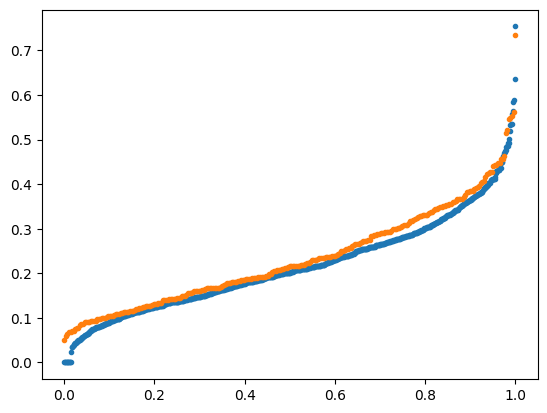

In [815]:
plt.plot(np.linspace(0,1,len(corr_all)), np.sort(corr_all), '.')
plt.plot(np.linspace(0,1,len(corr_all_copy)), np.sort(corr_all_copy), '.')

In [ ]:
num_of_leiden = len(adata_de_filtered.obs['leiden'].unique())
corr_all = np.zeros(num_of_leiden)
for i in range(len(corr_all)):
    test = pd.DataFrame(data=adata_de_filtered[adata_de_filtered.obs['leiden']==i].X.toarray(),
                        index=adata_de_filtered[adata_de_filtered.obs['leiden']==i].obs.target_contrast_gene_name.values.tolist(),
                        columns=adata_de_filtered.var.gene_name)
    test2 = test.T.corr()
    np.fill_diagonal(test2.values, 0)
    corr_all[i] = np.mean(test2)

plt.plot(np.sort(corr_all), '.')

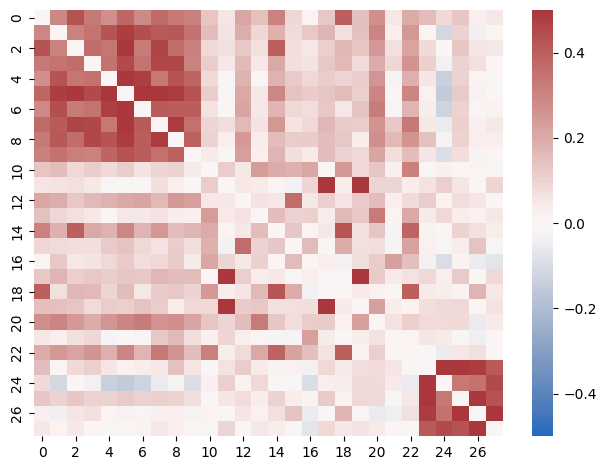

In [252]:
fig, ax = plt.subplots()
cluster_label = 'hierarchical_clusters'
i = 5
test = pd.DataFrame(data=np.concatenate([adata_de_filtered[adata_de_filtered.obs[cluster_label]==i].X.toarray(),
                                         adata_de_filtered[adata_de_filtered.obs[cluster_label]==i+1].X.toarray(),
                                         adata_de_filtered[adata_de_filtered.obs[cluster_label]==i+2].X.toarray()]),
                    index=adata_de_filtered[adata_de_filtered.obs[cluster_label]==i].obs.target_contrast_gene_name.values.tolist()+\
                    adata_de_filtered[adata_de_filtered.obs[cluster_label]==i+1].obs.target_contrast_gene_name.values.tolist()+\
                    adata_de_filtered[adata_de_filtered.obs[cluster_label]==i+2].obs.target_contrast_gene_name.values.tolist(),
                    columns=adata_de_filtered.var.gene_name)
test2 = test.T.corr().values
np.fill_diagonal(test2, 0)
sns.heatmap(test2, vmin=-0.5, vmax=0.5, cmap='vlag', ax=ax)
plt.tight_layout()

In [ ]:
X_genes = pd.DataFrame(adata_de_filtered.X.T, index=adata_de_filtered.var_names, columns=adata_de_filtered.obs_names)
corr_dist = pdist(X_genes.T, metric='correlation')
linked = linkage(corr_dist, method='ward')
cutoff = 0.95
cluster_labels = fcluster(linked, cutoff, criterion='distance')
adata_de_filtered.obs['hierarchical_clusters'] = pd.Categorical(cluster_labels)
fig, ax = plt.subplots()
cluster_label = 'hierarchical_clusters'
i = 2
test = pd.DataFrame(data=np.concatenate([adata_de_filtered[adata_de_filtered.obs[cluster_label]==i].X.toarray(),
                                         adata_de_filtered[adata_de_filtered.obs[cluster_label]==i+1].X.toarray(),
                                         adata_de_filtered[adata_de_filtered.obs[cluster_label]==i+2].X.toarray()]),
                    index=adata_de_filtered[adata_de_filtered.obs[cluster_label]==i].obs.target_contrast_gene_name.values.tolist()+\
                    adata_de_filtered[adata_de_filtered.obs[cluster_label]==i+1].obs.target_contrast_gene_name.values.tolist()+\
                    adata_de_filtered[adata_de_filtered.obs[cluster_label]==i+2].obs.target_contrast_gene_name.values.tolist(),
                    columns=adata_de_filtered.var.gene_name)
test2 = test.T.corr().values
np.fill_diagonal(test2, 0)
sns.heatmap(test2, vmin=-0.5, vmax=0.5, cmap='vlag', ax=ax)
plt.tight_layout()

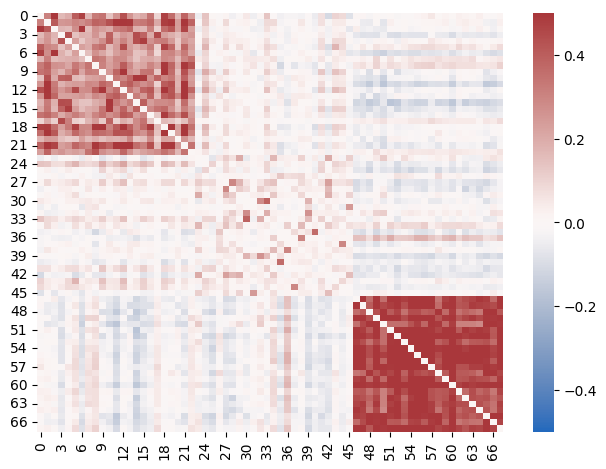

In [150]:
fig, ax = plt.subplots()
cluster_label = 'leiden'
i = 78
test = pd.DataFrame(data=np.concatenate([adata_de_filtered[adata_de_filtered.obs[cluster_label]==i].X.toarray(),
                                         adata_de_filtered[adata_de_filtered.obs[cluster_label]==i+1].X.toarray(),
                                         adata_de_filtered[adata_de_filtered.obs[cluster_label]==i+2].X.toarray()]),
                    index=adata_de_filtered[adata_de_filtered.obs[cluster_label]==i].obs.target_contrast_gene_name.values.tolist()+\
                    adata_de_filtered[adata_de_filtered.obs[cluster_label]==i+1].obs.target_contrast_gene_name.values.tolist()+\
                    adata_de_filtered[adata_de_filtered.obs[cluster_label]==i+2].obs.target_contrast_gene_name.values.tolist(),
                    columns=adata_de_filtered.var.gene_name)
test2 = test.T.corr().values
np.fill_diagonal(test2, 0)
sns.heatmap(test2, vmin=-0.5, vmax=0.5, cmap='vlag', ax=ax)
plt.tight_layout()

In [567]:
mask = (de_counts.n_total_de_genes>50) & (de_counts.n_cells_target>100)
adata_de_filtered = adata_de[mask].copy()
adata_de_filtered.X = np.nan_to_num(adata_de_filtered.layers['zscore'], 0)
sc.pp.scale(adata_de_filtered)

In [568]:
sc.pp.pca(adata_de_filtered, n_comps=30)
sc.pp.neighbors(adata_de_filtered, n_neighbors=5, n_pcs=30)
sc.tl.leiden(adata_de_filtered, resolution=30, random_state=13)
adata_de_filtered.obs['leiden'] = adata_de_filtered.obs['leiden'].astype(int)
adata_de_filtered.obs['leiden'] = adata_de_filtered.obs['leiden'].astype('category')
adata_de_filtered.obs.leiden.unique()

[2, 294, 274, 59, 124, ..., 306, 323, 324, 268, 232]
Length: 325
Categories (325, int64): [0, 1, 2, 3, ..., 321, 322, 323, 324]

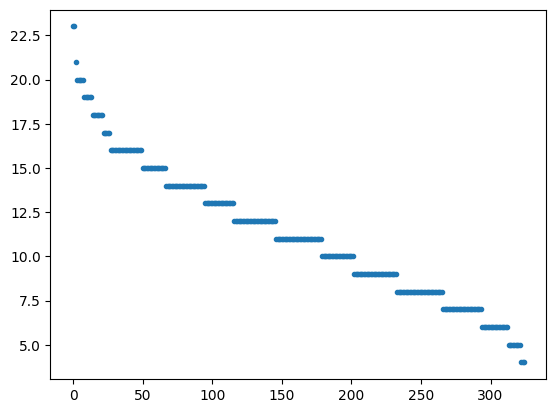

In [569]:
plt.plot(adata_de_filtered.obs.leiden.value_counts(), '.')

In [570]:
adata_de_filtered[adata_de_filtered.obs.target_contrast_gene_name.str.startswith('SMG')].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000157106_Stim48hr,SMG1,Stim48hr,ENSG00000157106,244,412.0,0
ENSG00000157106_Rest,SMG1,Rest,ENSG00000157106,519,484.0,0
ENSG00000157106_Stim8hr,SMG1,Stim8hr,ENSG00000157106,669,454.0,0
ENSG00000116698_Stim8hr,SMG7,Stim8hr,ENSG00000116698,59,198.0,0
ENSG00000116698_Rest,SMG7,Rest,ENSG00000116698,348,206.0,0
ENSG00000116698_Stim48hr,SMG7,Stim48hr,ENSG00000116698,671,176.0,0
ENSG00000167447_Stim8hr,SMG8,Stim8hr,ENSG00000167447,335,838.0,0
ENSG00000167447_Rest,SMG8,Rest,ENSG00000167447,448,932.0,0
ENSG00000167447_Stim48hr,SMG8,Stim48hr,ENSG00000167447,514,996.0,0
ENSG00000105771_Stim48hr,SMG9,Stim48hr,ENSG00000105771,68,610.0,0


In [571]:
adata_de_filtered[adata_de_filtered.obs.target_contrast_gene_name.str.startswith('DPH')].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000108963_Stim48hr,DPH1,Stim48hr,ENSG00000108963,457,108.0,117
ENSG00000108963_Rest,DPH1,Rest,ENSG00000108963,480,148.0,198
ENSG00000108963_Stim8hr,DPH1,Stim8hr,ENSG00000108963,550,233.0,224
ENSG00000132768_Stim48hr,DPH2,Stim48hr,ENSG00000132768,220,215.0,117
ENSG00000132768_Rest,DPH2,Rest,ENSG00000132768,653,328.0,198
ENSG00000117543_Rest,DPH5,Rest,ENSG00000117543,6,400.0,198
ENSG00000117543_Stim48hr,DPH5,Stim48hr,ENSG00000117543,606,180.0,117
ENSG00000117543_Stim8hr,DPH5,Stim8hr,ENSG00000117543,636,289.0,105
ENSG00000134146_Stim8hr,DPH6,Stim8hr,ENSG00000134146,130,327.0,105
ENSG00000134146_Stim48hr,DPH6,Stim48hr,ENSG00000134146,282,209.0,117


<Axes: >

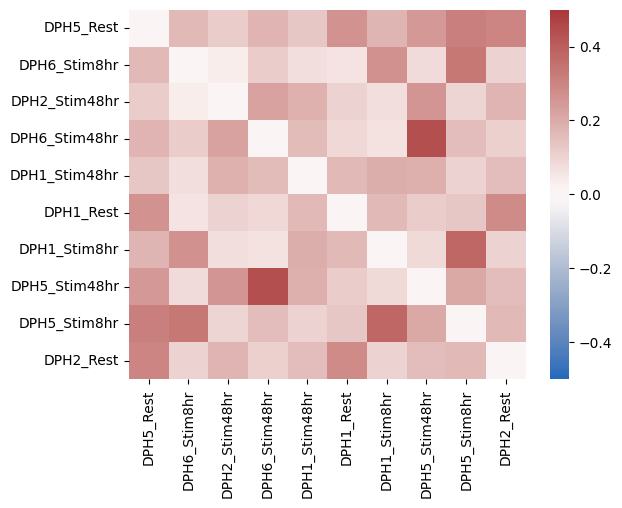

In [206]:
list1 = adata_de_filtered[adata_de_filtered.obs.target_contrast_gene_name.str.startswith('DPH')].obs.target_contrast_gene_name.values.tolist()
list2 = adata_de_filtered[adata_de_filtered.obs.target_contrast_gene_name.str.startswith('DPH')].obs.culture_condition.values.tolist()
test = pd.DataFrame(data=adata_de_filtered[adata_de_filtered.obs.target_contrast_gene_name.str.startswith('DPH')].layers['zscore'],
                    index=[f"{item1}_{item2}" for item1, item2 in zip(list1, list2)],
                    columns=adata_de_filtered.var.gene_name)
test2 = test.T.corr()
np.fill_diagonal(test2.values, 0)
sns.heatmap(test2, vmin=-0.5, vmax=0.5, cmap='vlag')

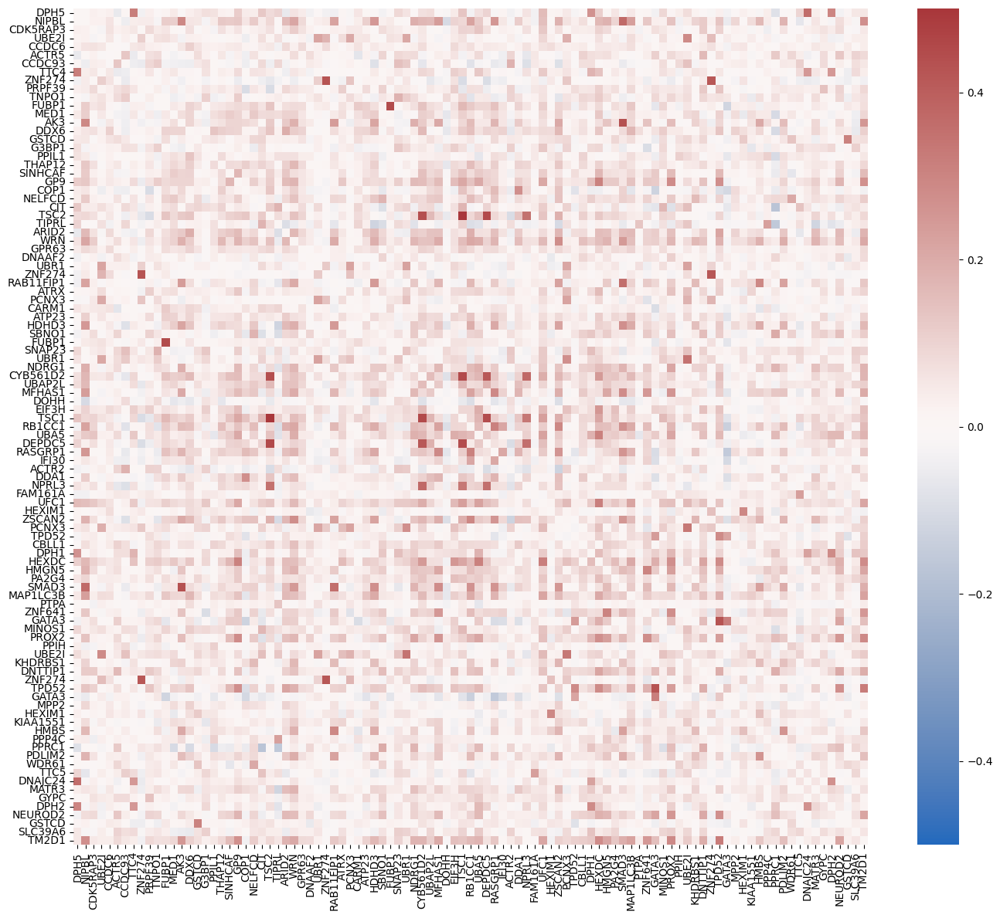

In [215]:
fig, ax = plt.subplots(figsize=(14,12))
cluster_label = 'leiden'
i = 9
test = pd.DataFrame(data=adata_de_filtered[adata_de_filtered.obs[cluster_label]==i].X.toarray(),
                    index=adata_de_filtered[adata_de_filtered.obs[cluster_label]==i].obs.target_contrast_gene_name.values.tolist(),
                    columns=adata_de_filtered.var.gene_name)
test2 = test.T.corr()
np.fill_diagonal(test2.values, 0)
sns.heatmap(test2, vmin=-0.5, vmax=0.5, xticklabels=test2.index, yticklabels=test2.columns, cmap='vlag', ax=ax)
plt.tight_layout()

In [229]:
adata_de_subset = adata_de_filtered[adata_de_filtered.obs['leiden']==9].copy()
sc.pp.pca(adata_de_subset, n_comps=20)
sc.pp.neighbors(adata_de_subset, n_neighbors=3, n_pcs=20)
sc.tl.leiden(adata_de_subset, resolution=2, random_state=13)
adata_de_subset.obs['leiden'] = adata_de_subset.obs['leiden'].astype(int)
adata_de_subset.obs['leiden'] = adata_de_subset.obs['leiden'].astype('category')
adata_de_subset.obs.leiden.unique()

[11, 0, 3, 7, 9, ..., 5, 8, 10, 2, 4]
Length: 17
Categories (17, int64): [0, 1, 2, 3, ..., 13, 14, 15, 16]

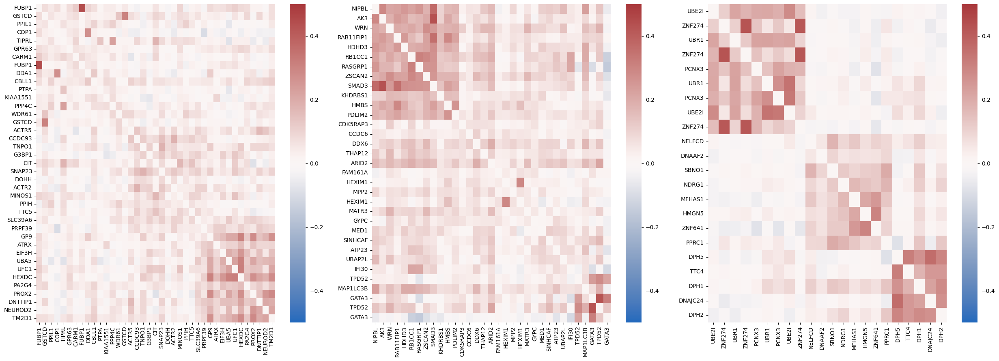

In [226]:
adata_de_temp = adata_de_subset
fig, axes = plt.subplots(1,3,figsize=(25,9))
ax = axes.flatten()
cluster_label = 'leiden'
for i in range(3):
    test = pd.DataFrame(data=np.concatenate([adata_de_temp[adata_de_temp.obs[cluster_label]==3*i].X.toarray(),
                                             adata_de_temp[adata_de_temp.obs[cluster_label]==3*i+1].X.toarray(),
                                             adata_de_temp[adata_de_temp.obs[cluster_label]==3*i+2].X.toarray()]),
                        index=adata_de_temp[adata_de_temp.obs[cluster_label]==3*i].obs.target_contrast_gene_name.values.tolist()+\
                        adata_de_temp[adata_de_temp.obs[cluster_label]==3*i+1].obs.target_contrast_gene_name.values.tolist()+\
                        adata_de_temp[adata_de_temp.obs[cluster_label]==3*i+2].obs.target_contrast_gene_name.values.tolist(),
                        columns=adata_de_temp.var.gene_name)
    test2 = test.T.corr()
    np.fill_diagonal(test2.values, 0)
    sns.heatmap(test2, vmin=-0.5, vmax=0.5, xticklabels=test2.index, yticklabels=test2.columns, cmap='vlag', ax=ax[i])
plt.tight_layout()

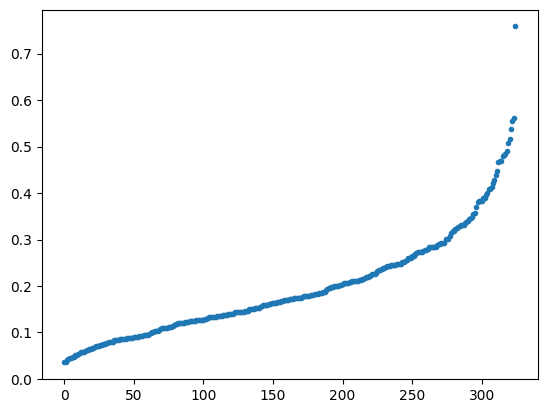

In [572]:
num_of_leiden = len(adata_de_filtered.obs['leiden'].unique())
corr_all = np.zeros(num_of_leiden)
for i in range(len(corr_all)):
    test = pd.DataFrame(data=adata_de_filtered[adata_de_filtered.obs['leiden']==i].X.toarray(),
                        index=adata_de_filtered[adata_de_filtered.obs['leiden']==i].obs.target_contrast_gene_name.values.tolist(),
                        columns=adata_de_filtered.var.gene_name)
    test2 = test.T.corr()
    np.fill_diagonal(test2.values, 0)
    corr_all[i] = np.mean(test2)

plt.plot(np.sort(corr_all), '.')

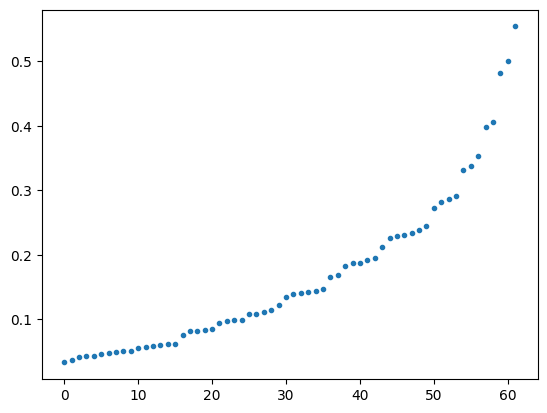

In [181]:
num_of_leiden = len(adata_de_filtered.obs['leiden'].unique())
corr_all = np.zeros(num_of_leiden)
for i in range(len(corr_all)):
    test = pd.DataFrame(data=adata_de_filtered[adata_de_filtered.obs['leiden']==i].X.toarray(),
                        index=adata_de_filtered[adata_de_filtered.obs['leiden']==i].obs.target_contrast_gene_name.values.tolist(),
                        columns=adata_de_filtered.var.gene_name)
    test2 = test.T.corr().values
    np.fill_diagonal(test2, 0)
    corr_all[i] = np.mean(test2)

plt.plot(np.sort(corr_all), '.')

In [ ]:
adata_de_final = adata_de_filtered
fig, axes = plt.subplots(8,3,figsize=(9,24))
ax = axes.flatten()
cluster_label = 'leiden'
for i in range(6):
    test = pd.DataFrame(data=np.concatenate([adata_de_final[adata_de_final.obs[cluster_label]==3*i].X.toarray(),
                                             adata_de_final[adata_de_final.obs[cluster_label]==3*i+1].X.toarray(),
                                             adata_de_final[adata_de_final.obs[cluster_label]==3*i+2].X.toarray()]),
                        index=adata_de_final[adata_de_final.obs[cluster_label]==3*i].obs.target_contrast_gene_name.values.tolist()+\
                        adata_de_final[adata_de_final.obs[cluster_label]==3*i+1].obs.target_contrast_gene_name.values.tolist()+\
                        adata_de_final[adata_de_final.obs[cluster_label]==3*i+2].obs.target_contrast_gene_name.values.tolist(),
                        columns=adata_de_final.var.gene_name)
    test2 = test.T.corr().values
    np.fill_diagonal(test2, 0)
    sns.heatmap(test2, vmin=-0.5, vmax=0.5, cmap='vlag', ax=ax[i])
plt.tight_layout()

In [443]:
i = 2
test = pd.DataFrame(data=np.concatenate([adata_de_final[adata_de_final.obs[cluster_label]==i].X.toarray()]),
                    index=adata_de_final[adata_de_final.obs[cluster_label]==i].obs.target_contrast_gene_name.values.tolist(),
                    columns=adata_de_final.var.gene_name)
test2 = test.T.corr().values
np.fill_diagonal(test2, 0)
np.min(np.max(test2, axis=0))

0.11971385964772228

In [588]:
X_cluster = adata_de_filtered[adata_de_filtered.obs.leiden==69].obsm['X_pca']
lof = LocalOutlierFactor(n_neighbors=5, contamination='auto')
y_pred = lof.fit_predict(X_cluster)
y_pred

In [607]:
adata_de_filtered

AnnData object with n_obs × n_vars = 2727 × 13959
    obs: 'target_contrast_gene_name', 'culture_condition', 'target_contrast', 'chunk', 'n_cells_target', 'leiden'
    var: 'gene_ids', 'gene_name', 'mean', 'std'
    uns: 'pca', 'neighbors', 'leiden'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'p_value', 'zscore'
    obsp: 'distances', 'connectivities'

In [ ]:
fig, axes = plt.subplots(8,3,figsize=(9,24))
ax = axes.flatten()
cluster_label = 'leiden'
for i in range(19):
    test = pd.DataFrame(data=np.concatenate([adata_de_final[adata_de_final.obs[cluster_label]==3*i].X.toarray(),
                                             adata_de_final[adata_de_final.obs[cluster_label]==3*i+1].X.toarray(),
                                             adata_de_final[adata_de_final.obs[cluster_label]==3*i+2].X.toarray()]),
                        index=adata_de_final[adata_de_final.obs[cluster_label]==3*i].obs.target_contrast_gene_name.values.tolist()+\
                        adata_de_final[adata_de_final.obs[cluster_label]==3*i+1].obs.target_contrast_gene_name.values.tolist()+\
                        adata_de_final[adata_de_final.obs[cluster_label]==3*i+2].obs.target_contrast_gene_name.values.tolist(),
                        columns=adata_de_final.var.gene_name)
    test2 = test.T.corr().values
    np.fill_diagonal(test2, 0)
plt.tight_layout()

In [652]:
corum = pd.read_csv('../../../RZAnalysisCodes/results/CORUM/corum_humanComplexes.txt', delimiter='\t', index_col='complex_id')
stringdb = pd.read_csv('../../../RZAnalysisCodes/results/STRINGDB/9606.clusters.proteins.v12.0.txt.gz', delimiter='\t', compression='gzip')
protein_info = pd.read_csv('../../../RZAnalysisCodes/results/STRINGDB/9606.protein.info.v12.0.txt.gz', delimiter='\t', compression='gzip')
cluster_info = pd.read_csv('../../../RZAnalysisCodes/results/STRINGDB/9606.clusters.info.v12.0.txt.gz', delimiter='\t', compression='gzip')
stringdb_df = pd.merge(stringdb, protein_info, left_on='protein_id', right_on='#string_protein_id')
stringdb_df = pd.merge(stringdb_df, cluster_info, left_on='cluster_id', right_on='cluster_id')

corum_complexes = {}
for _, row in corum.iterrows():
    complex_name = row['complex_name']
    subunits = set(row['subunits_gene_name'].split(';'))
    corum_complexes[complex_name] = subunits

stringdb_complexes = {}
for cluster_id in stringdb_df.cluster_id.unique():
    stringdb_complexes[cluster_id] = set(stringdb_df[stringdb_df.cluster_id==cluster_id].preferred_name)

In [658]:
cluster_info

,#string_taxon_id,cluster_id,cluster_size,best_described_by
0,9606,CL:39184,7,"mixed, incl. Protein FAM81, and Bacterial Ig-l..."
1,9606,CL:39182,13,"mostly uncharacterized, incl. Protein FAM81, a..."
2,9606,CL:39156,26,"mostly uncharacterized, incl. Mesothelin, and ..."
3,9606,CL:34,19587,Cellular_component
4,9606,CL:30,19592,Cellular_component
...,...,...,...,...
4853,9606,CL:232,8,"mixed, incl. Diamond-Blackfan anemia, and Ribo..."
4854,9606,CL:168,40,Cytoplasmic ribosomal proteins
4855,9606,CL:217,8,"mixed, incl. Ubiquitin ligase inhibitor activi..."
4856,9606,CL:169,32,Cytoplasmic ribosomal proteins


In [671]:
set(stringdb_df[stringdb_df.cluster_id==stringdb_df.cluster_id.unique()[0]].preferred_name)

{'C1orf185', 'C9orf153', 'FAM81A', 'MAGEB5', 'NUP210L', 'OR52B2', 'TMEM269'}

In [674]:
len(stringdb_complexes)

4858

In [616]:
adata_de_filtered

AnnData object with n_obs × n_vars = 2727 × 13959
    obs: 'target_contrast_gene_name', 'culture_condition', 'target_contrast', 'chunk', 'n_cells_target', 'leiden'
    var: 'gene_ids', 'gene_name', 'mean', 'std'
    uns: 'pca', 'neighbors', 'leiden'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'p_value', 'zscore'
    obsp: 'distances', 'connectivities'

In [817]:
de_genes_per_cluster = {}
leiden_clusters = adata_de_filtered.obs['leiden'].unique()
for cluster in leiden_clusters:
    cluster_genes = adata_de_filtered[adata_de_filtered.obs['leiden'] == cluster].obs.target_contrast_gene_name
    de_genes_per_cluster[cluster] = set(cluster_genes)

In [818]:
total_genes_in_dataset = set(adata_de_filtered.obs.target_contrast_gene_name.unique().tolist()) # Simplified for this example
N = len(total_genes_in_dataset)

In [639]:
# --- Step 2: Perform Enrichment Analysis ---
results = []
for cluster, de_genes in de_genes_per_cluster.items():
    n = len(de_genes)
    for complex_name, subunits in corum_complexes.items():
        K = len(subunits)
        # Find the overlap between DE genes and complex subunits
        overlap = de_genes.intersection(subunits)
        k = len(overlap)
        
        # Calculate the p-value
        if n > 0 and K > 0: # Avoid division by zero or trivial cases
            pval = hypergeom.sf(k - 1, N, K, n) # sf is survival function
            
            # Adjust for multiple testing (e.g., using Benjamini-Hochberg)
            # This is a crucial step to avoid false positives
            # Store raw p-values and correct later
            results.append({
                'cluster': cluster,
                'complex': complex_name,
                'overlap_genes': list(overlap),
                'p_value': pval
            })

# Convert results to a DataFrame for easy viewing
results_df = pd.DataFrame(results)

In [855]:
# --- Step 2: Perform Enrichment Analysis ---
results = []
for cluster, de_genes in de_genes_per_cluster.items():
    n = len(de_genes)
    for complex_name, subunits in stringdb_complexes.items():
        K = len(subunits)
        # Find the overlap between DE genes and complex subunits
        overlap = de_genes.intersection(subunits)
        k = len(overlap)
        
        # Calculate the p-value
        if n > 0 and K > 0: # Avoid division by zero or trivial cases
            pval = hypergeom.sf(k - 1, N, K, n) # sf is survival function
            
            # Adjust for multiple testing (e.g., using Benjamini-Hochberg)
            # This is a crucial step to avoid false positives
            # Store raw p-values and correct later
            results.append({
                'cluster': cluster,
                'complex': complex_name,
                'leiden_size': n,
                'overlap_genes': list(overlap),
                'overlap_fraction': len(overlap)/n,
                'p_value': pval
            })

# Convert results to a DataFrame for easy viewing
results_df = pd.DataFrame(results)

In [856]:
results_df = pd.merge(results_df, cluster_info, left_on='complex', right_on='cluster_id')

In [857]:
len(results_df[results_df.p_value<1e-6].cluster.unique())/max(results_df.cluster)

0.1717171717171717

In [858]:
np.sort(results_df[results_df.p_value<1e-6].cluster.unique())

array([  8,   9,  23,  24,  28,  32,  37,  58,  63,  66,  75,  79,  81,
        83,  85,  90,  94, 107, 134, 139, 143, 166, 169, 172, 177, 178,
       181, 182, 183, 186, 189, 194, 196, 197])

In [874]:
results_df[(results_df.cluster==94)&(results_df.p_value<1e-5)]

,cluster,complex,leiden_size,overlap_genes,overlap_fraction,p_value,#string_taxon_id,cluster_id,cluster_size,best_described_by
684068,94,CL:7611,32,"[DPH5, DPH1, DPH2, ELP6, DNAJC24, DPH6]",0.18750,4.986395e-06,9606,CL:7611,51,"mixed, incl. tRNA wobble uridine modification,..."
684074,94,CL:7612,32,"[DPH5, DPH1, DPH2, ELP6, DNAJC24, DPH6]",0.18750,4.984002e-07,9606,CL:7612,35,"mixed, incl. tRNA wobble uridine modification,..."
684076,94,CL:7638,32,"[DPH6, DPH5, DPH1, DPH2]",0.12500,2.935099e-08,9606,CL:7638,5,Peptidyl-diphthamide metabolic process
684077,94,CL:7613,32,"[DPH5, DPH1, DPH2, ELP6, DPH6]",0.15625,5.055471e-07,9606,CL:7613,19,"tRNA wobble uridine modification, and Peptidyl..."


In [784]:
results_df[results_df.p_value<1e-2]

,cluster,complex,overlap_genes,p_value,#string_taxon_id,cluster_id,cluster_size,best_described_by
2728,67,CL:17325,"[ITK, LCP2, LAT, ZAP70, VAV1, PLCG1]",6.386641e-03,9606,CL:17325,171,"mixed, incl. Constitutive Signaling by Aberran..."
2731,67,CL:17326,"[ITK, LCP2, LAT, ZAP70, VAV1, PLCG1]",5.209611e-03,9606,CL:17326,164,"mixed, incl. Constitutive Signaling by Aberran..."
2734,67,CL:17327,"[ITK, LCP2, LAT, ZAP70, VAV1, PLCG1]",3.817666e-03,9606,CL:17327,154,"mixed, incl. Constitutive Signaling by Aberran..."
2737,67,CL:17561,"[ITK, LCP2]",9.654843e-04,9606,CL:17561,5,"Vav, PH domain, and TCR signalosome"
2738,67,CL:17540,"[ITK, VAV1, LCP2]",4.781487e-04,9606,CL:17540,16,"FCERI mediated Ca+2 mobilization, and B-cell a..."
...,...,...,...,...,...,...,...,...
367464,74,CL:14569,"[LAMTOR4, WDR24, RRAGA, LAMTOR2, LAMTOR3, RRAG...",6.014639e-12,9606,CL:14569,28,Amino acids regulate mTORC1
367465,74,CL:14601,"[LAMTOR2, RRAGA]",1.723585e-04,9606,CL:14601,5,"Ragulator complex, and RagA/B"
367467,74,CL:14571,"[WDR59, WDR24]",1.317831e-03,9606,CL:14571,13,"Seh1-associated complex, and KICSTOR complex"
371682,76,CL:19771,[MMP9],8.600868e-03,9606,CL:19771,5,Cellular response to UV-A


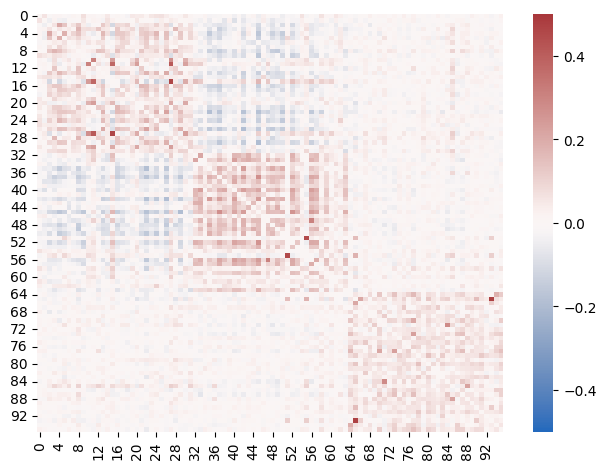

In [878]:
fig, ax = plt.subplots()
cluster_label = 'leiden'
i = 94
test = pd.DataFrame(data=np.concatenate([adata_de_final[adata_de_final.obs[cluster_label]==i].X.toarray(),
                                         adata_de_final[adata_de_final.obs[cluster_label]==i+1].X.toarray(),
                                         adata_de_final[adata_de_final.obs[cluster_label]==i+2].X.toarray()]),
                    index=adata_de_final[adata_de_final.obs[cluster_label]==i].obs.target_contrast_gene_name.values.tolist()+\
                    adata_de_final[adata_de_final.obs[cluster_label]==i+1].obs.target_contrast_gene_name.values.tolist()+\
                    adata_de_final[adata_de_final.obs[cluster_label]==i+2].obs.target_contrast_gene_name.values.tolist(),
                    columns=adata_de_final.var.gene_name)
test2 = test.T.corr().values
np.fill_diagonal(test2, 0)
sns.heatmap(test2, vmin=-0.5, vmax=0.5, cmap='vlag', ax=ax)
plt.tight_layout()

In [745]:
found_complexes = []
for complex_name, subunits in corum_complexes.items():
    if 'TSC1' in subunits:
        found_complexes.append(complex_name)

In [746]:
found_complexes

['TSC (TSC1, TSC2, AXIN, GSK3) complex',
 'TBC1D7-TSC1-TSC2 complex',
 'TSC1-TSC2 complex',
 'AKT1-CDC37-CDK4-HSPA1A-HSP90AA1-NR3C1-PPP5C-RAF1-TSC1-TSC2 complex',
 'HSP90AA1-TSC1-TSC2 complex']

In [875]:
adata_de_filtered[adata_de_filtered.obs.leiden==94].obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000138433_Stim48hr,CIR1,Stim48hr,ENSG00000138433,26,275.0,94
ENSG00000179218_Stim48hr,CALR,Stim48hr,ENSG00000179218,29,485.0,94
ENSG00000165752_Stim48hr,STK32C,Stim48hr,ENSG00000165752,68,1686.0,94
ENSG00000129472_Stim48hr,RAB2B,Stim48hr,ENSG00000129472,167,427.0,94
ENSG00000115806_Stim48hr,GORASP2,Stim48hr,ENSG00000115806,168,606.0,94
ENSG00000028116_Stim48hr,VRK2,Stim48hr,ENSG00000028116,171,270.0,94
ENSG00000102181_Stim48hr,CD99L2,Stim48hr,ENSG00000102181,175,470.0,94
ENSG00000028839_Stim48hr,TBPL1,Stim48hr,ENSG00000028839,179,473.0,94
ENSG00000204569_Stim48hr,PPP1R10,Stim48hr,ENSG00000204569,181,101.0,94
ENSG00000112242_Stim48hr,E2F3,Stim48hr,ENSG00000112242,188,555.0,94


In [729]:
adata_de_filtered[adata_de_filtered.obs.leiden==60].obs.target_contrast_gene_name.unique().tolist()

['STX16',
 'CDCA2',
 'COPRS',
 'RNFT1',
 'N6AMT1',
 'ZNF280D',
 'CCR6',
 'UBAC1',
 'PSMB9',
 'CD274',
 'EID2']

In [813]:
adata_de_filtered.obs.leiden.value_counts()

leiden
0      75
1      71
2      69
3      67
4      65
       ..
194    10
195     8
196     6
197     6
198     6
Name: count, Length: 199, dtype: int64

In [ ]:
adata_de_filtered[adata_de_filtered.obs.leiden==39].obs.sort_values(by='target_contrast_gene_name')

In [596]:
adata_de_filtered[adata_de_filtered.obs.leiden==64].obs.sort_values(by='target_contrast_gene_name').target_contrast_gene_name.unique().tolist()

['ALDH18A1',
 'ARPC2',
 'ARPC3',
 'BATF',
 'CRLS1',
 'ELOB',
 'FOXO1',
 'MUM1',
 'OXA1L',
 'PAIP1',
 'PPCS',
 'PTEN',
 'RPTOR',
 'SLC7A11',
 'SSB',
 'TMED10',
 'TRMT61A',
 'VHL',
 'WDR44',
 'WDR59',
 'ZNF644']

In [814]:
adata_de_filtered[adata_de_filtered.obs.target_contrast_gene_name.str.startswith('SMG')].obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000116698_Stim8hr,SMG7,Stim8hr,ENSG00000116698,59,198.0,143
ENSG00000105771_Stim48hr,SMG9,Stim48hr,ENSG00000105771,68,610.0,143
ENSG00000105771_Rest,SMG9,Rest,ENSG00000105771,80,617.0,143
ENSG00000157106_Stim48hr,SMG1,Stim48hr,ENSG00000157106,244,412.0,143
ENSG00000167447_Stim8hr,SMG8,Stim8hr,ENSG00000167447,335,838.0,143
ENSG00000116698_Rest,SMG7,Rest,ENSG00000116698,348,206.0,143
ENSG00000105771_Stim8hr,SMG9,Stim8hr,ENSG00000105771,400,478.0,143
ENSG00000167447_Rest,SMG8,Rest,ENSG00000167447,448,932.0,143
ENSG00000167447_Stim48hr,SMG8,Stim48hr,ENSG00000167447,514,996.0,143
ENSG00000157106_Rest,SMG1,Rest,ENSG00000157106,519,484.0,143


In [815]:
adata_de_filtered[adata_de_filtered.obs.target_contrast_gene_name.str.startswith('TAF')].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000115750_Stim8hr,TAF1B,Stim8hr,ENSG00000115750,470,1283.0,24
ENSG00000115750_Stim48hr,TAF1B,Stim48hr,ENSG00000115750,453,1340.0,108
ENSG00000165632_Stim48hr,TAF3,Stim48hr,ENSG00000165632,122,149.0,4
ENSG00000165632_Rest,TAF3,Rest,ENSG00000165632,241,140.0,97
ENSG00000165632_Stim8hr,TAF3,Stim8hr,ENSG00000165632,305,192.0,16
ENSG00000135801_Stim8hr,TAF5L,Stim8hr,ENSG00000135801,112,174.0,24
ENSG00000135801_Stim48hr,TAF5L,Stim48hr,ENSG00000135801,454,161.0,108
ENSG00000135801_Rest,TAF5L,Rest,ENSG00000135801,365,148.0,79
ENSG00000162227_Rest,TAF6L,Rest,ENSG00000162227,53,871.0,79
ENSG00000162227_Stim8hr,TAF6L,Stim8hr,ENSG00000162227,381,806.0,24


In [816]:
adata_de_filtered[adata_de_filtered.obs.target_contrast_gene_name.str.startswith('MED')].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000125686_Stim8hr,MED1,Stim8hr,ENSG00000125686,67,204.0,24
ENSG00000125686_Rest,MED1,Rest,ENSG00000125686,74,186.0,68
ENSG00000125686_Stim48hr,MED1,Stim48hr,ENSG00000125686,454,142.0,140
ENSG00000184634_Stim48hr,MED12,Stim48hr,ENSG00000184634,552,191.0,108
ENSG00000184634_Rest,MED12,Rest,ENSG00000184634,116,229.0,79
ENSG00000184634_Stim8hr,MED12,Stim8hr,ENSG00000184634,523,219.0,24
ENSG00000108510_Stim8hr,MED13,Stim8hr,ENSG00000108510,10,1232.0,24
ENSG00000108510_Stim48hr,MED13,Stim48hr,ENSG00000108510,55,1501.0,108
ENSG00000108510_Rest,MED13,Rest,ENSG00000108510,302,1162.0,79
ENSG00000123066_Stim48hr,MED13L,Stim48hr,ENSG00000123066,553,150.0,2


In [761]:
adata_de_filtered[adata_de_filtered.obs.target_contrast_gene_name.str.startswith('ELP')].obs.sort_values(by='culture_condition')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000163832_Rest,ELP6,Rest,ENSG00000163832,75,249.0,3
ENSG00000134014_Rest,ELP3,Rest,ENSG00000134014,172,427.0,84
ENSG00000109911_Rest,ELP4,Rest,ENSG00000109911,480,185.0,84
ENSG00000170291_Rest,ELP5,Rest,ENSG00000170291,519,299.0,84
ENSG00000134759_Rest,ELP2,Rest,ENSG00000134759,382,217.0,84
ENSG00000070061_Rest,ELP1,Rest,ENSG00000070061,480,151.0,84
ENSG00000109911_Stim8hr,ELP4,Stim8hr,ENSG00000109911,5,150.0,93
ENSG00000134014_Stim8hr,ELP3,Stim8hr,ENSG00000134014,99,409.0,93
ENSG00000170291_Stim8hr,ELP5,Stim8hr,ENSG00000170291,164,338.0,93
ENSG00000070061_Stim8hr,ELP1,Stim8hr,ENSG00000070061,169,166.0,93


In [537]:
adata_de_filtered[adata_de_filtered.obs.target_contrast_gene_name.str.startswith('COX')].obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000135940_Rest,COX5B,Rest,ENSG00000135940,25,106.0,16
ENSG00000164919_Stim48hr,COX6C,Stim48hr,ENSG00000164919,26,125.0,19
ENSG00000240230_Stim8hr,COX19,Stim8hr,ENSG00000240230,45,228.0,2
ENSG00000127184_Stim8hr,COX7C,Stim8hr,ENSG00000127184,54,307.0,2
ENSG00000138495_Stim8hr,COX17,Stim8hr,ENSG00000138495,67,605.0,2
ENSG00000131143_Stim8hr,COX4I1,Stim8hr,ENSG00000131143,76,131.0,2
ENSG00000178741_Stim8hr,COX5A,Stim8hr,ENSG00000178741,82,128.0,2
ENSG00000138495_Stim48hr,COX17,Stim48hr,ENSG00000138495,121,444.0,19
ENSG00000127184_Stim48hr,COX7C,Stim48hr,ENSG00000127184,123,230.0,19
ENSG00000164919_Stim8hr,COX6C,Stim8hr,ENSG00000164919,173,255.0,2


In [775]:
adata_de_filtered[adata_de_filtered.obs.target_contrast_gene_name.str.startswith('TSC')].obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000196428_Rest,TSC22D2,Rest,ENSG00000196428,40,183.0,19
ENSG00000103197_Rest,TSC2,Rest,ENSG00000103197,142,631.0,39
ENSG00000165699_Rest,TSC1,Rest,ENSG00000165699,325,492.0,39
ENSG00000165699_Stim8hr,TSC1,Stim8hr,ENSG00000165699,440,371.0,45
ENSG00000165699_Stim48hr,TSC1,Stim48hr,ENSG00000165699,462,309.0,10
ENSG00000103197_Stim48hr,TSC2,Stim48hr,ENSG00000103197,548,484.0,63
ENSG00000103197_Stim8hr,TSC2,Stim8hr,ENSG00000103197,583,469.0,45


In [142]:
adata_de_filtered[adata_de_filtered.obs.leiden==70].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000114395_Stim8hr,CYB561D2,Stim8hr,ENSG00000114395,440,926.0,70
ENSG00000165699_Stim8hr,TSC1,Stim8hr,ENSG00000165699,440,371.0,70
ENSG00000103197_Stim8hr,TSC2,Stim8hr,ENSG00000103197,583,469.0,70


In [49]:
adata_de_filtered.obs.leiden

ENSG00000104368_Stim8hr    10
ENSG00000109971_Stim8hr     3
ENSG00000127084_Stim8hr     0
ENSG00000128607_Stim8hr    10
ENSG00000138101_Stim8hr     3
                           ..
ENSG00000157426_Rest        2
ENSG00000160050_Rest        7
ENSG00000162377_Rest       14
ENSG00000162604_Rest        8
ENSG00000166471_Rest        6
Name: leiden, Length: 7339, dtype: category
Categories (20, int64): [0, 1, 2, 3, ..., 16, 17, 18, 19]

### pyMDE then hdbscan

In [217]:
mask = (de_counts.n_total_de_genes>50) & (de_counts.n_cells_target>100)
adata_de_final = adata_de[mask].copy()
adata_de_final.X = np.nan_to_num(adata_de_final.layers['zscore'], 0)
sc.pp.scale(adata_de_final)

In [353]:
embedding = pymde.preserve_neighbors(
    data=adata_de_final.X,
    embedding_dim=20,
    n_neighbors=15,
    repulsive_fraction=15,
).embed(verbose=True)

Aug 14 12:27:49 PM: Fitting a centered embedding into R^20, for a graph with 3661 items and 782757 edges.
Aug 14 12:27:49 PM: `embed` method parameters: eps=1.0e-05, max_iter=300, memory_size=10
Aug 14 12:27:49 PM: iteration 000 | distortion 0.114300 | residual norm 0.000886736 | step length 12114.1 | percent change 3.96982
Aug 14 12:27:51 PM: iteration 030 | distortion 0.084357 | residual norm 0.000147705 | step length 1 | percent change 1.52936
Aug 14 12:27:52 PM: iteration 060 | distortion 0.081802 | residual norm 7.11344e-05 | step length 1 | percent change 0.753835
Aug 14 12:27:54 PM: iteration 090 | distortion 0.081259 | residual norm 2.65825e-05 | step length 1 | percent change 0.260364
Aug 14 12:27:55 PM: iteration 120 | distortion 0.081135 | residual norm 1.78794e-05 | step length 1 | percent change 0.185673
Aug 14 12:27:57 PM: iteration 150 | distortion 0.081100 | residual norm 1.31874e-05 | step length 1 | percent change 0.161337
Aug 14 12:27:58 PM: Converged in 162 iteratio

In [354]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=20, min_samples=20, cluster_selection_method='leaf')
cluster_labels = clusterer.fit_predict(embedding)
adata_de_final.obs['hdbscan'] = cluster_labels
adata_de_final.obs['hdbscan'] = adata_de_final.obs['hdbscan'].astype('category')

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [355]:
np.max(cluster_labels)

30

In [356]:
np.sum(cluster_labels==-1)/len(cluster_labels)

0.5214422288992079

In [341]:
adata_de_final.obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,hdbscan
ENSG00000104368_Stim8hr,PLAT,Stim8hr,ENSG00000104368,0,411.0,22
ENSG00000109971_Stim8hr,HSPA8,Stim8hr,ENSG00000109971,0,210.0,-1
ENSG00000128607_Stim8hr,KLHDC10,Stim8hr,ENSG00000128607,0,1257.0,8
ENSG00000163600_Stim8hr,ICOS,Stim8hr,ENSG00000163600,0,658.0,8
ENSG00000168876_Stim8hr,ANKRD49,Stim8hr,ENSG00000168876,0,228.0,40
...,...,...,...,...,...,...
ENSG00000073584_Rest,SMARCE1,Rest,ENSG00000073584,680,149.0,-1
ENSG00000134323_Rest,MYCN,Rest,ENSG00000134323,680,924.0,28
ENSG00000137265_Rest,MUM1,Rest,ENSG00000137265,680,803.0,-1
ENSG00000157426_Rest,AASDH,Rest,ENSG00000157426,680,651.0,-1


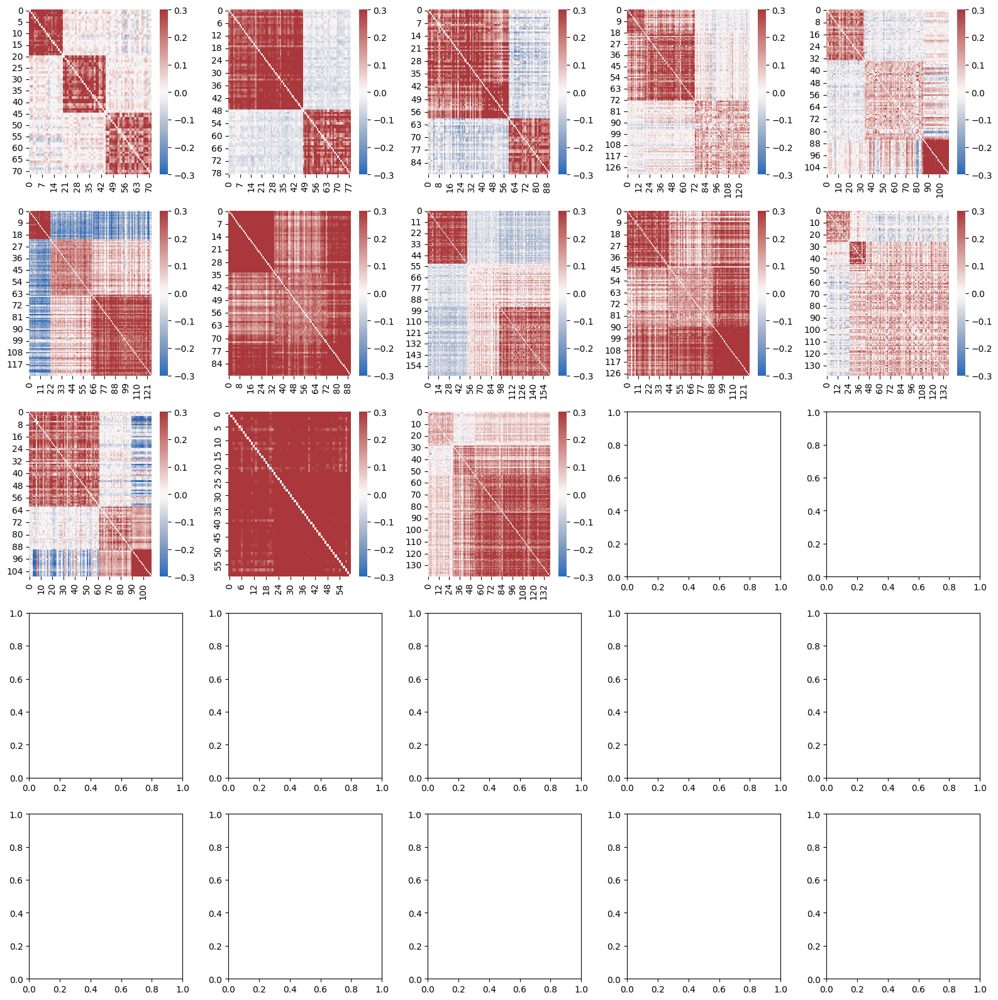

In [323]:
fig, axes = plt.subplots(5,5,figsize=(16,16))
ax = axes.flatten()
cluster_label = 'hdbscan'
for i in range(13):
    test = pd.DataFrame(data=np.concatenate([adata_de_final[adata_de_final.obs[cluster_label]==3*i].X.toarray(),
                                             adata_de_final[adata_de_final.obs[cluster_label]==3*i+1].X.toarray(),
                                             adata_de_final[adata_de_final.obs[cluster_label]==3*i+2].X.toarray()]),
                        index=adata_de_final[adata_de_final.obs[cluster_label]==3*i].obs.target_contrast_gene_name.values.tolist()+\
                        adata_de_final[adata_de_final.obs[cluster_label]==3*i+1].obs.target_contrast_gene_name.values.tolist()+\
                        adata_de_final[adata_de_final.obs[cluster_label]==3*i+2].obs.target_contrast_gene_name.values.tolist(),
                        columns=adata_de_final.var.gene_name)
    test2 = test.T.corr().values
    np.fill_diagonal(test2, 0)
    sns.heatmap(test2, vmin=-0.3, vmax=0.3, cmap='vlag', ax=ax[i])
plt.tight_layout()

In [342]:
adata_de_final[adata_de_final.obs.target_contrast_gene_name.str.startswith('TAF')].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,hdbscan
ENSG00000135801_Stim8hr,TAF5L,Stim8hr,ENSG00000135801,112,174.0,6
ENSG00000135801_Rest,TAF5L,Rest,ENSG00000135801,365,148.0,5
ENSG00000135801_Stim48hr,TAF5L,Stim48hr,ENSG00000135801,454,161.0,4
ENSG00000162227_Rest,TAF6L,Rest,ENSG00000162227,53,871.0,5
ENSG00000162227_Stim48hr,TAF6L,Stim48hr,ENSG00000162227,268,672.0,4
ENSG00000162227_Stim8hr,TAF6L,Stim8hr,ENSG00000162227,381,806.0,6
ENSG00000064995_Rest,TAF11,Rest,ENSG00000064995,264,1388.0,-1
ENSG00000064995_Stim8hr,TAF11,Stim8hr,ENSG00000064995,479,1067.0,-1
ENSG00000064995_Stim48hr,TAF11,Stim48hr,ENSG00000064995,491,863.0,-1
ENSG00000197780_Rest,TAF13,Rest,ENSG00000197780,417,671.0,-1


In [319]:
adata_de_final[adata_de_final.obs.target_contrast_gene_name.str.startswith('SMG')].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,hdbscan
ENSG00000157106_Stim48hr,SMG1,Stim48hr,ENSG00000157106,244,412.0,1
ENSG00000157106_Rest,SMG1,Rest,ENSG00000157106,519,484.0,1
ENSG00000157106_Stim8hr,SMG1,Stim8hr,ENSG00000157106,669,454.0,1
ENSG00000116698_Stim8hr,SMG7,Stim8hr,ENSG00000116698,59,198.0,1
ENSG00000116698_Rest,SMG7,Rest,ENSG00000116698,348,206.0,1
ENSG00000116698_Stim48hr,SMG7,Stim48hr,ENSG00000116698,671,176.0,1
ENSG00000167447_Stim8hr,SMG8,Stim8hr,ENSG00000167447,335,838.0,1
ENSG00000167447_Rest,SMG8,Rest,ENSG00000167447,448,932.0,1
ENSG00000167447_Stim48hr,SMG8,Stim48hr,ENSG00000167447,514,996.0,1
ENSG00000105771_Stim48hr,SMG9,Stim48hr,ENSG00000105771,68,610.0,1


In [322]:
adata_de_final[adata_de_final.obs.hdbscan==7].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,hdbscan
ENSG00000250151_Rest,ARPC4-TTLL3,Rest,ENSG00000250151,42,1523.0,7
ENSG00000171316_Rest,CHD7,Rest,ENSG00000171316,114,697.0,7
ENSG00000184634_Rest,MED12,Rest,ENSG00000184634,116,229.0,7
ENSG00000156603_Rest,MED19,Rest,ENSG00000156603,6,877.0,7
ENSG00000124587_Rest,PEX6,Rest,ENSG00000124587,183,523.0,7
ENSG00000000457_Rest,SCYL3,Rest,ENSG00000000457,159,268.0,7
ENSG00000119231_Rest,SENP5,Rest,ENSG00000119231,184,2096.0,7
ENSG00000176476_Rest,SGF29,Rest,ENSG00000176476,250,1087.0,7
ENSG00000163798_Rest,SLC4A1AP,Rest,ENSG00000163798,113,952.0,7
ENSG00000119760_Rest,SUPT7L,Rest,ENSG00000119760,492,2303.0,7


In [241]:
adata_de_final.obs.hdbscan.value_counts()

hdbscan
-1      1314
 137      57
 106      56
 127      53
 98       47
        ... 
 52        5
 111       5
 133       5
 37        5
 48        5
Name: count, Length: 157, dtype: int64

In [ ]:
trans_effects_df_rest = pd.DataFrame(data=adata_de_rest.layers['zscore'],
                                    columns=adata_de_rest.var.gene_name,
                                    index=adata_de_rest.obs.target_contrast_gene_name)
trans_effects_df_rest = trans_effects_df_rest.fillna(0)
correlation_matrix_rest = trans_effects_df_rest.T.corr()

trans_effects_df_stim8hr = pd.DataFrame(data=adata_de_stim8hr.layers['zscore'],
                                        columns=adata_de_stim8hr.var.gene_name,
                                        index=adata_de_stim8hr.obs.target_contrast_gene_name)
trans_effects_df_stim8hr = trans_effects_df_stim8hr.fillna(0)
correlation_matrix_stim8hr = trans_effects_df_stim8hr.T.corr()

trans_effects_df_stim48hr = pd.DataFrame(data=adata_de_stim48hr.layers['zscore'],
                                         columns=adata_de_stim48hr.var.gene_name,
                                         index=adata_de_stim48hr.obs.target_contrast_gene_name)
trans_effects_df_stim48hr = trans_effects_df_stim48hr.fillna(0)
correlation_matrix_stim48hr = trans_effects_df_stim48hr.T.corr()

In [24]:
adata_de_rest_filtered = adata_de_rest[adata_de_rest.obs.target_contrast_gene_name.isin(correlation_matrix_rest[correlation_matrix_rest.max(0)>0.25].index)]
adata_de_stim8hr_filtered = adata_de_stim8hr[adata_de_stim8hr.obs.target_contrast_gene_name.isin(correlation_matrix_stim8hr[correlation_matrix_stim8hr.max(0)>0.25].index)]
adata_de_stim48hr_filtered = adata_de_stim48hr[adata_de_stim48hr.obs.target_contrast_gene_name.isin(correlation_matrix_stim48hr[correlation_matrix_stim48hr.max(0)>0.25].index)]
adata_de_final = ad.concat([adata_de_rest_filtered, adata_de_stim8hr_filtered, adata_de_stim48hr_filtered])
adata_de_final.var = adata_de_rest_filtered.var

In [170]:
trans_effects_df_all = pd.DataFrame(data=adata_de_subset.layers['zscore'],
                                    columns=adata_de_subset.var.gene_name,
                                    index=adata_de_subset.obs.culture_condition.str.cat(
                                        adata_de_subset.obs.target_contrast_gene_name, sep='_', na_rep=''))
trans_effects_df_all = trans_effects_df_all.fillna(0)
correlation_matrix = trans_effects_df_all.T.corr()

<Axes: >

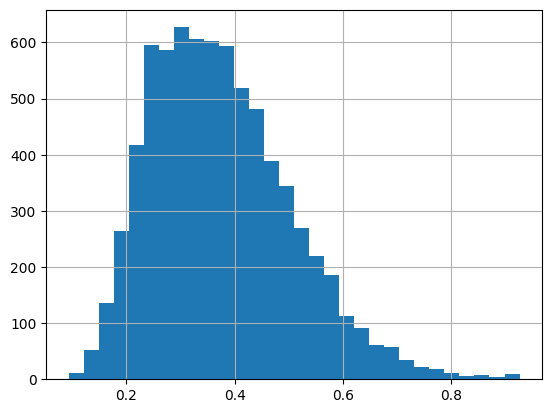

In [171]:
np.fill_diagonal(correlation_matrix_rest.values, 0)
correlation_matrix_rest.max(0).hist(bins=30)

In [35]:
adata_de_filtered = ad.concat([adata_de_rest_filtered, adata_de_stim8hr_filtered, adata_de_stim48hr_filtered])
adata_de_filtered.var = adata_de_rest_filtered.var
adata_de_filtered.X = np.nan_to_num(adata_de_filtered.layers['zscore'], 0)

In [201]:
adata_de_final = adata_de_filtered[adata_de_filtered.obs.culture_condition=='Rest'].copy()
#adata_de_final = adata_de_filtered[(adata_de_filtered.obs.culture_condition=='Rest')&(adata_de_filtered.obs.n_cells_target>500)].copy()
adata_de_final = adata_de_filtered.copy()

In [288]:
#sc.pp.scale(adata_de_final)
embedding = pymde.preserve_neighbors(
    data=adata_de_final.X,
    embedding_dim=3,
    n_neighbors=20,
    repulsive_fraction=7,
).embed(verbose=False)
adata_de_final.obsm['X_mde'] = embedding.numpy()
sc.pp.neighbors(adata_de_final, n_neighbors=7, use_rep='X_mde', metric='cosine')
sc.tl.umap(adata_de_final, min_dist=0.1, init_pos='X_mde')
sc.tl.leiden(adata_de_final, resolution=0.5)
adata_de_final.obs['leiden'] = adata_de_final.obs['leiden'].astype(int)
adata_de_final.obs['leiden'] = adata_de_final.obs['leiden'].astype('category')

In [160]:
# embedding = pymde.preserve_neighbors(
#     data=adata_de_final.X,
#     embedding_dim=10,
#     n_neighbors=10,
#     repulsive_fraction=3,
# ).embed(verbose=False)
# clusterer = hdbscan.HDBSCAN(min_cluster_size=5, min_samples=2)
# cluster_labels = clusterer.fit_predict(embedding)
# adata_de_final.uns['hdbscan_colors'] = []
# adata_de_final.obs['hdbscan'] = cluster_labels
# adata_de_final.obs['hdbscan'] = adata_de_final.obs['hdbscan'].astype('category')

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


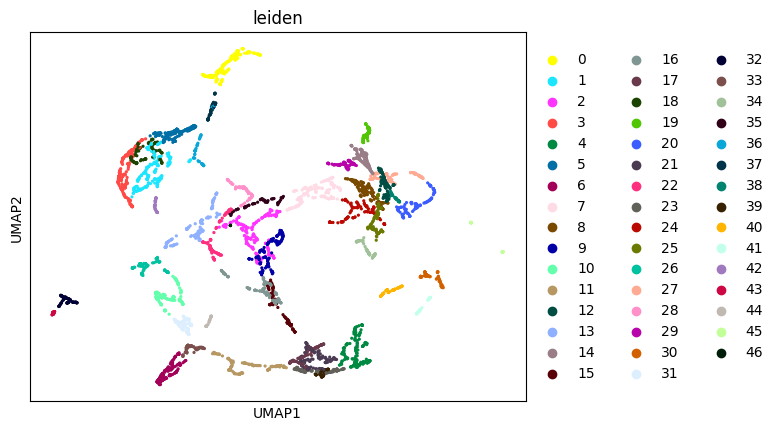

In [289]:
adata_de_final.uns['leiden_colors'] = []
sc.pl.umap(adata_de_final, color=['leiden'])
#sc.pl.umap(adata_de_final, color=['hdbscan'])

In [ ]:
fig, axes = plt.subplots(10,3,figsize=(9,30))
ax = axes.flatten()
cluster_label = 'leiden'
for i in range(30):
    test = pd.DataFrame(data=np.concatenate([adata_de_final[adata_de_final.obs[cluster_label]==3*i].X.toarray(),
                                             adata_de_final[adata_de_final.obs[cluster_label]==3*i+1].X.toarray(),
                                             adata_de_final[adata_de_final.obs[cluster_label]==3*i+2].X.toarray()]),
                        index=adata_de_final[adata_de_final.obs[cluster_label]==3*i].obs.target_contrast_gene_name.values.tolist()+\
                        adata_de_final[adata_de_final.obs[cluster_label]==3*i+1].obs.target_contrast_gene_name.values.tolist()+\
                        adata_de_final[adata_de_final.obs[cluster_label]==3*i+2].obs.target_contrast_gene_name.values.tolist(),
                        columns=adata_de_final.var.gene_name)
    test2 = test.T.corr().values
    np.fill_diagonal(test2, 0)
    sns.heatmap(test2, vmin=0, ax=ax[i])
plt.tight_layout()

In [ ]:
fig, axes = plt.subplots(6,3,figsize=(9,18))
ax = axes.flatten()
for i in range(16):
    test = pd.DataFrame(data=np.concatenate([adata_de_final[adata_de_final.obs.leiden==str(3*i)].X.toarray(),
                                             adata_de_final[adata_de_final.obs.leiden==str(3*i+1)].X.toarray(),
                                             adata_de_final[adata_de_final.obs.leiden==str(3*i+2)].X.toarray()]),
                        index=adata_de_final[adata_de_final.obs.leiden==str(3*i)].obs.target_contrast_gene_name.values.tolist()+\
                        adata_de_final[adata_de_final.obs.leiden==str(3*i+1)].obs.target_contrast_gene_name.values.tolist()+\
                        adata_de_final[adata_de_final.obs.leiden==str(3*i+2)].obs.target_contrast_gene_name.values.tolist(),
                        columns=adata_de_final.var.gene_name)
    test2 = test.T.corr().values
    np.fill_diagonal(test2, 0)
    sns.heatmap(test2, vmin=0, ax=ax[i])
plt.tight_layout()

In [220]:
test_output = pd.DataFrame({'gene': adata_de_final.obs.target_contrast_gene_name.values,
                            'functional_group': adata_de_final.obs.leiden.values})

In [225]:
test_output.to_csv('results/rest_functional_group.csv')

In [290]:
adata_de_final[adata_de_final.obs.target_contrast_gene_name.str.startswith('TAF')].obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000162227_Rest,TAF6L,Rest,ENSG00000162227,53,871.0,32
ENSG00000064995_Rest,TAF11,Rest,ENSG00000064995,264,1388.0,2
ENSG00000135801_Rest,TAF5L,Rest,ENSG00000135801,365,148.0,32
ENSG00000197780_Rest,TAF13,Rest,ENSG00000197780,417,671.0,2
ENSG00000135801_Stim8hr,TAF5L,Stim8hr,ENSG00000135801,112,174.0,32
ENSG00000165632_Stim8hr,TAF3,Stim8hr,ENSG00000165632,305,192.0,35
ENSG00000162227_Stim8hr,TAF6L,Stim8hr,ENSG00000162227,381,806.0,32
ENSG00000115750_Stim8hr,TAF1B,Stim8hr,ENSG00000115750,470,1283.0,32
ENSG00000064995_Stim8hr,TAF11,Stim8hr,ENSG00000064995,479,1067.0,29
ENSG00000197780_Stim8hr,TAF13,Stim8hr,ENSG00000197780,626,533.0,32


In [291]:
adata_de_final[adata_de_final.obs.target_contrast_gene_name.str.startswith('MED')].obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000156603_Rest,MED19,Rest,ENSG00000156603,6,877.0,32
ENSG00000125686_Rest,MED1,Rest,ENSG00000125686,74,186.0,32
ENSG00000008838_Rest,MED24,Rest,ENSG00000008838,116,755.0,2
ENSG00000184634_Rest,MED12,Rest,ENSG00000184634,116,229.0,32
ENSG00000108510_Rest,MED13,Rest,ENSG00000108510,302,1162.0,32
ENSG00000099917_Rest,MED15,Rest,ENSG00000099917,448,1294.0,2
ENSG00000112282_Rest,MED23,Rest,ENSG00000112282,477,729.0,24
ENSG00000180182_Rest,MED14,Rest,ENSG00000180182,652,237.0,32
ENSG00000108510_Stim8hr,MED13,Stim8hr,ENSG00000108510,10,1232.0,32
ENSG00000125686_Stim8hr,MED1,Stim8hr,ENSG00000125686,67,204.0,32


In [294]:
adata_de_final[adata_de_final.obs.target_contrast_gene_name.str.startswith('ELP')].obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000163832_Rest,ELP6,Rest,ENSG00000163832,75,249.0,20
ENSG00000134014_Rest,ELP3,Rest,ENSG00000134014,172,427.0,45
ENSG00000134759_Rest,ELP2,Rest,ENSG00000134759,382,217.0,45
ENSG00000070061_Rest,ELP1,Rest,ENSG00000070061,480,151.0,45
ENSG00000109911_Rest,ELP4,Rest,ENSG00000109911,480,185.0,45
ENSG00000170291_Rest,ELP5,Rest,ENSG00000170291,519,299.0,45
ENSG00000109911_Stim8hr,ELP4,Stim8hr,ENSG00000109911,5,150.0,45
ENSG00000134014_Stim8hr,ELP3,Stim8hr,ENSG00000134014,99,409.0,45
ENSG00000170291_Stim8hr,ELP5,Stim8hr,ENSG00000170291,164,338.0,45
ENSG00000070061_Stim8hr,ELP1,Stim8hr,ENSG00000070061,169,166.0,45


In [295]:
adata_de_final[adata_de_final.obs.target_contrast_gene_name.str.startswith('COX')].obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000135940_Rest,COX5B,Rest,ENSG00000135940,25,106.0,4
ENSG00000131143_Rest,COX4I1,Rest,ENSG00000131143,201,145.0,27
ENSG00000203667_Rest,COX20,Rest,ENSG00000203667,377,308.0,7
ENSG00000006695_Rest,COX10,Rest,ENSG00000006695,465,92.0,27
ENSG00000014919_Rest,COX15,Rest,ENSG00000014919,527,646.0,20
ENSG00000164919_Rest,COX6C,Rest,ENSG00000164919,532,251.0,27
ENSG00000126267_Rest,COX6B1,Rest,ENSG00000126267,560,386.0,20
ENSG00000178741_Rest,COX5A,Rest,ENSG00000178741,591,117.0,27
ENSG00000166260_Rest,COX11,Rest,ENSG00000166260,605,150.0,27
ENSG00000240230_Rest,COX19,Rest,ENSG00000240230,670,182.0,27


In [297]:
adata_de_final[adata_de_final.obs.target_contrast_gene_name.str.startswith('MRPL')].obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000149792_Rest,MRPL49,Rest,ENSG00000149792,19,252.0,20
ENSG00000114686_Rest,MRPL3,Rest,ENSG00000114686,30,401.0,20
ENSG00000137547_Rest,MRPL15,Rest,ENSG00000137547,83,252.0,27
ENSG00000174547_Rest,MRPL11,Rest,ENSG00000174547,89,512.0,27
ENSG00000116221_Rest,MRPL37,Rest,ENSG00000116221,94,241.0,20
ENSG00000166902_Rest,MRPL16,Rest,ENSG00000166902,142,197.0,27
ENSG00000162910_Rest,MRPL55,Rest,ENSG00000162910,149,107.0,27
ENSG00000167862_Rest,MRPL58,Rest,ENSG00000167862,151,414.0,7
ENSG00000259494_Rest,MRPL46,Rest,ENSG00000259494,198,216.0,27
ENSG00000197345_Rest,MRPL21,Rest,ENSG00000197345,250,306.0,20


In [292]:
adata_de_final[adata_de_final.obs.target_contrast_gene_name.str.startswith('SMG')].obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000105771_Rest,SMG9,Rest,ENSG00000105771,80,617.0,41
ENSG00000116698_Rest,SMG7,Rest,ENSG00000116698,348,206.0,41
ENSG00000167447_Rest,SMG8,Rest,ENSG00000167447,448,932.0,41
ENSG00000198952_Rest,SMG5,Rest,ENSG00000198952,510,59.0,41
ENSG00000157106_Rest,SMG1,Rest,ENSG00000157106,519,484.0,41
ENSG00000070366_Rest,SMG6,Rest,ENSG00000070366,611,180.0,41
ENSG00000116698_Stim8hr,SMG7,Stim8hr,ENSG00000116698,59,198.0,41
ENSG00000167447_Stim8hr,SMG8,Stim8hr,ENSG00000167447,335,838.0,41
ENSG00000105771_Stim8hr,SMG9,Stim8hr,ENSG00000105771,400,478.0,41
ENSG00000070366_Stim8hr,SMG6,Stim8hr,ENSG00000070366,569,153.0,41


In [303]:
adata_de_final[adata_de_final.obs.target_contrast_gene_name=='USP22'].obs

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000124422_Rest,USP22,Rest,ENSG00000124422,217,1653.0,11
ENSG00000124422_Stim8hr,USP22,Stim8hr,ENSG00000124422,46,1371.0,10
ENSG00000124422_Stim48hr,USP22,Stim48hr,ENSG00000124422,181,1260.0,43


In [307]:
adata_de_final[adata_de_final.obs.leiden==32].obs.sort_values(by='target_contrast_gene_name')

,target_contrast_gene_name,culture_condition,target_contrast,chunk,n_cells_target,leiden
ENSG00000154265_Stim8hr,ABCA5,Stim8hr,ENSG00000154265,34,784.0,32
ENSG00000250151_Rest,ARPC4-TTLL3,Rest,ENSG00000250151,42,1523.0,32
ENSG00000250151_Stim8hr,ARPC4-TTLL3,Stim8hr,ENSG00000250151,70,1295.0,32
ENSG00000075790_Stim8hr,BCAP29,Stim8hr,ENSG00000075790,339,509.0,32
ENSG00000112237_Rest,CCNC,Rest,ENSG00000112237,459,3530.0,32
ENSG00000120217_Stim8hr,CD274,Stim8hr,ENSG00000120217,258,1490.0,32
ENSG00000120217_Rest,CD274,Rest,ENSG00000120217,617,1432.0,32
ENSG00000184661_Rest,CDCA2,Rest,ENSG00000184661,84,545.0,32
ENSG00000184661_Stim8hr,CDCA2,Stim8hr,ENSG00000184661,120,510.0,32
ENSG00000171316_Rest,CHD7,Rest,ENSG00000171316,114,697.0,32


In [902]:
adata_de_final[adata_de_final.obs.leiden=='22'].obs.target_contrast_gene_name.tolist()

['VARS2',
 'TARS2',
 'MRPS11',
 'EARS2',
 'MRPL37',
 'MRPS26',
 'MRPS25',
 'MRPL21',
 'MRPS9',
 'MRPL2',
 'RDH13',
 'NSUN4',
 'MIPEP',
 'POLRMT',
 'MRPS27',
 'LARS2',
 'MRPL45',
 'COX6C',
 'MRPS2',
 'PARS2',
 'SSBP1',
 'COX6B1',
 'HSD17B10',
 'SCO1',
 'SCO2',
 'COX11',
 'MRPS16',
 'MRPS24',
 'MRPS35',
 'MYCN']

In [235]:
test_padj.shape

(11416, 1)

In [236]:
test_zscore.shape

(11416, 1)

In [237]:
adata_de.var.gene_name.values.shape

(13959,)

In [238]:
adata_de

AnnData object with n_obs × n_vars = 33986 × 13959
    obs: 'target_contrast_gene_name', 'culture_condition', 'target_contrast', 'chunk', 'n_cells_target'
    var: 'gene_ids', 'gene_name'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'p_value', 'zscore'

In [40]:
adata_de[:,adata_de.var.gene_name.str.startswith('IL')].var.gene_name.unique()

array(['IL32', 'IL17RB', 'IL4R', 'IL12RB2', 'IL5RA', 'IL12RB1', 'IL2RB',
       'IL21R', 'IL7', 'IL4I1', 'IL27RA', 'ILVBL', 'IL2', 'IL10RA',
       'IL23A', 'IL26', 'IL17A', 'IL17F', 'IL12B', 'IL4', 'IL5', 'IL1A',
       'IL1R2', 'IL1R1', 'IL1RL1', 'IL18R1', 'IL18RAP', 'IL9R', 'IL1B',
       'IL22', 'IL17B', 'ILF3', 'IL13RA1', 'ILKAP', 'IL6ST', 'IL2RA',
       'IL15RA', 'IL6', 'IL10', 'IL1RN', 'IL36A', 'IL36RN', 'IL36B',
       'IL11RA', 'IL18BP', 'IL21', 'IL19', 'IL22RA1', 'ILDR2', 'ILF2',
       'ILDR1', 'IL9', 'IL2RG', 'IL18', 'IL6R', 'IL23R', 'IL24', 'IL15',
       'IL3', 'IL31RA', 'IL25', 'ILK', 'IL7R', 'IL12A', 'IL13', 'IL16',
       'IL17D', 'IL17RA', 'IL3RA', 'IL17REL', 'IL1RAPL2', 'IL1RAP',
       'ILRUN', 'IL31', 'IL10RB'], dtype=object)

In [19]:
genes = ['IFNG', 'TNF', 'IL2', 'IL4', 'IL5', 'IL13', 'IL17A', 'IL17F',
         'IL9', 'IL10', 'TGFB1', 'IL21', 'IL22', 'IL24', 'IL26', 'IL31']
df_all = pd.DataFrame({},
                     index=adata_de[adata_de.obs.culture_condition=='Stim8hr'].obs.target_contrast_gene_name.values)
for gene in genes:
    adata_temp = adata_de[adata_de.obs.culture_condition=='Stim8hr', adata_de.var.gene_name==gene]
    test_p = adata_temp.layers['p_value'].copy()
    test_padj = adata_temp.layers['adj_p_value'].copy()
    test_zscore = adata_temp.layers['zscore'].copy()
    test_df = pd.DataFrame({gene+'_p': test_p[:,0],
                            gene+'_padj': test_padj[:,0],
                            gene+'_zscore': test_zscore[:,0]},
                           index=adata_temp.obs.target_contrast_gene_name.values)
    df_all = pd.merge(df_all, test_df, left_index=True, right_index=True)

In [21]:
(df_all.loc[:,df_all.columns.str.endswith('_padj')]<0.01).sum(0)

IFNG_padj     84
TNF_padj      60
IL2_padj      87
IL4_padj      13
IL5_padj      73
IL13_padj     63
IL17A_padj     0
IL17F_padj    18
IL9_padj       1
IL10_padj     67
TGFB1_padj    21
IL21_padj     25
IL22_padj     75
IL24_padj     33
IL26_padj     47
IL31_padj     49
dtype: int64

In [22]:
reg_all = df_all.loc[(df_all.loc[:,df_all.columns.str.endswith('_padj')]<0.01).sum(1)!=0]

In [23]:
reg_all.to_csv('../../../RZAnalysisCodes/results/cytokine_regulators_padj1e-2.csv')

In [24]:
df_all.to_csv('../../../RZAnalysisCodes/results/cytokine_regulators_all.csv')

In [61]:
test_df.sort_values(by='padj').head(30)

,p,padj,zscore
SGF29,2.868675e-06,0.000035,-4.680005
CD247,9.796779e-06,0.000066,-4.421611
SMG9,2.822550e-06,0.000218,-4.683327
MED12,4.472887e-05,0.000307,-4.081589
GATA3,5.114709e-06,0.000309,-4.560027
SMG7,1.358023e-05,0.000312,-4.350541
STYXL1,2.307431e-06,0.000388,-4.724446
VAV1,8.598232e-05,0.000398,-3.927083
MBD5,2.236292e-05,0.000431,-4.239890
ZNF286B,2.376898e-07,0.000721,5.167151


In [62]:
test_df.loc['IL5']

p         0.004629
padj      0.999898
zscore   -2.831776
Name: IL5, dtype: float64

In [128]:
trans_effects_df_all = pd.DataFrame(data=adata_de_final.layers['zscore'],
                                columns=adata_de_final.var.gene_name,
                                index=adata_de_final.obs.culture_condition.str.cat(
                                    adata_de_final.obs.target_contrast_gene_name, sep='_', na_rep=''))
trans_effects_df_all = trans_effects_df_all.fillna(0)

In [ ]:
correlation_matrix = trans_effects_df_all.T.corr()
np.fill_diagonal(correlation_matrix.values, 0)
correlation_matrix.max(0).hist(bins=30)

In [ ]:
# Filter by fraction of shared effects and keep top JI pairs
JI_thresh = 0.4

keep_tests = correlation_matrix.max(0) > JI_thresh
correlation_matrix = correlation_matrix.loc[keep_tests, keep_tests]
order_perts = correlation_matrix.sum(0).sort_values(ascending=False).index.tolist()
ordered_data = correlation_matrix.loc[order_perts, order_perts]

# First generate clustermap to get ordering
clustermap = sns.clustermap(
    ordered_data,
    method='ward', metric='euclidean',
    figsize=(25,25), 
    xticklabels=True, yticklabels=True,
    cmap='magma',
    vmax=0.8,
    vmin=0
)

# Get the row and column ordering from the clustermap
row_order = clustermap.dendrogram_row.reordered_ind
col_order = clustermap.dendrogram_col.reordered_ind
reordered_data = ordered_data.iloc[row_order, col_order]

In [174]:
X = trans_effects_df_all.values
# We compute a 2-dimensional spectral embedding for initialization.
spectral_2d_init_np = SpectralEmbedding(n_components=2, n_neighbors=5, eigen_solver='arpack', random_state=42).fit_transform(X)
spectral_2d_init = torch.tensor(spectral_2d_init_np).contiguous()
# We use the same high-level function to create the 2D embedding object.
mde_2d = pymde.preserve_neighbors(
    data=X,
    embedding_dim=2,
    n_neighbors=5,
    repulsive_fraction=7,
).embed(X=spectral_2d_init, eps=1e-06, max_iter=3000, verbose=True)
embedding_np = mde_2d.numpy()

Jul 23 02:38:34 PM: Fitting a centered embedding into R^2, for a graph with 1713 items and 58768 edges.
Jul 23 02:38:34 PM: `embed` method parameters: eps=1.0e-06, max_iter=3000, memory_size=10
Jul 23 02:38:34 PM: iteration 0000 | distortion 6.789090 | residual norm 132.944 | step length 0.000181481 | percent change 3.42361
Jul 23 02:38:36 PM: iteration 0300 | distortion 0.119424 | residual norm 0.00020087 | step length 1 | percent change 0.288748
Jul 23 02:38:38 PM: iteration 0600 | distortion 0.116729 | residual norm 0.000138191 | step length 0.479603 | percent change 1.17813
Jul 23 02:38:40 PM: iteration 0900 | distortion 0.115750 | residual norm 2.43385e-05 | step length 1 | percent change 0.0156082
Jul 23 02:38:41 PM: iteration 1200 | distortion 0.115738 | residual norm 2.00679e-05 | step length 1 | percent change 0.151045
Jul 23 02:38:43 PM: iteration 1500 | distortion 0.115387 | residual norm 3.77906e-05 | step length 1 | percent change 0.0549971
Jul 23 02:38:44 PM: iteration 18

In [220]:
hdbscan_clusterer = hdbscan.HDBSCAN(min_cluster_size=5) # Tune these parameters
hdbscan_labels = hdbscan_clusterer.fit_predict(embedding_np)
hdbscan_labels = np.max(hdbscan_labels) - hdbscan_labels

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/sklearn/utils/deprecation.py:132: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [221]:
pymde_df = pd.DataFrame(data=embedding_np,
                        columns=['pyMDE_1', 'pyMDE_2'],
                        index=trans_effects_df_all.index)

pymde_df['cluster'] = hdbscan_labels
pymde_df['timepoint'] = {}
pymde_df.loc[pymde_df.index.str.startswith('Rest_'),'timepoint'] = 'Rest'
pymde_df.loc[pymde_df.index.str.startswith('Stim48hr_'),'timepoint'] = 'Stim48hr'

In [217]:
test = pymde_df.iloc[np.random.permutation(1423)]

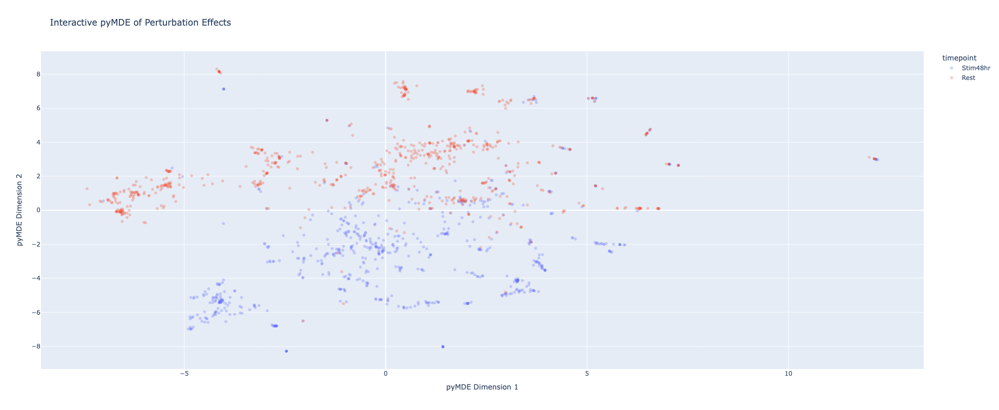

In [273]:
# 4. Visualize with Plotly Express for interactivity ✨
fig = px.scatter(
    test,
    x='pyMDE_1',
    y='pyMDE_2',
    color='timepoint',
    hover_name=test.index, 
    title='Interactive pyMDE of Perturbation Effects',
    width=800,
    height=800,
    opacity=0.3,
)

# Update layout for a cleaner look
fig.update_layout(
    xaxis_title="pyMDE Dimension 1",
    yaxis_title="pyMDE Dimension 2"
)

# Show the interactive plot
fig.show()

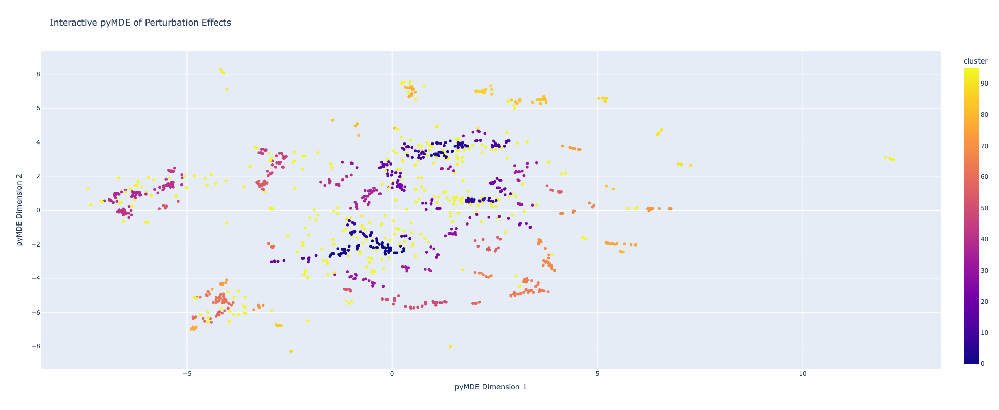

In [206]:
# 4. Visualize with Plotly Express for interactivity ✨
fig = px.scatter(
    test,
    x='pyMDE_1',
    y='pyMDE_2',
    color='cluster',
    hover_name=test.index, 
    title='Interactive pyMDE of Perturbation Effects',
    width=800,
    height=800,
    opacity=1,
)

# Update layout for a cleaner look
fig.update_layout(
    xaxis_title="pyMDE Dimension 1",
    yaxis_title="pyMDE Dimension 2"
)

# Show the interactive plot
fig.show()

In [ ]:
pymde_df.loc['Stim48hr_ELP4']

In [76]:
gene_test = ['TAF6L', 'TADA1', 'CHD7', 'SGF29', 'SUPT20H', 'SENP5', 'MED12', 'MED19', 'CCNC']
'Rest_CD3G', 'Rest_PLCG1', 'Rest_PTPRC', 'Rest_HELT', 'Rest_CD28',
       'Rest_MALT1', 'Rest_TMX1', 'Rest_VAV1', 'Rest_BCL10', 'Rest_ANKRD61',
       'Rest_ITK', 'Rest_CARMIL2', 'Rest_LAT'
gene_test_rest = ['Rest_' + gene for gene in gene_test]
gene_test_stim48hr = ['Stim48hr_' + gene for gene in gene_test]
gene_to_choose = gene_test_rest + gene_test_stim48hr
corr_subset = correlation_matrix.loc[gene_to_choose, gene_to_choose]
np.fill_diagonal(corr_subset.values, 1)

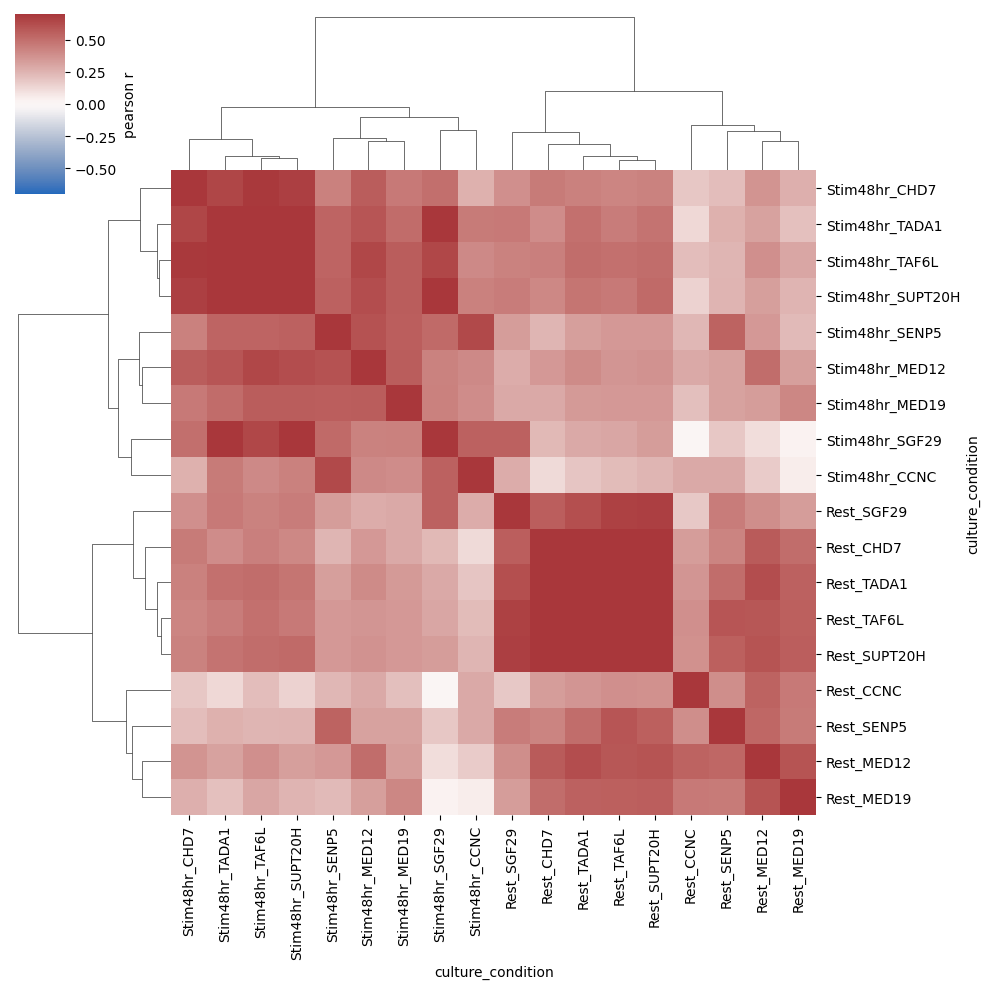

In [77]:
sns.clustermap(
    corr_subset,
    method='ward', metric='euclidean',
    figsize=(10,10), 
    xticklabels=True, yticklabels=True,
    cmap='vlag',
    vmax=0.7,
    vmin=-0.7,
    cbar_kws={'label': 'pearson r'}
)
plt.savefig('results/CD4i_rest_vs_stim48hr_MDE_exp_clusters2.png')

In [104]:
'Rest_' + correlation_matrix.loc[hdbscan_labels==4].index.str[9:]

Index(['Rest_CD3G', 'Rest_PLCG1', 'Rest_PTPRC', 'Rest_HELT', 'Rest_CD28',
       'Rest_MALT1', 'Rest_TMX1', 'Rest_VAV1', 'Rest_BCL10', 'Rest_ANKRD61',
       'Rest_ITK', 'Rest_CARMIL2', 'Rest_LAT'],
      dtype='object', name='culture_condition')

In [219]:
correlation_matrix.loc[hdbscan_labels==84].index

Index(['Stim48hr_MED14', 'Rest_ARMH3', 'Rest_ECHS1', 'Rest_MED19',
       'Stim48hr_KIAA0391', 'Stim48hr_ZFC3H1', 'Stim48hr_EDC3',
       'Stim48hr_GIGYF2', 'Rest_GNPDA2', 'Rest_NCBP3',
       ...
       'Stim48hr_GNE', 'Rest_ZBTB7A', 'Rest_CAP1', 'Rest_UBXN1', 'Rest_TIMM10',
       'Rest_UBR4', 'Stim48hr_UBR4', 'Stim48hr_HDAC3', 'Rest_SMARCE1',
       'Rest_MUM1'],
      dtype='object', name='culture_condition', length=411)

In [258]:
cluster_to_choose = [70, 76, 93]
gene_to_choose = []
for i in cluster_to_choose:
    gene_to_choose = gene_to_choose + list(correlation_matrix.loc[hdbscan_labels==i].index)
#gene_to_choose = gene_to_choose + list('Rest_' + correlation_matrix.loc[hdbscan_labels==35].index.str[9:])
corr_subset = correlation_matrix.loc[gene_to_choose, gene_to_choose]
np.fill_diagonal(corr_subset.values, 1)

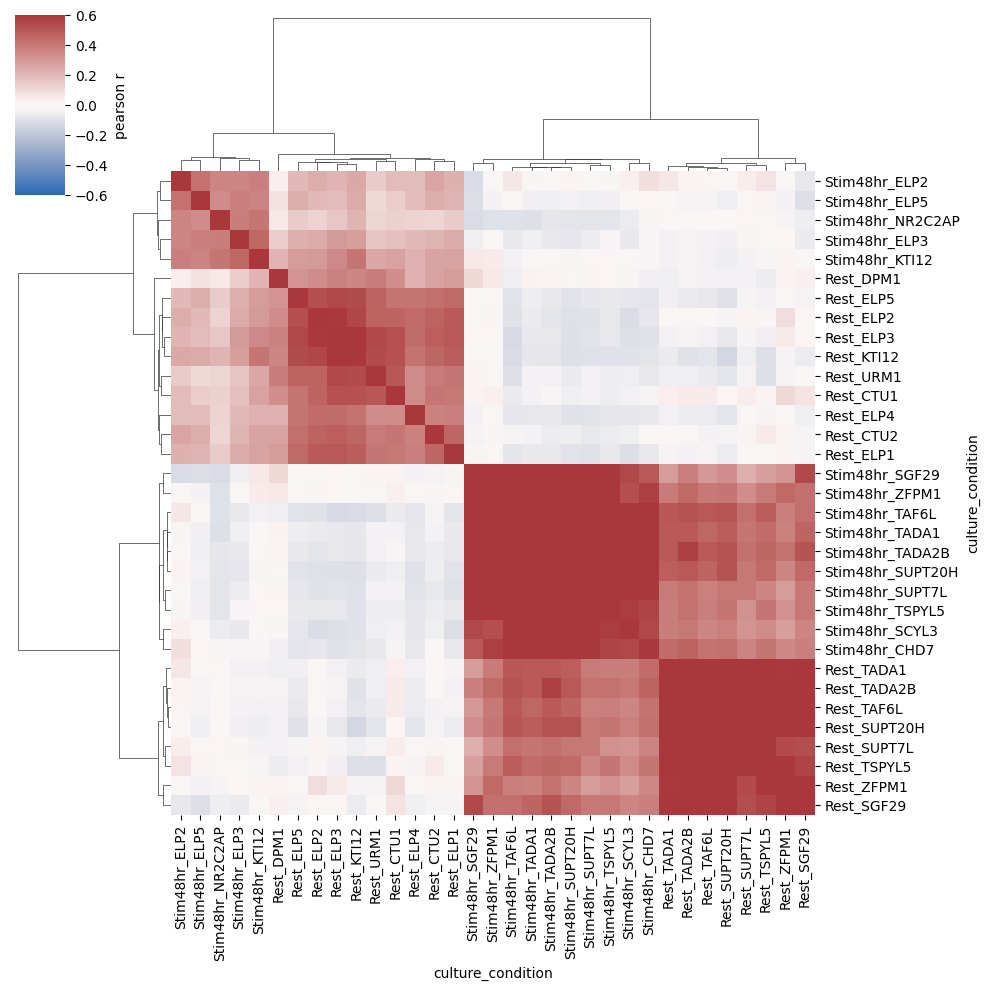

In [259]:
sns.clustermap(
    corr_subset,
    method='ward', metric='euclidean',
    figsize=(10,10), 
    xticklabels=True, yticklabels=True,
    cmap='vlag',
    vmax=0.6,
    vmin=-0.6,
    cbar_kws={'label': 'pearson r'}
)
plt.savefig('results/CD4i_rest_vs_stim48hr_MDE_exp_clusters2.png')

In [268]:
cluster_to_choose = [34, 35]
gene_to_choose = []
for i in cluster_to_choose:
    gene_to_choose = gene_to_choose + list(correlation_matrix.loc[hdbscan_labels==i].index)
gene_to_choose = gene_to_choose + list('Rest_' + correlation_matrix.loc[hdbscan_labels==34].index.str[9:])
gene_to_choose = gene_to_choose + list('Rest_' + correlation_matrix.loc[hdbscan_labels==35].index.str[9:])
gene_to_choose.remove('Rest_FLCN')
corr_subset = correlation_matrix.loc[gene_to_choose, gene_to_choose]
np.fill_diagonal(corr_subset.values, 1)

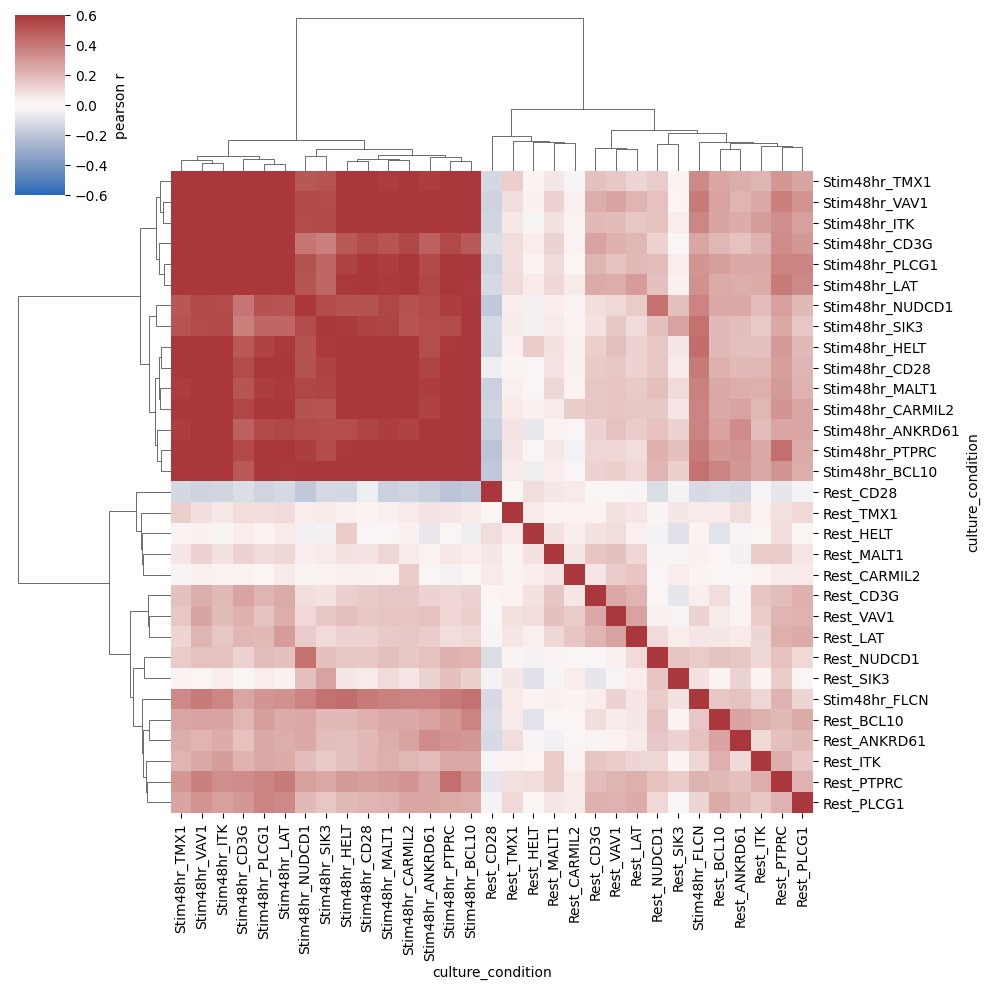

In [270]:
sns.clustermap(
    corr_subset,
    method='ward', metric='euclidean',
    figsize=(10,10), 
    xticklabels=True, yticklabels=True,
    cmap='vlag',
    vmax=0.6,
    vmin=-0.6,
    cbar_kws={'label': 'pearson r'}
)
plt.savefig('results/CD4i_rest_vs_stim48hr_MDE_exp_clusters3.png')

In [271]:
cluster_to_choose = [91, 94]
gene_to_choose = []
for i in cluster_to_choose:
    gene_to_choose = gene_to_choose + list(correlation_matrix.loc[hdbscan_labels==i].index)
corr_subset = correlation_matrix.loc[gene_to_choose, gene_to_choose]
np.fill_diagonal(corr_subset.values, 1)

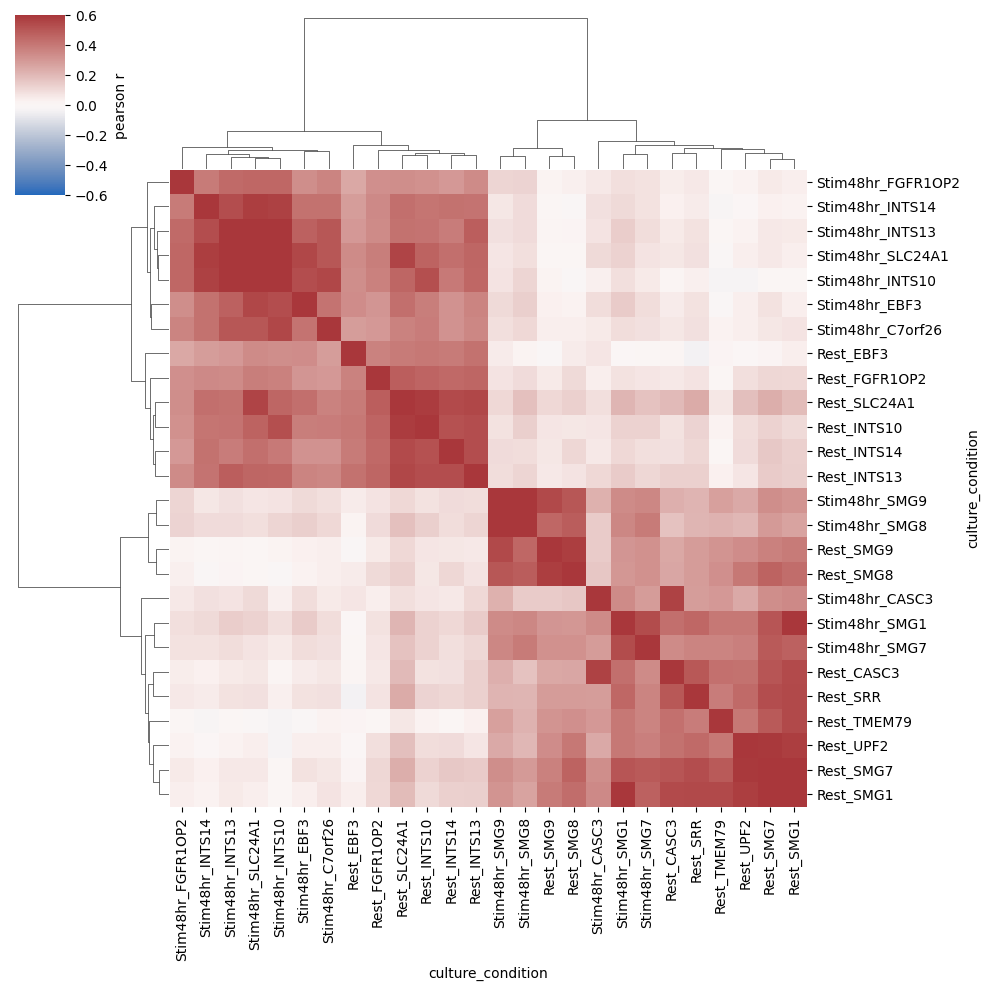

In [272]:
sns.clustermap(
    corr_subset,
    method='ward', metric='euclidean',
    figsize=(10,10), 
    xticklabels=True, yticklabels=True,
    cmap='vlag',
    vmax=0.6,
    vmin=-0.6,
    cbar_kws={'label': 'pearson r'}
)
plt.savefig('results/CD4i_rest_vs_stim48hr_MDE_exp_clusters.png')

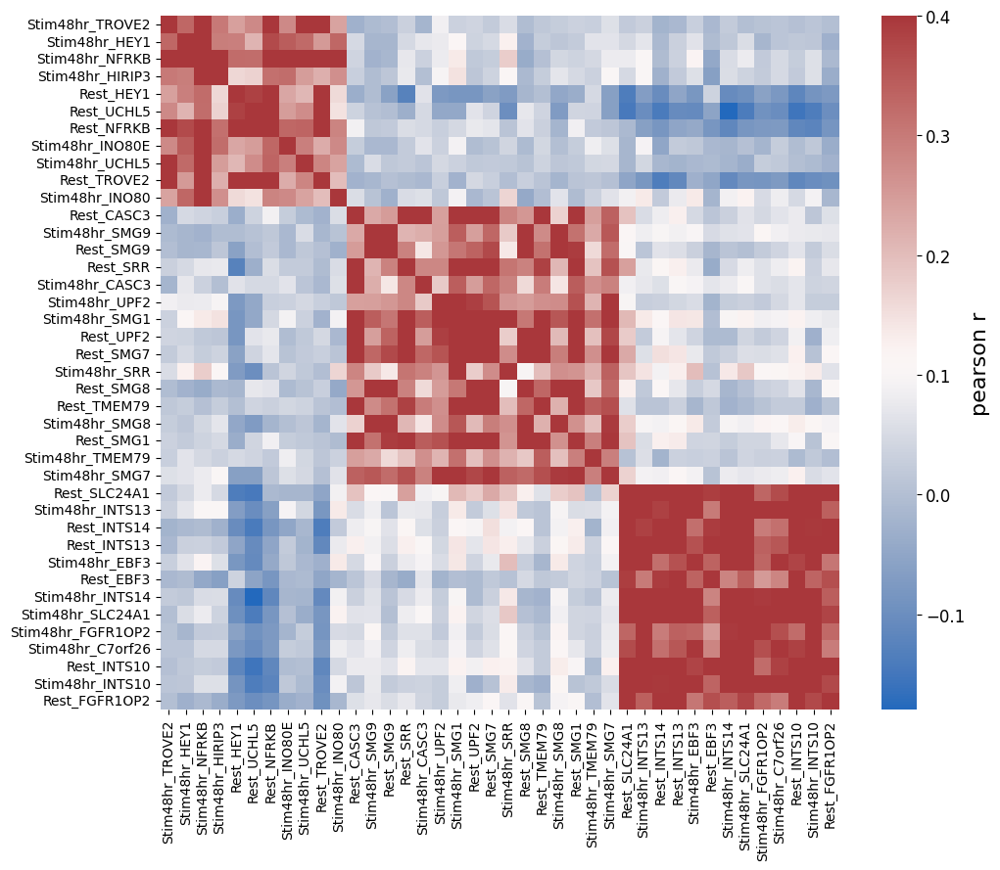

In [34]:
fig, ax = plt.subplots(figsize=(10.5,9))
sns.heatmap(corr_subset, cmap='vlag', vmax=0.4, ax=ax)
ax.set_xlabel('')
ax.set_ylabel('')
cbar = ax.collections[0].colorbar
cbar.ax.set_ylabel("pearson r", fontsize=16)
cbar.ax.tick_params(labelsize=12)
plt.tight_layout()
#plt.savefig('results/CD4i_rest_vs_stim48hr_MDE_exp_clusters.png')

In [96]:
pymde_df[pymde_df.index=='Stim48hr_ELP1']

,pyMDE_1,pyMDE_2,cluster,timepoint
target_contrast_gene_name,,,,


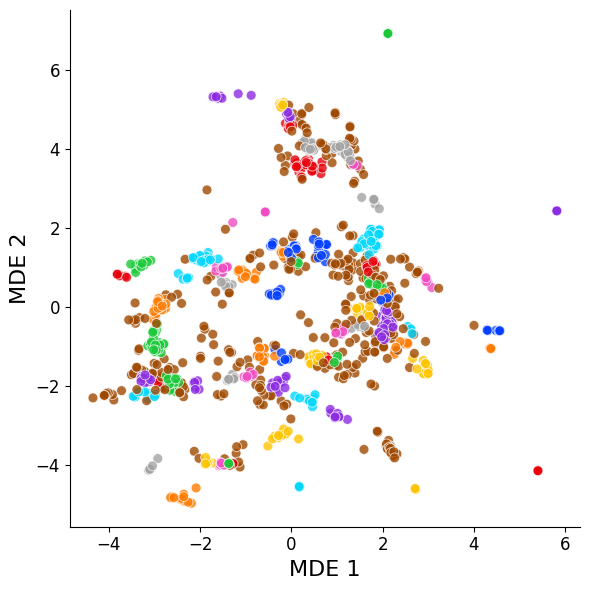

In [283]:
palette = sns.color_palette("bright", n_colors=76)
pymde_df = pd.DataFrame(data=embedding_np,
                        columns=['pyMDE_1', 'pyMDE_2'],
                        index=trans_effects_df.index)

pymde_df['cluster'] = hdbscan_labels

fig, ax = plt.subplots(figsize=(6,6))
sns.scatterplot(
    pymde_df,
    x='pyMDE_1',
    y='pyMDE_2',
    hue='cluster',
    s=50,
    palette=palette,
    legend=False,
    ax=ax,
    alpha=0.8,
)
ax.set_xlabel('MDE 1', fontsize=16)
ax.set_ylabel('MDE 2', fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=12)

sns.despine()
plt.tight_layout()
plt.savefig('results/CD4i_stim48hr_MDE.png')

In [286]:
list(correlation_matrix.loc[hdbscan_labels==74].index)

['SLC39A6',
 'ELP4',
 'ELP3',
 'ELP2',
 'ELP1',
 'NR2C2AP',
 'KTI12',
 'URM1',
 'ELP5',
 'CTU1']

In [284]:
cluster_to_choose = [74, 69]
gene_to_choose = []
for i in cluster_to_choose:
    gene_to_choose = gene_to_choose + list(correlation_matrix.loc[hdbscan_labels==i].index)
corr_subset = correlation_matrix.loc[gene_to_choose, gene_to_choose]
np.fill_diagonal(corr_subset.values, 1)

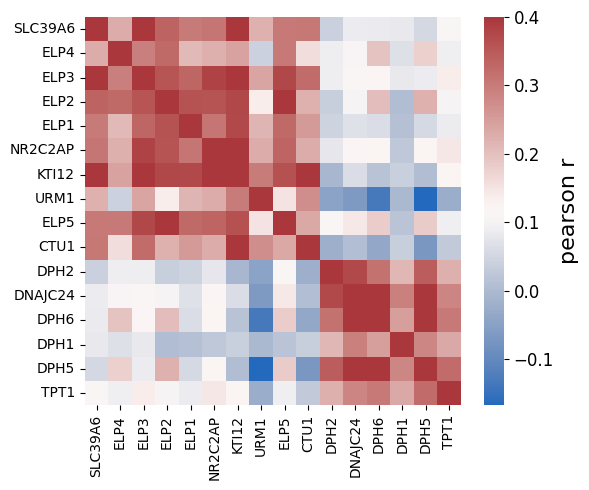

In [285]:
fig, ax = plt.subplots(figsize=(6,5))
sns.heatmap(corr_subset, cmap='vlag', vmax=0.4, ax=ax)
ax.set_xlabel('')
ax.set_ylabel('')
cbar = ax.collections[0].colorbar
cbar.ax.set_ylabel("pearson r", fontsize=16)
cbar.ax.tick_params(labelsize=12)
plt.tight_layout()
plt.savefig('results/CD4i_stim48hr_MDE_exp_clusters.png')

In [207]:
trans_effects_df

gene_name,TSPAN6,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,STPG1,...,ARHGAP11B,LINC02929,CDR1,PRRC2B,F8A1,HOMEZ,C2orf83,ENSG00000290797,ENSG00000291096,SOD2
target_contrast_gene_name,,,,,,,,,,,,,,,,,,,,,
TFAM,0.016539,-2.493574,-1.382062,0.309703,0.022280,-0.952095,-0.170667,0.271319,1.516596,1.413445,...,0.831971,0.134255,0.0,1.108696,0.971723,-0.606550,0.0,0.355100,0.096437,0.072831
TMEM131L,-0.000232,-0.618483,0.639062,-1.368992,0.127923,0.951757,0.031227,-0.473020,-0.802153,0.432187,...,-1.370980,0.017633,0.0,0.370448,-1.036686,-0.650869,0.0,0.036041,0.272060,-0.677942
SCO1,0.012868,-2.052571,0.185324,2.150811,0.076685,0.039965,-0.878841,-1.164959,1.883536,-1.275989,...,1.123975,0.103907,0.0,-0.279167,-0.350379,-0.459203,0.0,0.979098,0.182937,0.294300
TIMM10,-0.004034,1.996024,1.043490,-1.800677,1.763856,1.734332,1.753451,-1.725789,0.342738,1.553592,...,-0.942056,-0.037009,0.0,0.169393,0.631191,0.727048,0.0,-0.522678,1.082960,0.605853
CNOT11,0.004888,-0.550703,1.106222,-0.307655,0.227571,2.087880,0.880159,0.839391,-0.359898,2.441517,...,1.359603,0.072512,0.0,2.480470,0.472072,1.925761,0.0,1.131969,0.687592,-0.578660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ADAT2,0.008201,-2.822576,0.010313,-0.837343,0.114801,0.245393,-1.473888,0.493679,-0.461300,0.084284,...,0.445666,0.080480,0.0,0.843859,-0.030173,-1.284847,0.0,0.454914,0.139192,0.470875
VWF,0.001106,-0.739607,-0.601908,0.734036,1.581100,-0.138550,-1.220093,0.904119,1.453377,0.808616,...,0.264711,0.058239,0.0,0.538246,2.066388,2.015161,0.0,1.485159,2.052984,0.923436
RRAGC,0.009937,-1.900878,-1.013190,1.088616,0.343102,-0.438931,0.616059,1.449446,0.328717,0.572934,...,2.080693,0.066905,0.0,-1.554849,1.725778,1.257580,0.0,-0.113922,0.092002,-1.108388


In [206]:
embedding_np.shape

(1215, 2)

In [120]:
hdbscan_labels.shape

(1215,)

In [17]:
gene_obs_df = pd.read_csv('../../2_files/Replogle_et_al_2022/perturbation_clusters.csv', index_col=0)
gene_var_df = pd.read_csv('../../2_files/Replogle_et_al_2022/gex_clusters.csv', index_col=0)

In [12]:
df_list_of_genes = gene_obs_df.reset_index().rename(columns={'index': 'group'})
df_list_of_genes['genes'] = df_list_of_genes['members'].apply(lambda x: [gene.strip() for gene in x.split(',')])
long_format_df = df_list_of_genes.explode('genes')
final_df = long_format_df[['group', 'genes']].rename(columns={'genes': 'gene'})
genes_to_keep = [gene for gene in final_df.gene if gene in adata_de.obs.target_contrast_gene_name.values]
final_df = final_df[final_df.gene.isin(genes_to_keep)]
final_df = final_df.drop_duplicates()
final_df.set_index('gene', inplace=True)

In [13]:
adata_de_subset = adata_de[adata_de.obs.target_contrast_gene_name.isin(final_df.index)].copy()
de_counts_subset = de_counts[de_counts.target_name.isin(final_df.index)].copy()

In [19]:
# Choose highly variable genes for var
variance_frac_thres = 0.1
highly_var = adata_de.var[np.var(adata_de.layers['log_fc'], axis=0)>variance_frac_thres].gene_name
len(highly_var)

3260

In [36]:
# Choose highly variable genes for var
variance_frac_thres = 10
highly_var = adata_de.var[np.var(adata_de.layers['zscore'], axis=0)>variance_frac_thres].gene_name

# Choose highly variable genes for var
#variance_frac_thres = 0.2
#highly_var = adata_de.var[np.var(adata_de.layers['log_fc'], axis=0)>variance_frac_thres].gene_name

adj_p_values = adata_de_subset.layers['adj_p_value']
gene_names = adata_de_subset.var['gene_name'].values

top_genes_union = set()

for i in range(adata_de_subset.n_obs):
    top_10_indices = np.argsort(adj_p_values[i, :])[:10]
    top_10_genes = gene_names[top_10_indices]
    top_genes_union.update(top_10_genes)

top_genes_union.update(highly_var)
var_to_choose = list(top_genes_union)

In [37]:
adata_de_selected = adata_de_subset[:,adata_de_subset.var.gene_name.isin(var_to_choose)].copy()

In [38]:
adata_de_selected

AnnData object with n_obs × n_vars = 305 × 2033
    obs: 'target_contrast_gene_name', 'culture_condition', 'target_contrast', 'chunk', 'n_cells_target'
    var: 'gene_ids', 'gene_name'
    layers: 'adj_p_value', 'baseMean', 'lfcSE', 'log_fc', 'p_value', 'zscore'

In [55]:
trans_effects_df = pd.DataFrame(data=adata_de_selected.layers['zscore'],
                                columns=adata_de_selected.var.gene_name,
                                index=adata_de_selected.obs.target_contrast_gene_name)

In [56]:
trans_effects_df = trans_effects_df.loc[final_df.index.values]

<Axes: >

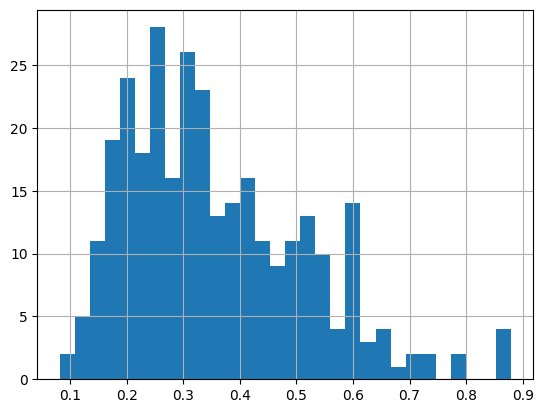

In [57]:
correlation_matrix = trans_effects_df.T.corr()
np.fill_diagonal(correlation_matrix.values, 0)
correlation_matrix.max(0).hist(bins=30)

<Axes: xlabel='target_contrast_gene_name', ylabel='target_contrast_gene_name'>

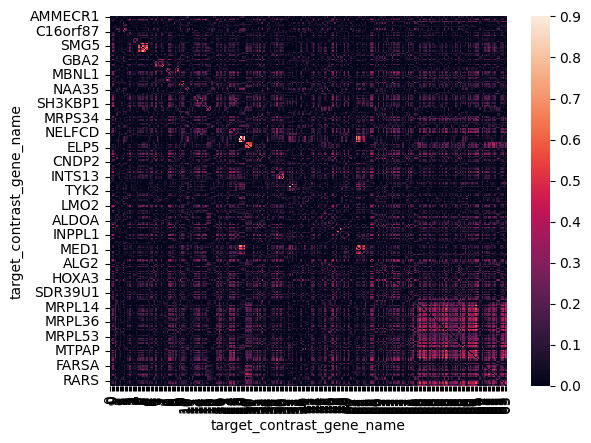

In [60]:
#fig, ax = plt.subplots(figsize=(18,15))
sns.heatmap(correlation_matrix, xticklabels=final_df.group.values, vmin=0, vmax=0.9)

In [64]:
X = trans_effects_df.values
# We compute a 2-dimensional spectral embedding for initialization.
spectral_2d_init_np = SpectralEmbedding(n_components=2, n_neighbors=7, eigen_solver='arpack', random_state=42).fit_transform(X)
spectral_2d_init = torch.tensor(spectral_2d_init_np).contiguous()
# We use the same high-level function to create the 2D embedding object.
mde_2d = pymde.preserve_neighbors(
    data=X,
    embedding_dim=2,
    n_neighbors=7,
    repulsive_fraction=5,
).embed(X=spectral_2d_init, eps=1e-07, max_iter=3000, verbose=True)

mde_2d_ni = pymde.preserve_neighbors(
    data=X,
    embedding_dim=2,
    n_neighbors=7,
    repulsive_fraction=5,
).embed(eps=1e-07, max_iter=3000, verbose=True)

Jul 21 09:43:54 AM: Fitting a centered embedding into R^2, for a graph with 305 items and 11188 edges.
Jul 21 09:43:54 AM: `embed` method parameters: eps=1.0e-07, max_iter=3000, memory_size=10
Jul 21 09:43:54 AM: iteration 0000 | distortion 3.635341 | residual norm 17.2656 | step length 0.00443539 | percent change 12.6748
Jul 21 09:43:55 AM: iteration 0300 | distortion 0.221181 | residual norm 2.05595e-05 | step length 1 | percent change 0.0337705
Jul 21 09:43:55 AM: iteration 0600 | distortion 0.221083 | residual norm 1.11761e-06 | step length 0 | percent change 0
Jul 21 09:43:56 AM: iteration 0900 | distortion 0.221083 | residual norm 1.46993e-07 | step length 550.5 | percent change 0.000154779
Jul 21 09:43:58 AM: Converged in 1170 iterations, with residual norm 9.92673e-08
Jul 21 09:43:58 AM: Finished fitting in 3.575 seconds and 1170 iterations.
Jul 21 09:43:58 AM: average distortion 0.221 | residual norm 9.9e-08
Jul 21 09:43:58 AM: Fitting a centered embedding into R^2, for a grap

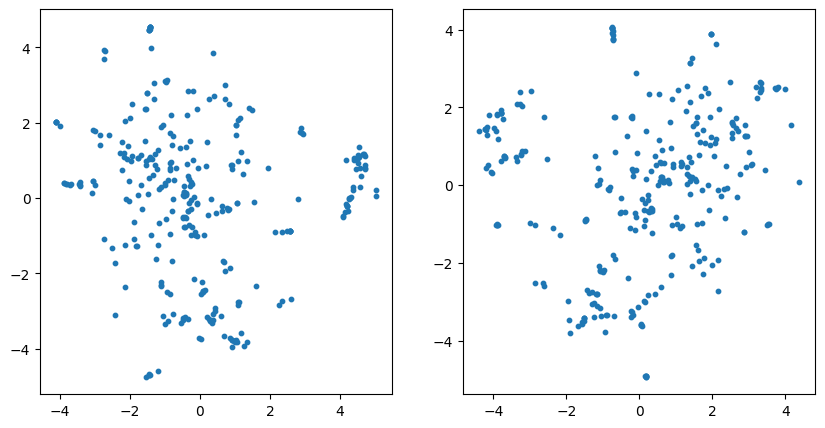

In [65]:
# Retrieve the embedding from the MDE object and convert to NumPy
embedding_np = mde_2d.numpy()
embedding_np_ni = mde_2d_ni.numpy()
fig, ax = plt.subplots(1,2,figsize=(10,5))

# Create the scatter plot
ax[0].scatter(embedding_np[:, 0], embedding_np[:, 1], s=10)
ax[1].scatter(embedding_np_ni[:, 0], embedding_np_ni[:, 1], s=10)

plt.show()

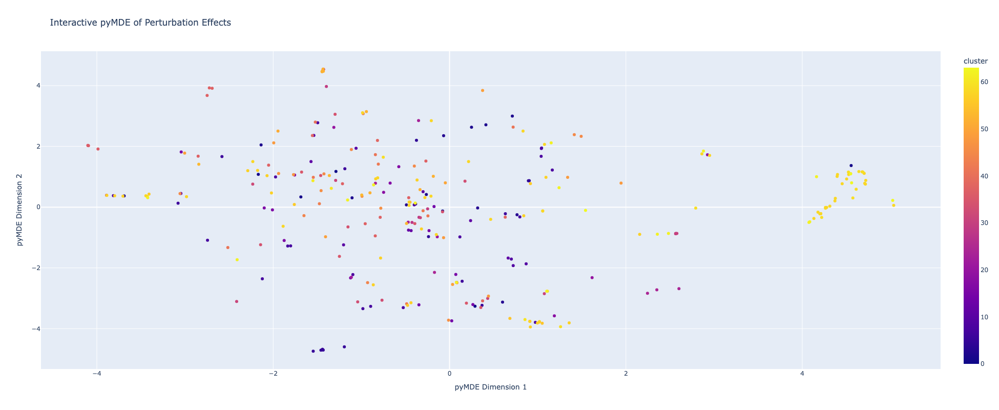

In [67]:
pymde_df = pd.DataFrame(data=embedding_np,
                        columns=['pyMDE_1', 'pyMDE_2'],
                        index=trans_effects_df.index)
pymde_df = pymde_df.loc[final_df.index]
pymde_df['cluster'] = final_df.group.values

# 4. Visualize with Plotly Express for interactivity ✨
fig = px.scatter(
    pymde_df,
    x='pyMDE_1',
    y='pyMDE_2',
    color='cluster',
    hover_name=pymde_df.index, 
    title='Interactive pyMDE of Perturbation Effects',
    width=800,
    height=800
)

# Update layout for a cleaner look
fig.update_layout(
    xaxis_title="pyMDE Dimension 1",
    yaxis_title="pyMDE Dimension 2"
)

# Show the interactive plot
fig.show()

## Try pseudobulk measurement

In [78]:
adata_pb = sc.read_h5ad('/Users/rzhu/Gladstone Dropbox/Ronghui Zhu/GRNPerturbSeq/3_expts/processed_data/CD4iR1_Psomagen/CD4iR1_Psomagen_merged.DE_pseudobulk.h5ad')

In [91]:
adata_pb

AnnData object with n_obs × n_vars = 32732 × 18117
    obs: '10xrun_id', 'cell_sample_id', 'donor_id', 'culture_condition', 'guide_id', 'perturbed_gene_name', 'perturbed_gene_id', 'guide_type', 'n_cells', 'total_counts', 'keep_min_cells', 'keep_effective_guides', 'keep_total_counts', 'keep_for_DE', 'keep_test_genes', 'log10_n_cells'
    var: 'gene_ids', 'gene_name'

In [ ]:
mask = (adata_pb.obs.culture_condition=='Rest') & (adata_pb.obs.keep_for_DE==True)
adata_pb = adata_pb[mask].copy()
pb = sc.get.aggregate(adata_pb, by='perturbed_gene_name', func='sum')
pb.X = pb.layers['sum']
sc.pp.normalize_total(pb, target_sum=1e6)
sc.pp.scale(pb)

In [112]:
pb_subset = pb[:,pb.var.gene_name.isin(var_to_choose)].copy()

In [109]:
df_list_of_genes = gene_obs_df.reset_index().rename(columns={'index': 'group'})
df_list_of_genes['genes'] = df_list_of_genes['members'].apply(lambda x: [gene.strip() for gene in x.split(',')])
long_format_df = df_list_of_genes.explode('genes')
final_df = long_format_df[['group', 'genes']].rename(columns={'genes': 'gene'})
genes_to_keep = [gene for gene in final_df.gene if gene in pb.obs.perturbed_gene_name.values]
final_df = final_df[final_df.gene.isin(genes_to_keep)]
final_df = final_df.drop_duplicates()
final_df.set_index('gene', inplace=True)

In [117]:
trans_effects_df = pd.DataFrame(data=pb_subset.X,
                                columns=pb_subset.var.gene_name,
                                index=pb_subset.obs.perturbed_gene_name)
trans_effects_df = trans_effects_df.loc[final_df.index.values]

<Axes: >

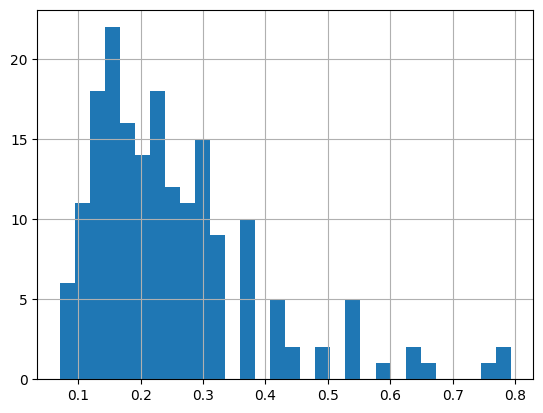

In [118]:
correlation_matrix = trans_effects_df.T.corr()
np.fill_diagonal(correlation_matrix.values, 0)
correlation_matrix.max(0).hist(bins=30)

<Axes: xlabel='perturbed_gene_name', ylabel='perturbed_gene_name'>

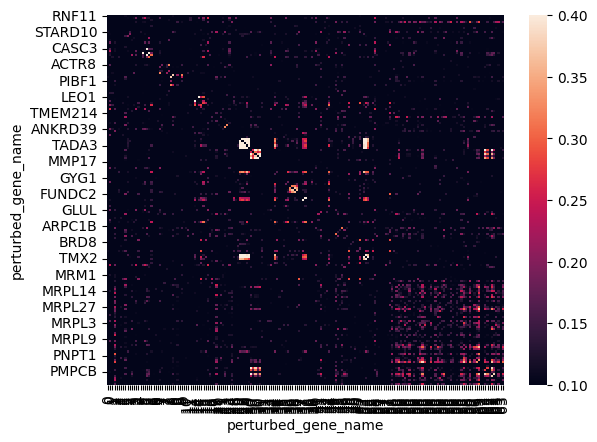

In [122]:
#fig, ax = plt.subplots(figsize=(18,15))
sns.heatmap(correlation_matrix, xticklabels=final_df.group.values, vmin=0.1, vmax=0.4)

In [89]:
adata_pb.X

array([[1.40979842e+03, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 1.11635621e+02],
       [1.36938485e+03, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 8.18945842e+01],
       [6.65189787e+02, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 8.61183206e+01],
       ...,
       [8.17305052e+02, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 7.79666003e+01],
       [9.65938341e+02, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 2.65221950e-01, 6.65707094e+01],
       [1.05912646e+03, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 7.77340524e+01]],
      shape=(32732, 18117))

In [90]:
np.sum(adata_pb.X, axis=1)

array([1000000., 1000000., 1000000., ..., 1000000., 1000000., 1000000.],
      shape=(32732,))

## Custom distance measurement

In [633]:
def calculate_custom_distance(col1: pd.Series, col2: pd.Series) -> float:
    is_certain1 = (col1 != 0) & (~col1.isna())
    is_certain2 = (col2 != 0) & (~col2.isna())
    both_certain_mask = is_certain1 & is_certain2
    filtered_col1 = col1[both_certain_mask]
    filtered_col2 = col2[both_certain_mask]
    num_certain_pairs = len(filtered_col1)
    if num_certain_pairs == 0:
        return np.nan
    squared_errors = (filtered_col1 - filtered_col2) ** 2
    mean_squared_error = squared_errors.sum() / num_certain_pairs
    distance = np.sqrt(mean_squared_error)

    return distance

In [657]:
genes = None
cond = 'Rest'
effect_stat = 'zscore'
signif_stat = 'adj_p_value'
signif_alpha = 0.2

trans_effects_df = pd.DataFrame()
gene_added = []
group_added = []

for i in groups_to_choose:
    res_df = get_DE_results_long(
    adata_de, 
    targets=final_df.loc[final_df.group==i, 'gene'].values, genes=genes,
    effect_estimates=[effect_stat], signif_alpha=signif_alpha, signif_estimate=signif_stat)
    res_df = res_df[res_df['culture_condition'] == cond]
    res_df.loc[res_df['target_contrast_gene_name'] == res_df['gene'], effect_stat] = 0
    res_df = res_df[res_df['significant']]
    temp = res_df.pivot(columns=['culture_condition','target_contrast_gene_name'], index='gene', values=effect_stat)
    temp.columns = [f"{target}" for cond, target in temp.columns]
    #trans_effects_df = np.sign(trans_effects_df).fillna(0)
    temp = temp.fillna(0)
    trans_effects_df = pd.concat([trans_effects_df, temp], axis=1)
    if len(temp.columns)!=0:
        gene_added = gene_added + temp.columns.tolist()
        group_added = group_added + ([i]*len(temp.columns))
    
#trans_effects_df = np.sign(trans_effects_df).fillna(0)
trans_effects_df = trans_effects_df.fillna(0)
group_info = pd.DataFrame({'gene':gene_added, 'group':group_added})
group_info = group_info.loc[~trans_effects_df.columns.duplicated()]
trans_effects_df = trans_effects_df.loc[:, ~trans_effects_df.columns.duplicated()]

distance_matrix = pd.DataFrame(index=trans_effects_df.columns, columns=trans_effects_df.columns, dtype=float)

#for i in range(len(trans_effects_df.columns)):
#    for j in range(i, len(trans_effects_df.columns)):
#        col_i_name = trans_effects_df.columns[i]
#        col_j_name = trans_effects_df.columns[j]

#        if i == j:
#            # The distance from a column to itself is 0
#            dist = 0.0
#        else:
#            dist = calculate_custom_distance(trans_effects_df[col_i_name], trans_effects_df[col_j_name])
#        distance_matrix.loc[col_i_name, col_j_name] = dist
#        distance_matrix.loc[col_j_name, col_i_name] = dist # Matrix is symmetric
#distance_matrix = distance_matrix.fillna(np.max(distance_matrix))
#embedding = pymde.preserve_distances(
#    distance_matrix.values
#).embed()

In [658]:
correlation_matrix = trans_effects_df.corr()
np.fill_diagonal(correlation_matrix.values, 0)

<Axes: >

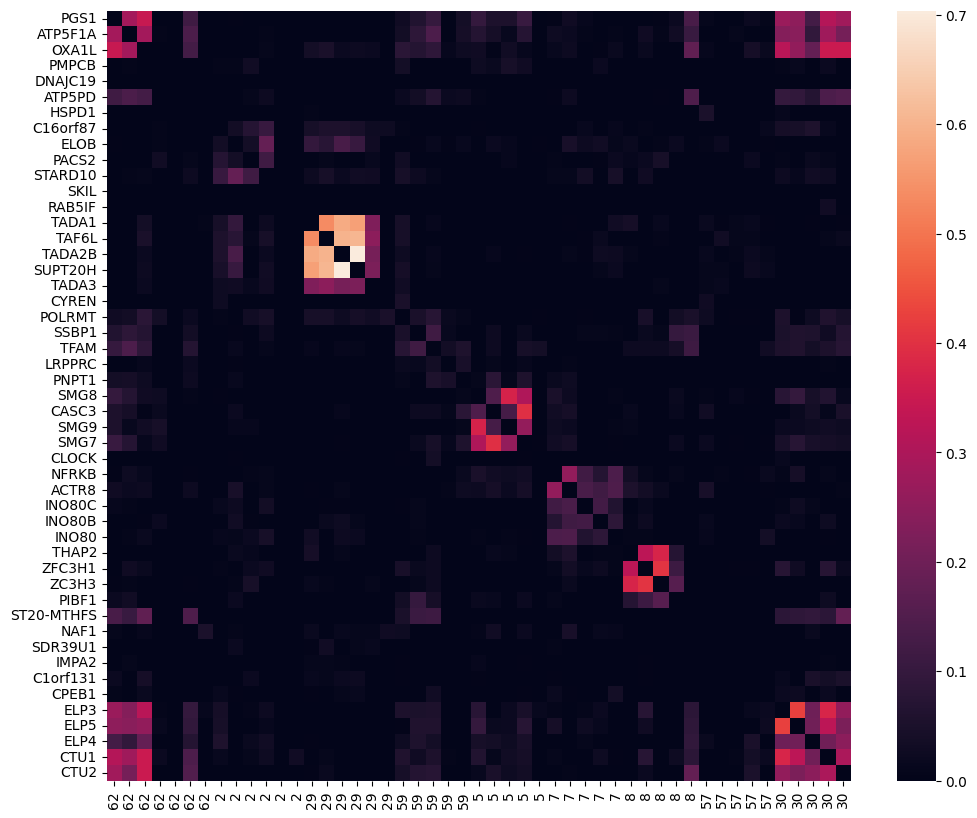

In [659]:
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(correlation_matrix, xticklabels=group_info.group, yticklabels=True, vmin=0)

In [660]:
embedding = pymde.preserve_distances(
    correlation_matrix.values
).embed()

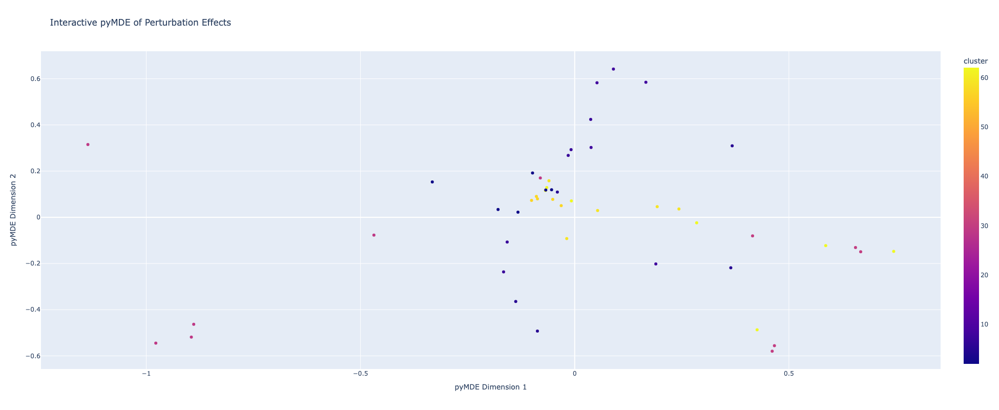

In [661]:
pymde_df = pd.DataFrame(data=embedding,
                        columns=['pyMDE_1', 'pyMDE_2'],
                        index=correlation_matrix.index)

pymde_df['cluster'] = group_info.group.values

# 4. Visualize with Plotly Express for interactivity ✨
fig = px.scatter(
    pymde_df,
    x='pyMDE_1',
    y='pyMDE_2',
    color='cluster',
    hover_name=pymde_df.index, 
    title='Interactive pyMDE of Perturbation Effects',
    width=800,
    height=800
)

# Update layout for a cleaner look
fig.update_layout(
    xaxis_title="pyMDE Dimension 1",
    yaxis_title="pyMDE Dimension 2"
)

# Show the interactive plot
fig.show()

<Axes: >

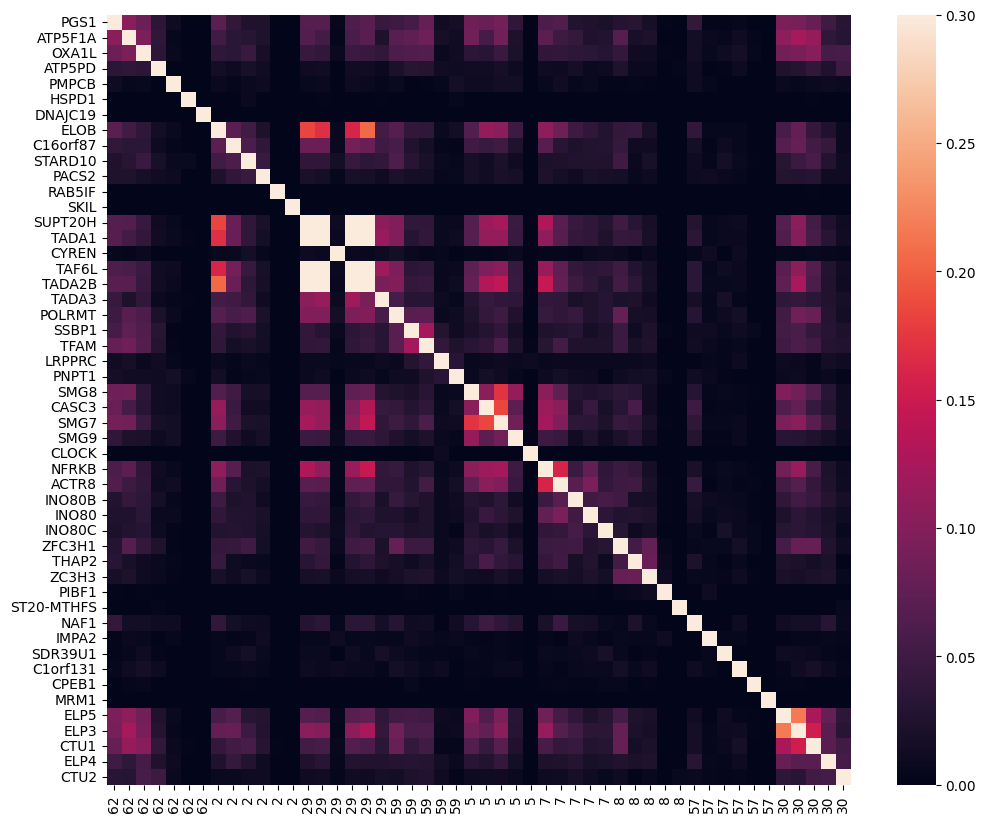

In [604]:
fig, ax = plt.subplots(figsize=(12,10))
sns.heatmap(similarity, xticklabels=group_info.group, yticklabels=True, vmin=0, vmax=0.3)

## Shared effects between perturbations

In [416]:
# Restict to perturbations with at least 2 significant DE genes
targets = de_counts[(de_counts.condition == 'Rest') & (de_counts.n_total_de_genes > 10)].target_name.tolist()
genes = None
cond = 'Rest'
effect_stat = 'zscore'
signif_stat = 'adj_p_value'
signif_alpha = 0.05

res_df = get_DE_results_long(
    adata_de, 
    targets=targets, genes=genes,
    effect_estimates=[effect_stat], signif_alpha=signif_alpha, signif_estimate=signif_stat)
res_df = res_df[res_df['culture_condition'] == cond]

res_df.loc[res_df['target_contrast_gene_name'] == res_df['gene'], effect_stat] = 0
res_df = res_df[res_df['significant']]

In [417]:
trans_effects_df = res_df.pivot(columns=['culture_condition','target_contrast_gene_name'], index='gene', values=effect_stat)
trans_effects_df.columns = [f"{cond}_{target}" for cond, target in trans_effects_df.columns]
trans_effects_df_sign = np.sign(trans_effects_df).fillna(0)
#trans_effects_df = np.sign(trans_effects_df).fillna(0)
trans_effects_df = trans_effects_df.fillna(0)
#trans_effects_df = trans_effects_df.loc[:, np.abs(trans_effects_df).sum(0) > 1]
#trans_effects_df = trans_effects_df[trans_effects_df.sum(1) != 0]
trans_effects_df

,Rest_TP53,Rest_FUBP1,Rest_ARF1,Rest_SIN3B,Rest_FANCF,Rest_CALHM6,Rest_RNF20,Rest_CCDC6,Rest_CD9,Rest_TP53BP1,...,Rest_TEAD4,Rest_PDP1,Rest_ARL10,Rest_ACTR2,Rest_MAD2L1BP,Rest_WASF2,Rest_DPM3,Rest_CD2BP2,Rest_PNPT1,Rest_BMI1
gene,,,,,,,,,,,,,,,,,,,,,
ENSG00000000419,3.133527,-4.34739,2.92918,6.481054,-3.817773,-4.84045,3.702069,-3.261736,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ENSG00000000460,0.000000,0.00000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,3.504768,-3.708275,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ENSG00000000971,0.000000,0.00000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ENSG00000001036,0.000000,0.00000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ENSG00000001084,0.000000,0.00000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000284770,0.000000,0.00000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ENSG00000285077,0.000000,0.00000,0.00000,0.000000,0.000000,0.00000,0.000000,0.000000,3.834162,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ENSG00000290292,-2.664171,0.00000,0.00000,0.000000,0.000000,0.00000,0.000000,4.978310,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [418]:
correlation_matrix = trans_effects_df.corr()
np.fill_diagonal(correlation_matrix.values, 0)

<Axes: >

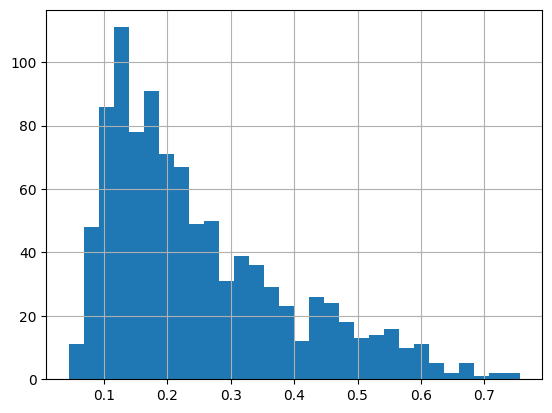

In [419]:
correlation_matrix.max(0).hist(bins=30)

In [471]:
JI_thresh = 0
keep_tests = correlation_matrix.max(0) > JI_thresh
filtered_corr_matrix = correlation_matrix.loc[keep_tests, keep_tests]

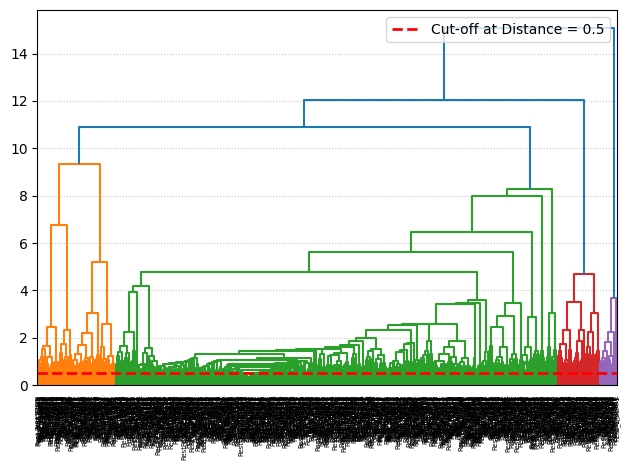

In [475]:
hierarchical = AgglomerativeClustering(n_clusters=None, distance_threshold=1.3, linkage='complete') # Set distance_threshold to 0 and n_clusters to None to get the full hierarchy
perturbation_clusters_hierarchical = hierarchical.fit_predict(filtered_corr_matrix)
linked = linkage(filtered_corr_matrix, 'ward') # 'ward' is a common linkage method
dendrogram(
    linked,
    orientation='top',
    labels=filtered_corr_matrix.index.tolist(), # Use perturbation names as labels
    distance_sort='descending',
    show_leaf_counts=True,
)
cut_off_distance = 0.5 # Example: Adjust this value after viewing the dendrogram
plt.axhline(y=cut_off_distance, color='r', linestyle='--', linewidth=2, label=f'Cut-off at Distance = {cut_off_distance}')
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()

In [486]:
data_for_pymde = trans_effects_df.loc[:,keep_tests].T
embedding = pymde.preserve_neighbors(data_for_pymde.values,
                                     attractive_penalty=pymde.penalties.Log1p,
                                     repulsive_penalty=pymde.penalties.Log,
                                     embedding_dim=2,
                                     n_neighbors=4,
                                     repulsive_fraction=2).embed()

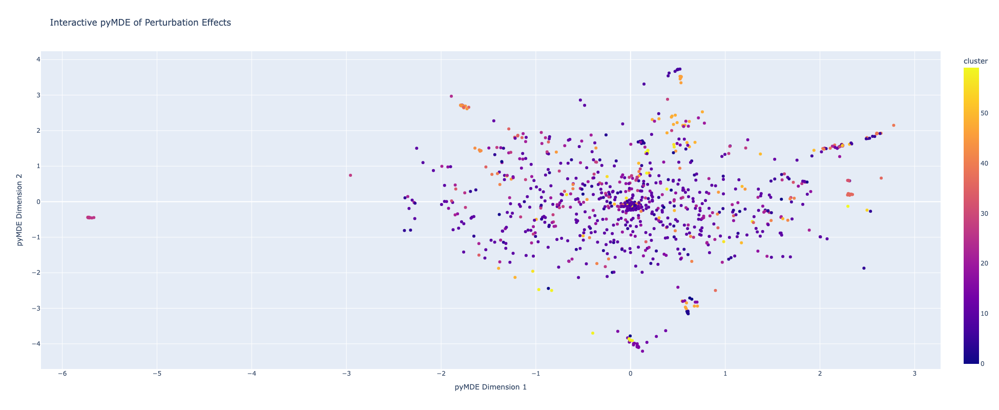

In [487]:
# 3. Visualize the results
pymde_df = pd.DataFrame(data=embedding,
                        columns=['pyMDE_1', 'pyMDE_2'],
                        index=data_for_pymde.index)
pymde_df['cluster'] = perturbation_clusters_hierarchical

# 4. Visualize with Plotly Express for interactivity ✨
fig = px.scatter(
    pymde_df,
    x='pyMDE_1',
    y='pyMDE_2',
    color='cluster',
    hover_name=pymde_df.index, 
    title='Interactive pyMDE of Perturbation Effects',
    width=800,
    height=800
)

# Update layout for a cleaner look
fig.update_layout(
    xaxis_title="pyMDE Dimension 1",
    yaxis_title="pyMDE Dimension 2"
)

# Show the interactive plot
fig.show()

In [389]:
np.concatenate([np.where(perturbation_clusters_hierarchical==21)[0], np.where(perturbation_clusters_hierarchical==25)[0]])

array([ 88, 123, 168, 220, 235, 236, 278, 288, 290, 292, 297, 215])

In [427]:
mask = np.concatenate([np.where(perturbation_clusters_hierarchical==6)[0],
                       np.where(perturbation_clusters_hierarchical==15)[0],
                       np.where(perturbation_clusters_hierarchical==9)[0],
                      np.where(perturbation_clusters_hierarchical==17)[0]])
test = filtered_data.iloc[mask, mask]

<Axes: >

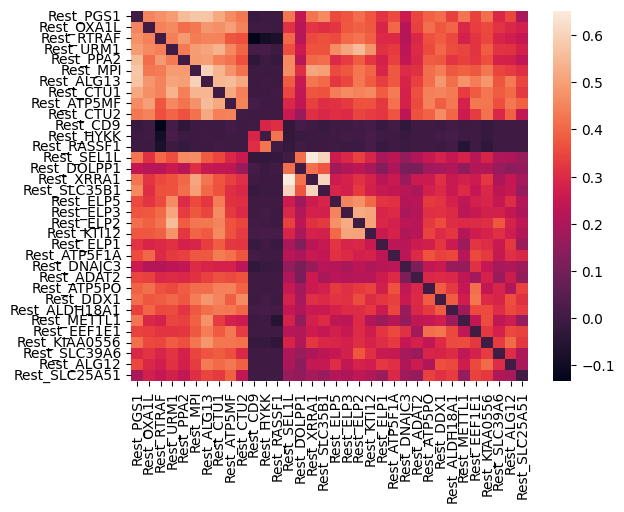

In [428]:
sns.heatmap(test, xticklabels=True, yticklabels=True,)

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



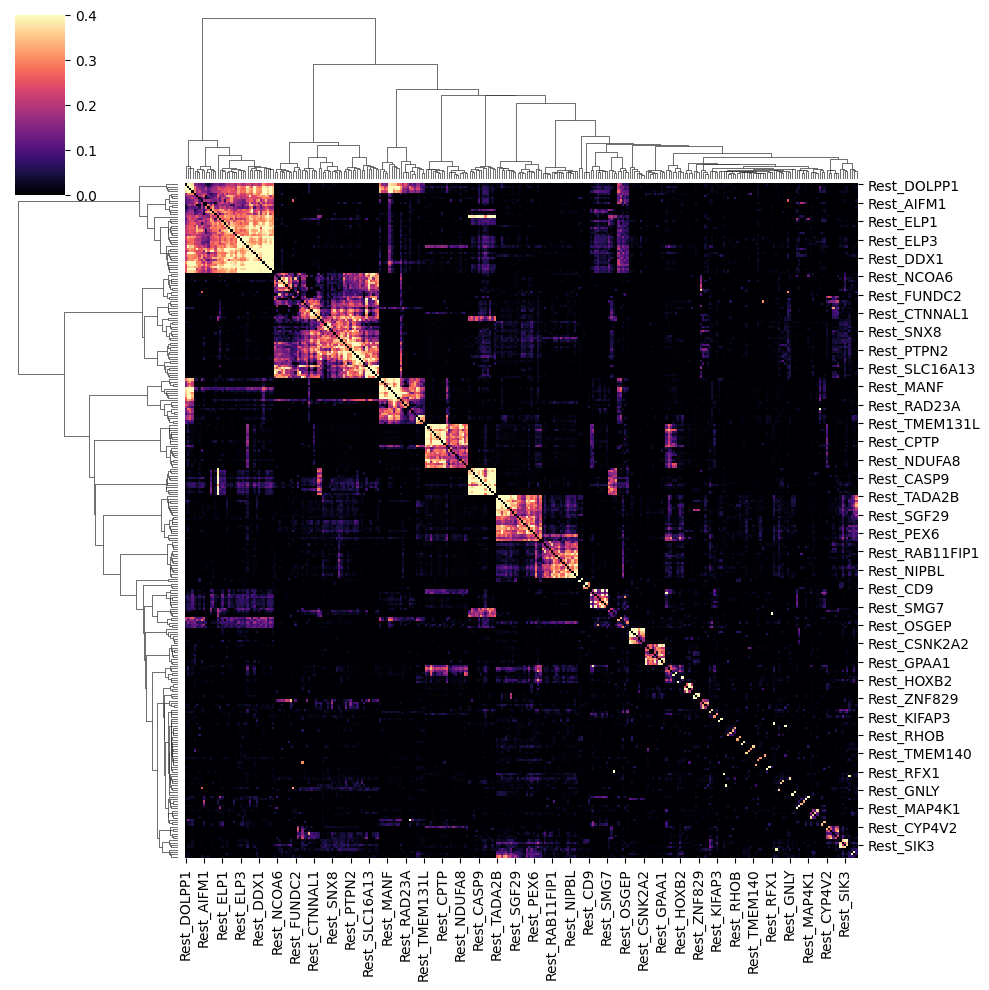

In [426]:
# Filter by fraction of shared effects and keep top JI pairs
JI_thresh = 0.3

#plt.figure(figsize=(4,4))
#filtered_data = similarity.copy()
#filtered_data[shared_effects < 3] = 0
#np.fill_diagonal(filtered_data.values, 0)
#filtered_data.max(0).sort_values().hist(bins=30)
#plt.axvline(JI_thresh, color='black')
filtered_data = correlation_matrix

keep_tests = filtered_data.max(0) > JI_thresh
filtered_data = filtered_data.loc[keep_tests, keep_tests]
order_perts = filtered_data.sum(0).sort_values(ascending=False).index.tolist()
ordered_data = filtered_data.loc[order_perts, order_perts]

# First generate clustermap to get ordering
clustermap = sns.clustermap(
    ordered_data,
    method='ward', metric='euclidean',
    figsize=(10,10), 
    cmap='magma',
    vmax=0.4,
    vmin=0
)

# Get the row and column ordering from the clustermap
row_order = clustermap.dendrogram_row.reordered_ind
col_order = clustermap.dendrogram_col.reordered_ind
reordered_data = ordered_data.iloc[row_order, col_order]

# Compute Jaccard similarity between perturbations 

In [193]:
# Compute intersection
pos_trans_effects_df = trans_effects_df.copy()
pos_trans_effects_df[pos_trans_effects_df < 0] = 0
neg_trans_effects_df = trans_effects_df.copy()
neg_trans_effects_df[neg_trans_effects_df > 0] = 0
shared_effects = pos_trans_effects_df.T.dot(pos_trans_effects_df) + neg_trans_effects_df.T.dot(neg_trans_effects_df)

# Compute size of union
n = shared_effects.shape[0]
total_genes = np.diag(shared_effects)
total_i = np.tile(total_genes.reshape(-1, 1), (1, n))
total_j = np.tile(total_genes.reshape(1, -1), (n, 1))
union = total_i + total_j - shared_effects

# Jaccard index (intersection / union)
similarity = np.divide(shared_effects.values, union, 
                            out=np.zeros_like(shared_effects, dtype=float), 
                            where=union!=0)

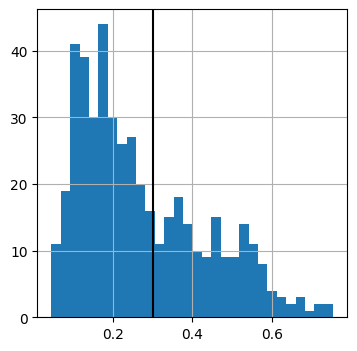

In [199]:
filtered_data = correlation_matrix
JI_thresh = 0.3
plt.figure(figsize=(4,4))
np.fill_diagonal(filtered_data.values, 0)
filtered_data.max(0).sort_values().hist(bins=30)
plt.axvline(JI_thresh, color='black')

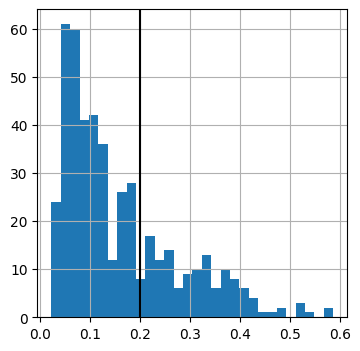

In [196]:
JI_thresh = 0.2

plt.figure(figsize=(4,4))
filtered_data = similarity.loc[shared_effects.sum(1) > 20, shared_effects.sum(1) > 20]
np.fill_diagonal(filtered_data.values, 0)
filtered_data.max(0).sort_values().hist(bins=30)
plt.axvline(JI_thresh, color='black')

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



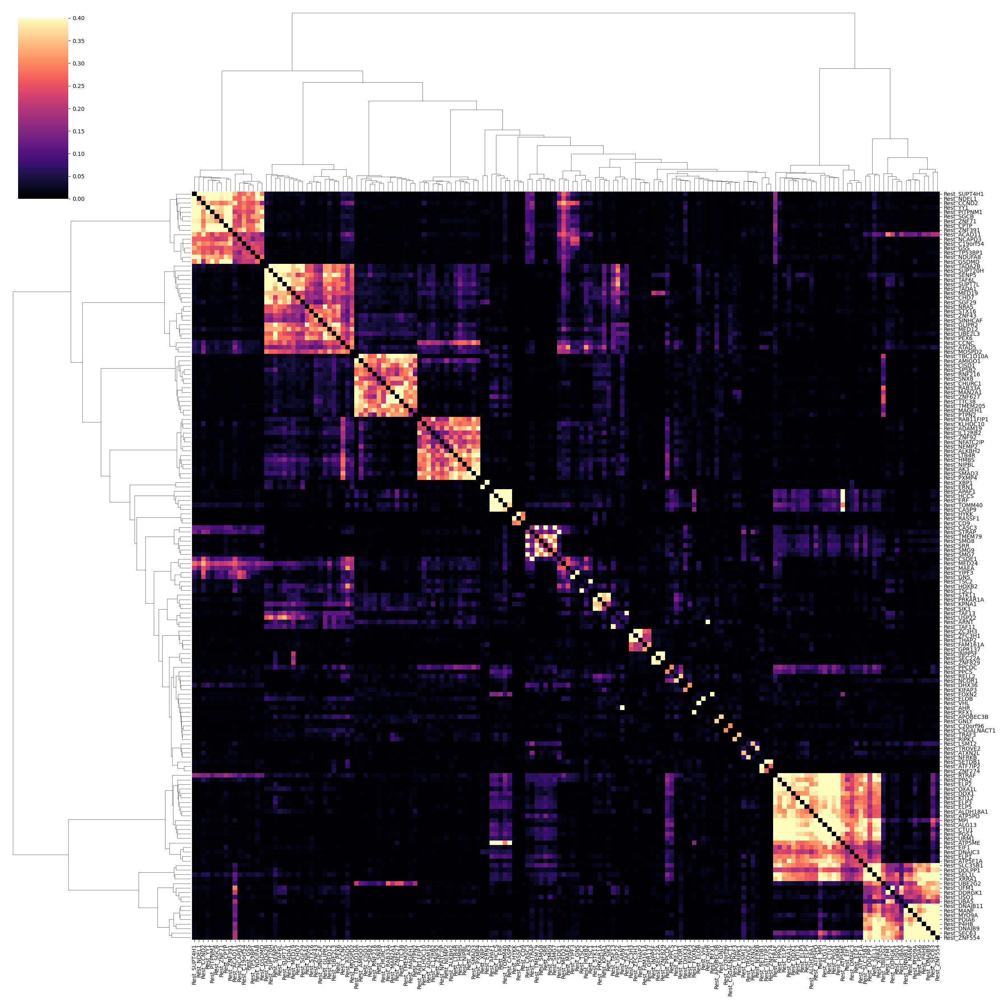

In [200]:
# Filter by fraction of shared effects and keep top JI pairs
JI_thresh = 0.3

#plt.figure(figsize=(4,4))
#filtered_data = similarity.copy()
#filtered_data[shared_effects < 3] = 0
#np.fill_diagonal(filtered_data.values, 0)
#filtered_data.max(0).sort_values().hist(bins=30)
#plt.axvline(JI_thresh, color='black')

keep_tests = filtered_data.max(0) > JI_thresh
filtered_data = filtered_data.loc[keep_tests, keep_tests]
order_perts = filtered_data.sum(0).sort_values(ascending=False).index.tolist()
ordered_data = filtered_data.loc[order_perts, order_perts]

# First generate clustermap to get ordering
clustermap = sns.clustermap(
    ordered_data,
    method='ward', metric='euclidean',
    figsize=(25,25), 
    xticklabels=True, yticklabels=True,
    cmap='magma',
    vmax=0.4,
    vmin=0
)

# Get the row and column ordering from the clustermap
row_order = clustermap.dendrogram_row.reordered_ind
col_order = clustermap.dendrogram_col.reordered_ind
reordered_data = ordered_data.iloc[row_order, col_order]

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning:

The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning:

The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



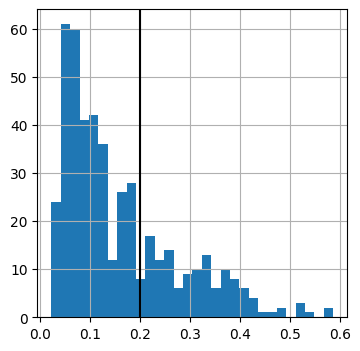

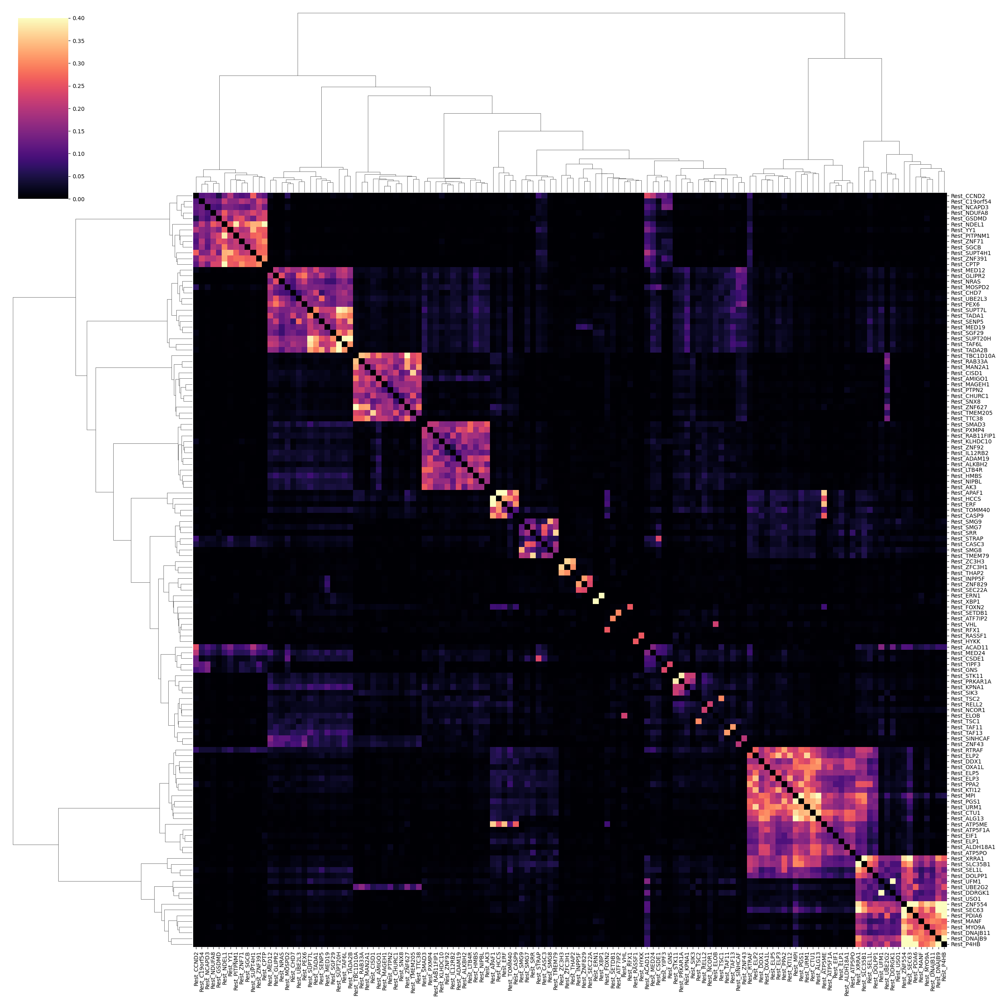

In [194]:
# Filter by fraction of shared effects and keep top JI pairs
JI_thresh = 0.2

plt.figure(figsize=(4,4))
filtered_data = similarity.copy()
filtered_data[shared_effects < 3] = 0
np.fill_diagonal(filtered_data.values, 0)
filtered_data.max(0).sort_values().hist(bins=30)
plt.axvline(JI_thresh, color='black')

keep_tests = filtered_data.max(0) > JI_thresh
filtered_data = filtered_data.loc[keep_tests, keep_tests]
order_perts = filtered_data.sum(0).sort_values(ascending=False).index.tolist()
ordered_data = filtered_data.loc[order_perts, order_perts]

# First generate clustermap to get ordering
clustermap = sns.clustermap(
    ordered_data,
    method='ward', metric='euclidean',
    figsize=(25,25), 
    xticklabels=True, yticklabels=True,
    cmap='magma',
    vmax=0.4,
    vmin=0
)

# Get the row and column ordering from the clustermap
row_order = clustermap.dendrogram_row.reordered_ind
col_order = clustermap.dendrogram_col.reordered_ind
reordered_data = ordered_data.iloc[row_order, col_order]

/Users/rzhu/miniconda3/envs/deseq/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:584: ClusterWarning:

The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix

/var/folders/qq/j023xkr13nxfrw65dx2bqwd00000gp/T/ipykernel_37036/676505322.py:3: ClusterWarning:

The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



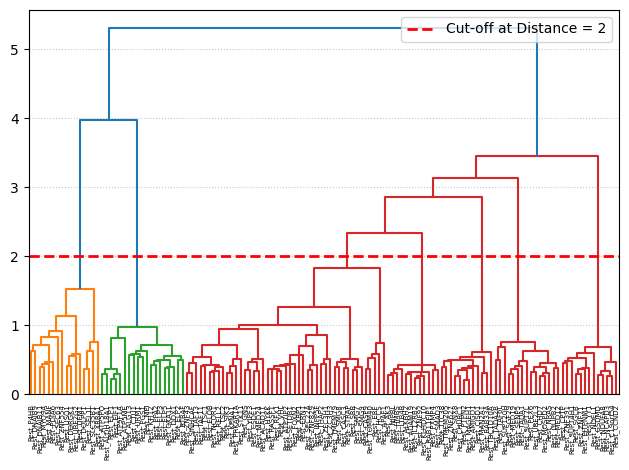

In [176]:
hierarchical = AgglomerativeClustering(n_clusters=None, distance_threshold=0, linkage='complete') # Set distance_threshold to 0 and n_clusters to None to get the full hierarchy
perturbation_clusters_hierarchical = hierarchical.fit_predict(ordered_data)
linked = linkage(ordered_data, 'ward') # 'ward' is a common linkage method
dendrogram(
    linked,
    orientation='top',
    labels=ordered_data.index.tolist(), # Use perturbation names as labels
    distance_sort='descending',
    show_leaf_counts=True,
)
cut_off_distance = 2 # Example: Adjust this value after viewing the dendrogram
plt.axhline(y=cut_off_distance, color='r', linestyle='--', linewidth=2, label=f'Cut-off at Distance = {cut_off_distance}')
plt.legend(fontsize=10)
plt.grid(axis='y', linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()

In [76]:
# Compute long format for shared effects
long_shared_effects = shared_effects.reset_index().melt(
    id_vars=['index'], 
    value_name='n_shared_effects',
    var_name='target_contrast_gene_name_2'
).sort_values('n_shared_effects', ascending=False)

# Remove self-comparisons
long_shared_effects = long_shared_effects[
    long_shared_effects['index'] != long_shared_effects['target_contrast_gene_name_2']
]

# Compute long format for Jaccard index
long_jaccard_index = filtered_data.reset_index().melt(
    id_vars=['index'],
    value_name='jaccard_index', 
    var_name='target_contrast_gene_name_2'
).sort_values('jaccard_index', ascending=False)

# Remove self-comparisons
long_jaccard_index = long_jaccard_index[
    long_jaccard_index['index'] != long_jaccard_index['target_contrast_gene_name_2']
]

# Merge shared effects with Jaccard index
long_jaccard_index = long_jaccard_index.merge(
    long_shared_effects,
    on=['index', 'target_contrast_gene_name_2'],
    how='left'
)


In [ ]:
# Plot heatmap with the same ordering
plt.figure(figsize=(7,7))
sns.heatmap(
    reordered_data,
    cmap='magma',
    xticklabels=False,
    yticklabels=False,
    cbar_kws={'label': 'Fraction of shared DE genes\n(Jaccard Index)'}
)

plt.xlabel('Perturbed gene', fontsize=14)
plt.ylabel('Perturbed gene', fontsize=14)
plt.tight_layout()

In [160]:
# Read the Excel sheet with perturb clusters
perturb_clusters = pd.read_excel('../../metadata/Replogle2022_TableS3_perturb_clusters.xlsx', sheet_name=3, index_col=0)
# Create mapping of cluster IDs to descriptions
cluster_descriptions = perturb_clusters['best_description']
replogle_perturb_clusters = pd.DataFrame([
    (gene, cluster_descriptions[cluster_idx])
    for cluster_idx, members in perturb_clusters['members'].items()
    for gene in members.split(',')
], columns=['gene', 'cluster_name']).set_index('gene')
replogle_perturb_clusters = replogle_perturb_clusters.sort_values('cluster_name')

replogle_pert2cl = pd.get_dummies(replogle_perturb_clusters['cluster_name']).astype(int)
same_cluster_replogle = pd.DataFrame(
    np.matmul(replogle_pert2cl.values, replogle_pert2cl.values.T),
    index=replogle_pert2cl.index, columns=replogle_pert2cl.index
)


<Axes: >

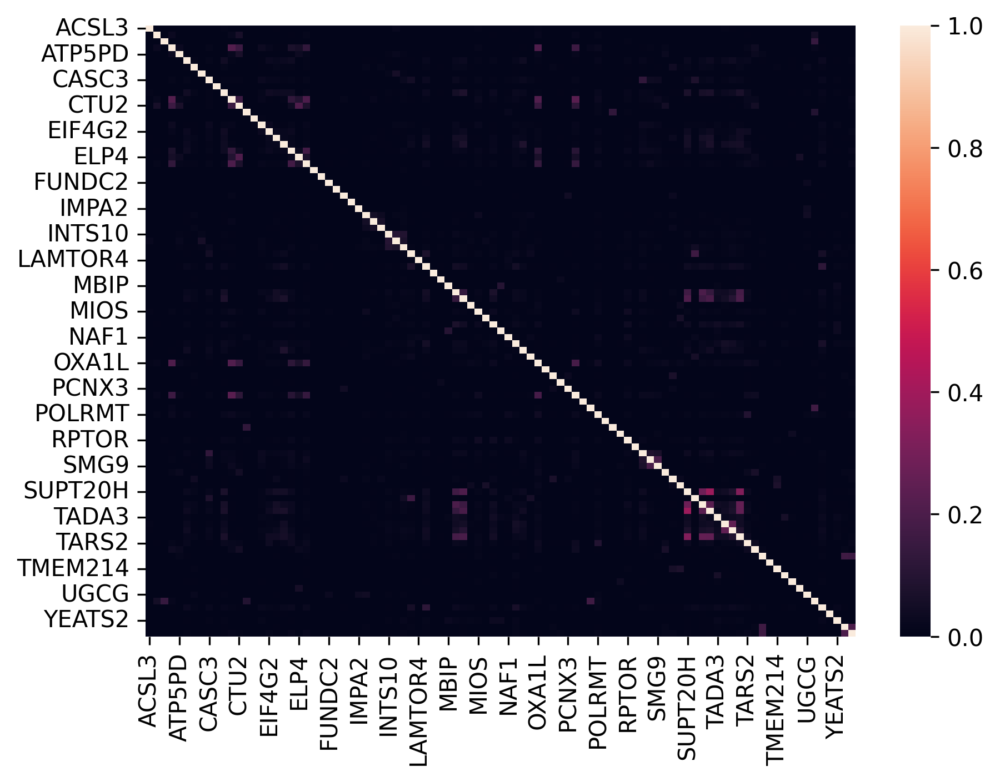

In [162]:
compare_cl_similarity = similarity.copy()
compare_cl_similarity.index = similarity.index.str.split('_').str[1]
compare_cl_similarity.columns = similarity.columns.str.split('_').str[1]

common_perts = np.intersect1d(replogle_perturb_clusters.index, compare_cl_similarity.index)
sns.heatmap(compare_cl_similarity.loc[common_perts, common_perts])

<Axes: >

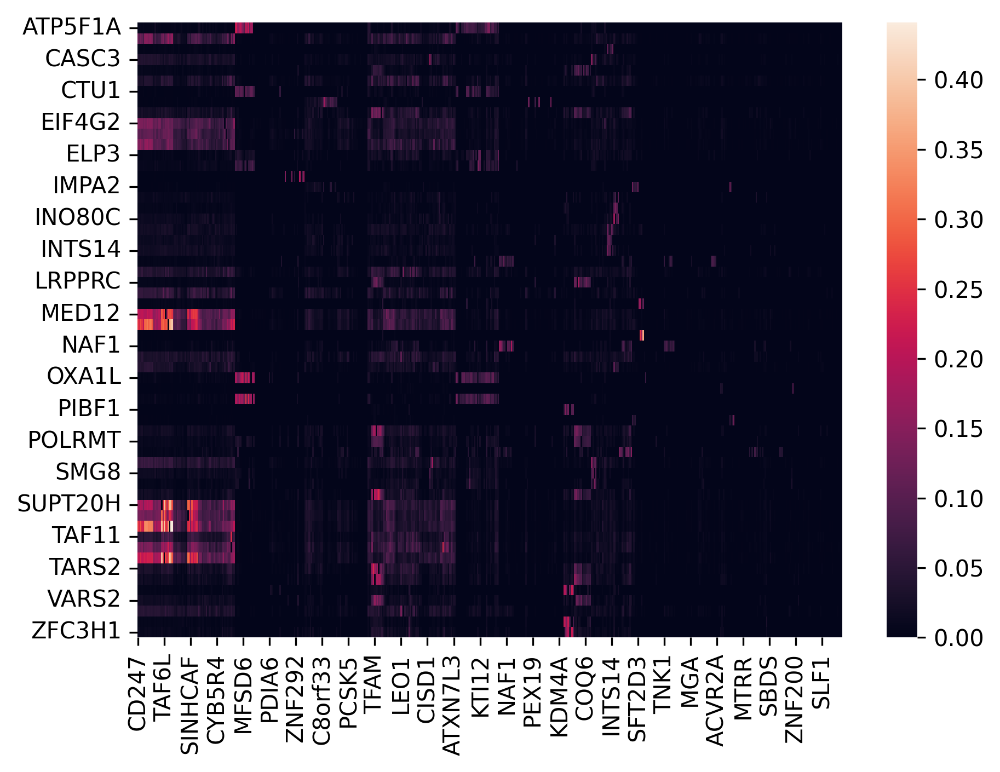

In [122]:
compare_cl_similarity = reordered_data.copy()
compare_cl_similarity.index = reordered_data.index.str.split('_').str[1]
compare_cl_similarity.columns = reordered_data.columns.str.split('_').str[1]

common_perts = np.intersect1d(compare_cl_similarity.index, same_cluster_replogle.index)
compare_cl_similarity.index

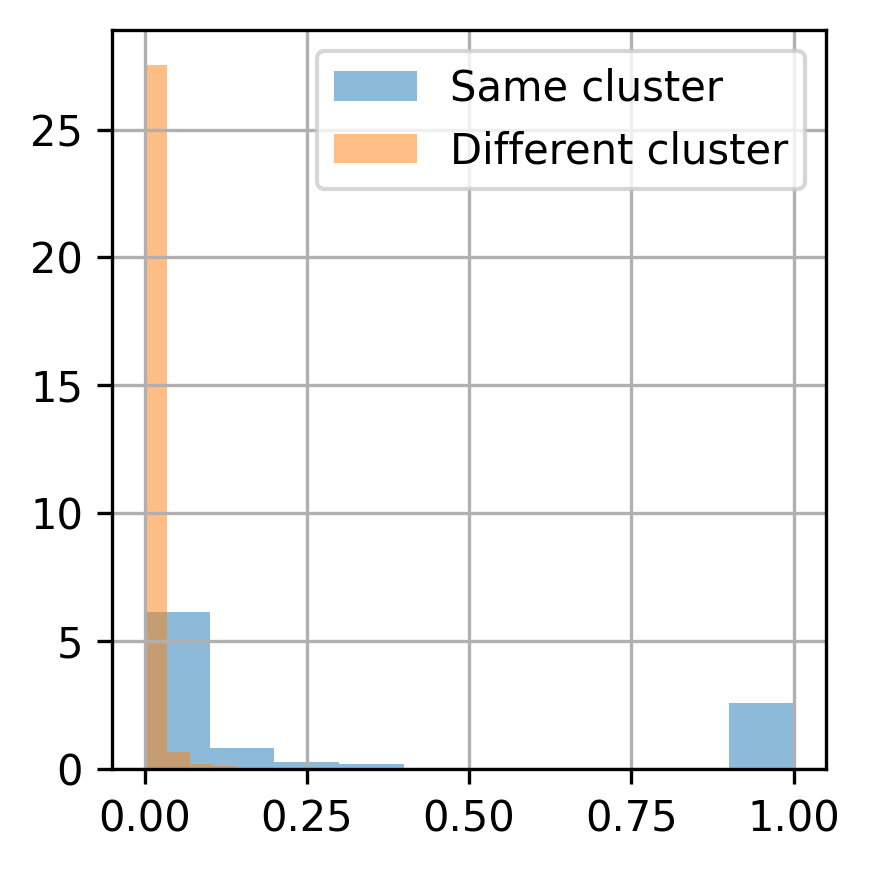

In [112]:
common_perts = np.intersect1d(compare_cl_similarity.index, same_cluster_replogle.index)
plt.figure(figsize=(3,3))
# Get values for both conditions
same_cluster = compare_cl_similarity.loc[common_perts, common_perts][same_cluster_replogle.loc[common_perts, common_perts] > 0].melt().dropna()['value']
diff_cluster = compare_cl_similarity.loc[common_perts, common_perts][same_cluster_replogle.loc[common_perts, common_perts] == 0].melt().dropna()['value']

# Plot normalized histograms by setting density=True
same_cluster.hist(density=True, alpha=0.5, label='Same cluster')
diff_cluster.hist(density=True, alpha=0.5, label='Different cluster')
plt.legend()

gene,ACSL3,ALG2,ANKRD39,ATP5F1A,ATP5PD,BRD8,C16orf87,C7orf26,CASC3,CLOCK,...,UBE2I,UBE3C,UGCG,VARS2,WDR61,WDR7,YARS2,YEATS2,ZC3H3,ZFC3H1
gene,,,,,,,,,,,,,,,,,,,,,
ACSL3,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ALG2,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ANKRD39,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ATP5F1A,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ATP5PD,0,0,0,1,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WDR7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
YARS2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
YEATS2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


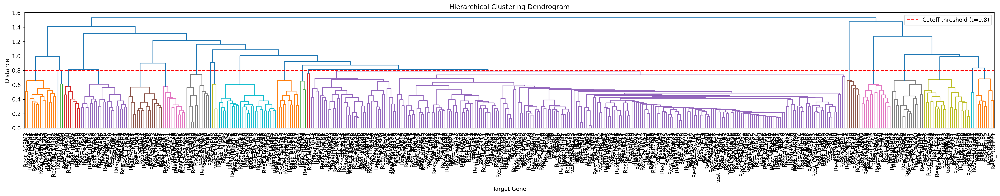

In [165]:
# Extract the clusters from the dendrogram
row_linkage = clustermap.dendrogram_row.linkage

# Plot the dendrogram separately to visualize the clustering

cutoff = 0.8
# Get the gene names for the filtered genes
filtered_genes = ordered_data.index.tolist()
# Create the dendrogram with gene names as labels
plt.figure(figsize=(25,5))
dendrogram = cluster.hierarchy.dendrogram(
    row_linkage, 
    color_threshold=cutoff,
    labels=filtered_genes
)
plt.axhline(y=cutoff, color='r', linestyle='--', label=f'Cutoff threshold (t={cutoff})')
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Target Gene')
plt.ylabel('Distance')
plt.legend()
plt.xticks(rotation=90, fontsize=10)  # Rotate labels for better readability
plt.tight_layout()
plt.show()

# Apply clustering with the chosen cutoff
row_clusters = cluster.hierarchy.fcluster(row_linkage, t=cutoff, criterion='distance')

# Create a dictionary mapping cluster IDs to gene names
cluster_dict = {}
filtered_genes = ordered_data.loc[shared_effects.sum(1) > 5].index
for i, gene in enumerate(filtered_genes):
    cluster_id = row_clusters[i]
    if cluster_id not in cluster_dict:
        cluster_dict[cluster_id] = []
    cluster_dict[cluster_id].append(gene)

In [48]:
suspects = de_counts[de_counts['offtarget_flag']]['target_name'].unique().tolist()

In [49]:
# Create a list of tuples with (gene, cluster_id) pairs
cluster_assignments = []
for cluster_id, genes in cluster_dict.items():
    for gene in genes:
        cluster_assignments.append((gene, cluster_id))

# Convert to DataFrame
cluster_df = pd.DataFrame(cluster_assignments, columns=['target_gene', 'cluster_id'])

# Sort by cluster_id and then by gene name for better readability
cluster_df = cluster_df.sort_values(['cluster_id', 'target_gene'])

cluster_df

,target_gene,cluster_id
195,Stim8hr_BTN3A1,1
196,Stim8hr_PTGDR,1
197,Stim8hr_SLC7A7,1
83,Stim8hr_FAM69A,2
85,Stim8hr_PCSK5,2
...,...,...
44,Stim8hr_SGF29,23
45,Stim8hr_SINHCAF,23
42,Stim8hr_STX16,23
41,Stim8hr_TADA1,23


Text(87.73878205128206, 0.5, 'Target gene')

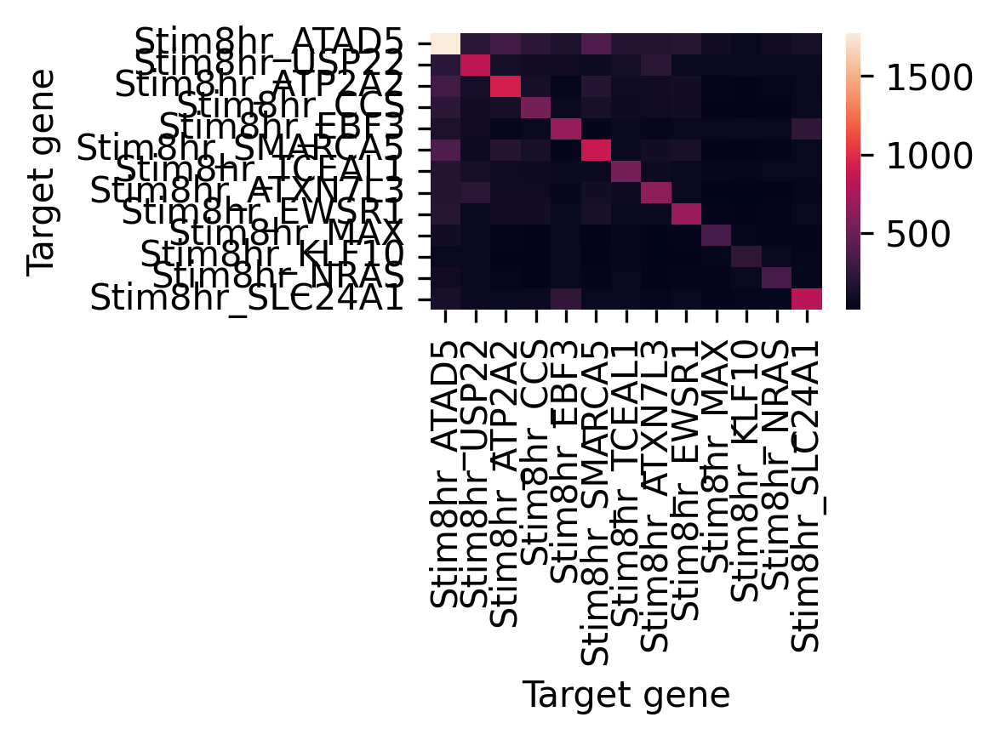

In [50]:
plt.figure(figsize = (4,3));
cl = 7
sns.heatmap(shared_effects.loc[cluster_dict[cl], cluster_dict[cl]], annot=False)
# Add proper axis labels to the main heatmap
plt.xlabel('Target gene')
plt.ylabel('Target gene')
# plt.title('N shared DE genes\n')

In [297]:
import gseapy as gp

def parse_gene_sets(filename):
   gene_sets = {}
   with open(filename, 'r') as f:
       for line in f:
           terms = line.strip().split('\t')
           gene_sets[terms[0]] = terms[2:]
   return gene_sets

OAKPATH = '/mnt/oak/'
# KEGG_sets = parse_gene_sets(f'{OAKPATH}/users/emma/data//KEGG_2019_Human.txt')
GO_BP_sets = parse_gene_sets(f'{OAKPATH}/users/emma/data/GO_Biological_Process_2023.txt')
GENESETS = {**GO_BP_sets}

# gl = cluster_dict[cl]
# background = adata_de.obs['target_contrast_gene_name'].unique().tolist()
background = shared_effects.index.tolist()

# # run enrichr
enr = gp.enrichr(gene_list=cluster_dict[cl],
                gene_sets=GENESETS,
                organism='Human', 
                background=background,
                outdir=None,
                no_plot=True
                )

enr.results[0:10]

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Odds Ratio,Combined Score,Genes
0,gs_ind_0,Antigen Receptor-Mediated Signaling Pathway (G...,1/36,0.036057,0.064658,49.394366,164.120996,BTN3A1
1,gs_ind_0,Inflammatory Response (GO:0006954),1/38,0.038034,0.064658,46.728000,152.766813,PTGDR
2,gs_ind_0,Negative Regulation Of DNA-templated Transcrip...,1/238,0.222410,0.236311,6.872842,10.331484,N4BP2L2
3,gs_ind_0,Negative Regulation Of Hematopoietic Progenito...,1/4,0.004050,0.017206,506.485714,2790.256157,N4BP2L2
4,gs_ind_0,Negative Regulation Of Stem Cell Differentiati...,1/5,0.005061,0.017206,393.800000,2081.723915,N4BP2L2
5,gs_ind_0,Negative Regulation Of Transcription By RNA Po...,1/181,0.172512,0.209479,9.232687,16.224506,N4BP2L2
6,gs_ind_0,Positive Regulation Of Cytokine Production (GO...,1/74,0.073165,0.101968,23.546939,61.576231,BTN3A1
7,gs_ind_0,Positive Regulation Of Gene Expression (GO:001...,1/79,0.077975,0.101968,22.008917,56.152746,BTN3A1
8,gs_ind_0,Positive Regulation Of Multicellular Organisma...,1/76,0.075091,0.101968,22.907285,59.308226,BTN3A1
9,gs_ind_0,Positive Regulation Of Stem Cell Proliferation...,1/2,0.002026,0.017206,1182.600000,7333.921203,N4BP2L2


In [298]:
cluster_dict[cl]

['PTGDR', 'N4BP2L2', 'BTN3A1']

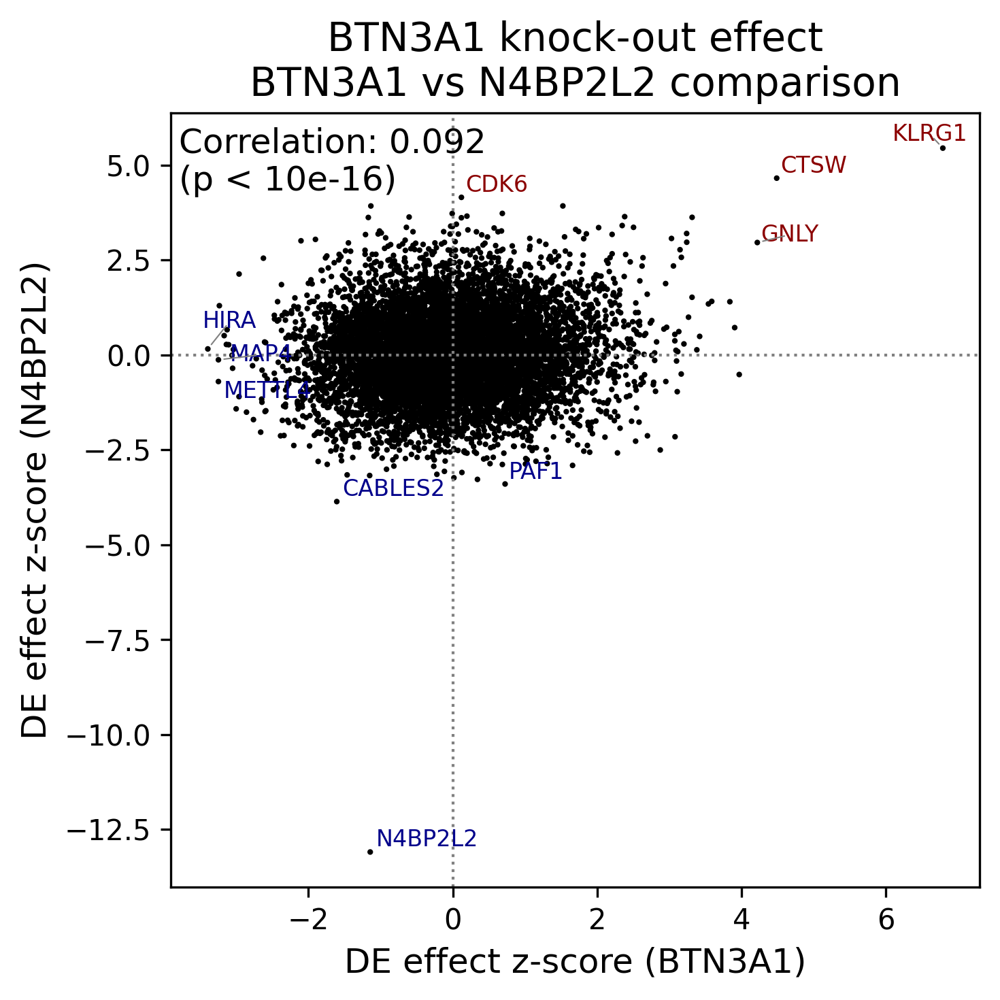

In [299]:
adata_de.var_names = adata_de.var['gene_name'].values

fig, axs = plt.subplots(figsize=(5,5))
res = plot_effect_comparison(
    adata_de, 
    comparison_params = {
        'target_contrast_gene_name':[ 'BTN3A1','N4BP2L2'],
        'culture_condition':['Stim8hr'],
        'stat':['zscore']
    },
    n_top_genes=3,
    plot_correlation=True,
    axis_label = 'DE effect z-score',
    corr_coords_xy = (0.01, 0.90),
    ax=axs
    )
    

In [42]:
# Compute long format for shared effects
long_shared_effects = shared_effects.reset_index().melt(
    id_vars=['target_contrast_gene_name'], 
    value_name='n_shared_effects',
    var_name='target_contrast_gene_name_2'
).sort_values('n_shared_effects', ascending=False)

# Remove self-comparisons
long_shared_effects = long_shared_effects[
    long_shared_effects['target_contrast_gene_name'] != long_shared_effects['target_contrast_gene_name_2']
]

# Compute long format for Jaccard index
long_jaccard_index = filtered_data.reset_index().melt(
    id_vars=['target_contrast_gene_name'],
    value_name='jaccard_index', 
    var_name='target_contrast_gene_name_2'
).sort_values('jaccard_index', ascending=False)

# Remove self-comparisons
long_jaccard_index = long_jaccard_index[
    long_jaccard_index['target_contrast_gene_name'] != long_jaccard_index['target_contrast_gene_name_2']
]

# Filter for at least some shared DE genes
long_jaccard_index = long_jaccard_index[long_jaccard_index.jaccard_index != 0].copy()

# Merge shared effects with Jaccard index
long_jaccard_index = long_jaccard_index.merge(
    long_shared_effects,
    on=['target_contrast_gene_name', 'target_contrast_gene_name_2'],
    how='left'
)

# Merge cluster information for both genes
long_jaccard_index = long_jaccard_index.merge(
    cluster_df.rename(columns={'target_gene': 'target_contrast_gene_name', 'cluster_id': 'cluster_id_1'}),
    on='target_contrast_gene_name',
    how='left'
).merge(
    cluster_df.rename(columns={'target_gene': 'target_contrast_gene_name_2', 'cluster_id': 'cluster_id_2'}),
    on='target_contrast_gene_name_2',
    how='left'
)

# Add column indicating if genes are in same cluster
long_jaccard_index['same_cluster'] = long_jaccard_index['cluster_id_1'] == long_jaccard_index['cluster_id_2']

# Keep only the first occurrence of each gene pair
long_jaccard_index['gene_pair'] = long_jaccard_index.apply(
    lambda x: tuple(sorted([x['target_contrast_gene_name'], x['target_contrast_gene_name_2']])), 
    axis=1
)

long_jaccard_index = long_jaccard_index.drop_duplicates(subset='gene_pair')
long_jaccard_index['gene_pair'] = long_jaccard_index['gene_pair'].apply(lambda x: ' - '.join(x))


KeyError: "The following id_vars or value_vars are not present in the DataFrame: ['target_contrast_gene_name']"

In [46]:
print(datadir)

/mnt/oak/users/emma/data/GWT/CD4iR1_Psomagen/


## Comparison with Replogle et al 2022

In [78]:
replogle_df = pd.read_csv('/Users/rzhu/Gladstone Dropbox/Ronghui Zhu/GRNPerturbSeq/2_files/Replogle_et_al_2022/perturbation_clusters.csv', index_col=0)

In [81]:
replogle_df.members

0                            AMMECR1,RAB4B,RNF11,SH3GL1
1                 ZNF326,COX6B1,COA8,SETX,SLC12A5,SPRY4
2     RAB5IF,EXOC5,PACS2,RAI14,SKIL,STARD10,ELOB,C16...
3                         DCAF11,HIPK3,NPC1,OXCT1,SYNJ2
4               ZC3H13,CBLL1,METTL14,METTL3,PSMG1,RBM15
                            ...                        
59    ACSS2,CEBPG,LRPPRC,MTPAP,PNPT1,POLRMT,SSBP1,TE...
60    CD3EAP,HEATR1,NOL11,POLR1A,POLR1B,POLR1C,POLR1...
61    CARF,CCDC86,DDX24,DDX51,DDX56,EIF6,ABCF1,GNL2,...
62    AARS,CHCHD4,DNAJA3,DNAJC19,EIF2B1,EIF2B2,EIF2B...
63                          MRPS21,MRPS23,MRPS28,MRPS35
Name: members, Length: 64, dtype: object

In [84]:
replogle_genes = []

# Iterate through each entry in the Series
for member_string in replogle_df.members:
    # Split the string by ', ' to get individual gene names
    genes = [gene.strip() for gene in member_string.split(',')]
    # Extend the long_list_of_genes with the extracted names
    replogle_genes.extend(genes)

In [87]:
gene_all = sgRNA.corrected_target_gene_name
two_donor_genes = adata_de.obs.target_contrast_gene_name.values
four_donor_genes = DE_obs.perturbed_gene_name

In [89]:
len(set(replogle_genes) & set(gene_all)) / len(gene_all)

0.026379742866102226

In [90]:
len(set(replogle_genes) & set(two_donor_genes)) / len(two_donor_genes)

0.01175262437243268

In [98]:
len(set(replogle_genes) & set(two_donor_genes)) / len(replogle_genes)

0.29219858156028367

In [99]:
len(set(replogle_genes) - set(two_donor_genes)) / len(replogle_genes)

0.7049645390070922

In [100]:
len(set(replogle_genes) & set(four_donor_genes)) / len(replogle_genes)

0.4879432624113475

In [101]:
len(set(replogle_genes) - set(four_donor_genes)) / len(replogle_genes)

0.5092198581560283

In [147]:
perturbation_counts = pd.read_csv('/Users/rzhu/Gladstone Dropbox/Ronghui Zhu/GRNPerturbSeq/3_expts/processed_data/CD4iR1_Psomagen/perturbation_counts.csv')
sgRNA_dist = pd.DataFrame({'gene': perturbation_counts.guide_id.str[:-2], 'count': np.sum(perturbation_counts.iloc[:,1:], axis=1)})
sgRNA_dist = sgRNA_dist.groupby('gene')['count'].sum().reset_index()

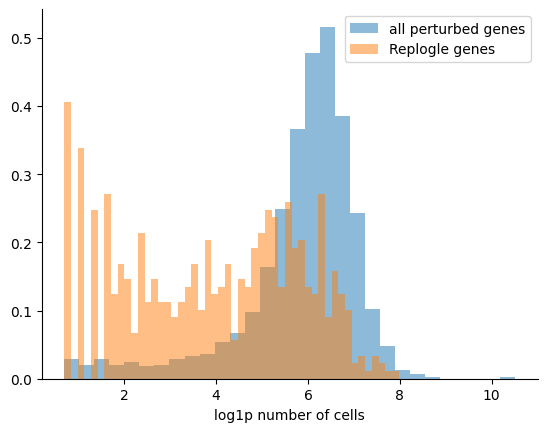

In [159]:
plt.hist(np.log1p(sgRNA_dist['count'].values), bins=30, density=True, alpha=0.5)
plt.hist(np.log1p(sgRNA_dist.loc[sgRNA_dist.gene.isin(replogle_genes), 'count']), bins=50, density=True, alpha=0.5)
plt.legend(['all perturbed genes', 'Replogle genes'])
plt.xlabel('log1p number of cells')
sns.despine()

In [160]:
DE_obs

,10xrun_id,cell_sample_id,donor_id,culture_condition,guide_id,perturbed_gene_name,perturbed_gene_id,guide_type,n_cells,total_counts,keep_min_cells,keep_effective_guides,keep_total_counts,keep_for_DE,keep_test_genes,log10_n_cells
CD4i_R2_D1_Stim48hr_A1BG-1,CD4i_R2,CD4i_R2_D1_Stim48hr,CE0008162,Stim48hr,A1BG-1,A1BG,ENSG00000121410,targeting,26.0,326500.0,True,True,True,True,True,1.414973
CD4i_R2_D1_Stim48hr_A1BG-2,CD4i_R2,CD4i_R2_D1_Stim48hr,CE0008162,Stim48hr,A1BG-2,A1BG,ENSG00000121410,targeting,160.0,2313880.0,True,True,True,True,True,2.204120
CD4i_R2_D1_Stim48hr_A2M-2,CD4i_R2,CD4i_R2_D1_Stim48hr,CE0008162,Stim48hr,A2M-2,A2M,ENSG00000175899,targeting,22.0,330204.0,True,True,True,True,True,1.342423
CD4i_R2_D1_Stim48hr_AAAS-1,CD4i_R2,CD4i_R2_D1_Stim48hr,CE0008162,Stim48hr,AAAS-1,AAAS,ENSG00000094914,targeting,95.0,1389867.0,True,True,True,True,True,1.977724
CD4i_R2_D1_Stim48hr_AACS-1,CD4i_R2,CD4i_R2_D1_Stim48hr,CE0008162,Stim48hr,AACS-1,AACS,ENSG00000081760,targeting,73.0,1064913.0,True,True,True,True,True,1.863323
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CD4i_R2_D4_Rest_ZYG11B-2,CD4i_R2,CD4i_R2_D4_Rest,CE0006864,Rest,ZYG11B-2,ZYG11B,ENSG00000162378,targeting,8.0,66171.0,True,True,True,True,True,0.903090
CD4i_R2_D4_Rest_ZYX-2,CD4i_R2,CD4i_R2_D4_Rest,CE0006864,Rest,ZYX-2,ZYX,ENSG00000159840,targeting,39.0,318693.0,True,True,True,True,True,1.591065
CD4i_R2_D4_Rest_ZYX-3,CD4i_R2,CD4i_R2_D4_Rest,CE0006864,Rest,ZYX-3,ZYX,ENSG00000159840,targeting,31.0,247297.0,True,True,True,True,True,1.491362
CD4i_R2_D4_Rest_ZZEF1-1,CD4i_R2,CD4i_R2_D4_Rest,CE0006864,Rest,ZZEF1-1,ZZEF1,ENSG00000074755,targeting,100.0,1050023.0,True,True,True,True,True,2.000000


In [139]:
sgRNA_dist['count']

0         132.0
1         451.0
2          38.0
3         220.0
4         230.0
          ...  
25114     159.0
25115    1702.0
25116     529.0
25117    1000.0
25118     329.0
Name: count, Length: 25119, dtype: float64